# Modelando la Pandemia

  En este proyecto vamos a estudiar y analizar los datos mundiales de la pandemia COVID-19 usando países modelo de distintas políticas públicas para luego interpretar otras curvas.

Puedes descargar el dataset de casos totales, divididos por país [aquí.](
https://ourworldindata.org/coronavirus-data?country=
) Descarga los datos  formato .csv luego podrás cargarlos en el notebook usando pandas, a partir de eso selecciona los de los países que te interesan, hay un ejemplo de cómo se hace esto en este notebook. 

# ¿Cómo empezó la pandemia?


  La primer parte del trabajo consiste en estudiar cómo se empieza a propagar la pandemia, luego analizaremos las medidas tomadas y su efectividad.

  Al inicio de una pandemia, se estima que los contagios siguen una ley exponencial, esa es la fase de "crecimiento exponencial", luego hay un decaimiento dado por la inmunidad. 

  Los datos de casos confirmados en función del tiempo $C(t)$, pueden aproximarse con el modelo

$C(t)=e^{k(t-t_0)}$

donde $t_0$ es la fecha del primer contagio, y $k$ es un parámetro propio de cada enfermedad, que habla de la contagiosidad. Cuanto mayor es $k$, más grande será el número de casos confirmados dado por la expresión. $k$ depende del tiempo que una persona enferma contagia, el nivel de infecciosidad del virus y cuántas personas que se pueden contagiar por una persona enferma por día. Es decir, la circulación. Haciendo cuarententa, $k$ disminuye, con la circulación $k$ aumenta.

  El parámetro $k$ está directamente relacionado con el $R$ del que tanto se habla en los medios. En este proyecto haremos foco en $k$, pero puedes profundizar sobre esto si quieres, empezandó por [aquí](https://es.wikipedia.org/wiki/Ritmo_reproductivo_b%C3%A1sico). 

  Es posible hacer un modelo completo, pero para eso es necesario utilizar ecuaciones diferenciales. Si quieres profundizar sobre eso, busca información sobre "modelo epidemiológico SEIR". Si quieres ver cómo funciona este modelo, puedes empezar por [aquí](http://gabgoh.github.io/COVID/index.html). En ese link está implementado el modelo SEIR (no es necesario entender las ecuaciones en este caso) y el rol que cumplen los parámetros, puedes explorar el impacto de variar $R$ y el resto de los valores para ver cómo impactan en la curva de contagios. Ahora utilizaremos la siguiente expresión para describir únicamente la etapa de crecimiento exponencial.


  Comienza estudiando cómo se distribuyó el $k$ inicial de la pandemia y si es posible elaborar un intervalo de confianza razonable para este valor. Para eso 
  
  1. Elegir diez países del norte (ahí empezó la pandemia) y puedes mide el valor de $k$ inicial de la pandemia, analizando datos del primer tramo.

  2. Analiza si es posible estimar la evolución mundial de la pandemia a partir de lo que obtuviste. Para esto, puedes elaborar un intervalo de confianza para $k$ a partir de los que obtuviste y así generar un modelo nuevo, basado en la distribución de $k$. Luego compara el modelo con los datos mundiales.

3. Piensa qué significa que el modelo dé "bien" o dé "mal" ¿qué indicadores de esto existen?. Luego discute en el informe por qué crees que dio así. Recuerda que es importante elegir bien la población de muestra. Piensa qué criterios puedes elegir para representar bien la población mundial que se contagió al inicio de la pandemia.
 
 # Evaluando estrategias

 Ahora que tienes una manera de obtener información de las curvas, puedes intentar evaluar las estrategias de acción y el comportamiento de las poblaciones, construyendo un clasificador binario. 
1. Elige una categoría binaria que hable de políticas públicas elegidas por los países para enfrentar la pandemia que te interese estudiar, como pueden ser "la población hizo cuarententa" o "la población se vacunó".
2. Piensa qué indicadores de la curva pueden hablar del éxito de la política que quieres estudiar. Por ejemplo, si se tratase de evaluar el éxito de una cuarentena podría ser porcentaje de población  que se contagió o variación del valor de $k$ a partir de que se empezó a implementar esa medida. Elige al menos 3 indicadores.
3. Investiga sobre países que hayan aplicado o no esa política pública, para generar una base de datos. Por ejemplo, Brasil no hizo cuarentena y China hizo una muy estricta. Recuerda hacer una selección inteligente de la porción de datos de la curva de cada país que vas a analizar.
4. Construye un clasificador binario a partir de una regresión logística o usando Naive Bayes para intentar analizar la estrategia de otros países y ver si es posible predecirla a partir de la curva de contagios y el clasificador. Un posible clasificador binario es uno que clasifique el porcentaje de contagios en función da las categorías "la población hizo cuarentena" y "la población n hizo cuarentena". Haz esto para los 3 indicadores que elegiste en el punto 3 y compara los resultados.
5. Elabora un informe con lo que hayas aprendido a lo largo de este proyecto, donde discutas la utilidad o no de los indicadores que elegiste y del análisis estadístico propuesto.

#¡Comencemos!

  A continuación dejamos un ejemplo de cómo extraer el $k$ inicial de Argentina, usando un ajuste de cuadrados mínimos. Si necesitas los datos mundiales, en la columna de países aparecen como "World".



# Modelando la Pandemia

### ¿Cómo empezó la pandemia? ###


  La primer parte del trabajo consiste en estudiar cómo se empieza a propagar la pandemia, luego analizaremos las medidas tomadas y su efectividad.
  
  Los datos de casos confirmados en función del tiempo $C(t)$, pueden aproximarse con el modelo

$C(t)=e^{k(t-t_0)}$

donde $t_0$ es la fecha del primer contagio, y $k$ es un parámetro propio de cada enfermedad, que habla de la contagiosidad. Cuanto mayor es $k$, más grande será el número de casos confirmados dado por la expresión. $k$ depende del tiempo que una persona enferma contagia, el nivel de infecciosidad del virus y cuántas personas que se pueden contagiar por una persona enferma por día. Es decir, la circulación. Haciendo cuarententa, $k$ disminuye, con la circulación $k$ aumenta.

El parámetro $k$ está directamente relacionado con el $R$ del que tanto se habla en los medios

## **EXPLORACIÓN DE DATOS Y MEDICIÓN DE K**

In [1]:
import numpy as np
import pandas as pd
import pylab as plt
import matplotlib.pyplot as pl
from scipy.optimize import curve_fit
from datetime import date
from scipy.stats import norm
import scipy.stats as stats
import seaborn as sns
from datetime import datetime
import datetime as dt
from sklearn.metrics import mean_squared_error, mean_absolute_error
from matplotlib.dates import DateFormatter
import matplotlib.dates as mdates
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import cross_validate
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from sklearn.metrics import accuracy_score, confusion_matrix, recall_score

Importamos las librerías para el proyecto

In [2]:
from IPython.display import Markdown, display
def printmd(string):
    display(Markdown(string))

Importamos la librería y hacemos función para poder manejar mejor el Markdown.

### VISUALIZACIÓN DEL DATASET ###

In [3]:
datos=pd.read_csv('owid-covid-data.csv')
datos

,iso_code,continent,location,date,total_cases,new_cases,new_cases_smoothed,total_deaths,new_deaths,new_deaths_smoothed,...,cardiovasc_death_rate,diabetes_prevalence,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,human_development_index,excess_mortality_cumulative,excess_mortality
0,AFG,Asia,Afghanistan,2020-02-24,5.0,5.0,NaN,NaN,NaN,NaN,...,597.029,9.59,NaN,NaN,37.746,0.5,64.83,0.511,NaN,NaN
1,AFG,Asia,Afghanistan,2020-02-25,5.0,0.0,NaN,NaN,NaN,NaN,...,597.029,9.59,NaN,NaN,37.746,0.5,64.83,0.511,NaN,NaN
2,AFG,Asia,Afghanistan,2020-02-26,5.0,0.0,NaN,NaN,NaN,NaN,...,597.029,9.59,NaN,NaN,37.746,0.5,64.83,0.511,NaN,NaN
3,AFG,Asia,Afghanistan,2020-02-27,5.0,0.0,NaN,NaN,NaN,NaN,...,597.029,9.59,NaN,NaN,37.746,0.5,64.83,0.511,NaN,NaN
4,AFG,Asia,Afghanistan,2020-02-28,5.0,0.0,NaN,NaN,NaN,NaN,...,597.029,9.59,NaN,NaN,37.746,0.5,64.83,0.511,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
118388,ZWE,Africa,Zimbabwe,2021-09-17,127632.0,264.0,209.857,4562.0,2.0,4.286,...,307.846,1.82,1.6,30.7,36.791,1.7,61.49,0.571,NaN,NaN
118389,ZWE,Africa,Zimbabwe,2021-09-18,127739.0,107.0,217.000,4563.0,1.0,3.857,...,307.846,1.82,1.6,30.7,36.791,1.7,61.49,0.571,NaN,NaN
118390,ZWE,Africa,Zimbabwe,2021-09-19,127938.0,199.0,238.429,4567.0,4.0,4.143,...,307.846,1.82,1.6,30.7,36.791,1.7,61.49,0.571,NaN,NaN
118391,ZWE,Africa,Zimbabwe,2021-09-20,128186.0,248.0,255.286,4569.0,2.0,3.714,...,307.846,1.82,1.6,30.7,36.791,1.7,61.49,0.571,NaN,NaN


Importamos el dataset y lo visualizamos

In [4]:
datos2 = datos.copy()
datos2.date = pd.to_datetime(datos.date)
datos3 = datos2.sort_values(by = 'date')
datos3.head()

,iso_code,continent,location,date,total_cases,new_cases,new_cases_smoothed,total_deaths,new_deaths,new_deaths_smoothed,...,cardiovasc_death_rate,diabetes_prevalence,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,human_development_index,excess_mortality_cumulative,excess_mortality
84258,PER,South America,Peru,2020-01-01,NaN,NaN,NaN,NaN,NaN,NaN,...,85.755,5.95,4.8,NaN,NaN,1.60,76.74,0.777,NaN,NaN
4217,ARG,South America,Argentina,2020-01-01,NaN,NaN,NaN,NaN,NaN,NaN,...,191.032,5.50,16.2,27.7,NaN,5.00,76.67,0.845,NaN,NaN
68820,MEX,North America,Mexico,2020-01-01,NaN,NaN,NaN,NaN,NaN,NaN,...,152.783,13.06,6.9,21.4,87.847,1.38,75.05,0.779,NaN,NaN
84259,PER,South America,Peru,2020-01-02,NaN,NaN,NaN,NaN,NaN,NaN,...,85.755,5.95,4.8,NaN,NaN,1.60,76.74,0.777,NaN,NaN
4218,ARG,South America,Argentina,2020-01-02,NaN,NaN,NaN,NaN,NaN,NaN,...,191.032,5.50,16.2,27.7,NaN,5.00,76.67,0.845,NaN,NaN


Observamos los datos ordenados por fecha y vemos que el primer día del dataset es el 01/01/2020, pero al no tener todos los países casos en esa fecha la columna de 'total_cases' aparece con nulos para varios países.

In [5]:
datos2.columns

Index(['iso_code', 'continent', 'location', 'date', 'total_cases', 'new_cases',
       'new_cases_smoothed', 'total_deaths', 'new_deaths',
       'new_deaths_smoothed', 'total_cases_per_million',
       'new_cases_per_million', 'new_cases_smoothed_per_million',
       'total_deaths_per_million', 'new_deaths_per_million',
       'new_deaths_smoothed_per_million', 'reproduction_rate', 'icu_patients',
       'icu_patients_per_million', 'hosp_patients',
       'hosp_patients_per_million', 'weekly_icu_admissions',
       'weekly_icu_admissions_per_million', 'weekly_hosp_admissions',
       'weekly_hosp_admissions_per_million', 'new_tests', 'total_tests',
       'total_tests_per_thousand', 'new_tests_per_thousand',
       'new_tests_smoothed', 'new_tests_smoothed_per_thousand',
       'positive_rate', 'tests_per_case', 'tests_units', 'total_vaccinations',
       'people_vaccinated', 'people_fully_vaccinated', 'total_boosters',
       'new_vaccinations', 'new_vaccinations_smoothed',
       't

**Visualizamos los datos del dataset según lo que está en la página del dataset:
https://github.com/owid/covid-19-data/tree/master/public/data**

<u>**Casos Confirmados**</u>\
**total_cases**: Casos totales confirmados de COVID-19.\
**new_cases**: Nuevos casos confirmados de COVID-19\
**new_cases_smoothed**: Nuevos caoss confirmados de COVID-19 (7-días suavizado)\
**total_cases_per_million**: casos totales confirmados de COVID-19 cada 1,000,000 habitantes\
**new_cases_per_million**: Nuevos casos confirmados de COVID-19 cada 1,000,000 habitantes\
**new_cases_smoothed_per_million**: Nuevos casos confirmados de COVID-19 (7-días suavizado) cada 1,000,000 habitantes

<u>**Muertes confirmadas**</u>\
**total_deaths**: Muertes totales atribuídas al COVID-19\
**new_deaths**: Nuevas muertes atribuídas al COVID-19\
**new_deaths_smoothed**: Nuevas muertes atribuídas al COVID-19 (7-días suvizado)\
**total_deaths_per_million**: Muertes totales atribuídas al COVID-19 cada 1,000,000 habitantes\
**new_deaths_per_million**: Nuevas muertes atribuídas al COVID-19 cada 1,000,000 habitantes\
**new_deaths_smoothed_per_million**: Nuevas muertes atribuídas al COVID-19 (7-días suavizado) cada 1,000,000 habitantes.

<u>**Exceso de mortalidad**</u>\
**excess_mortality**: Diferencia porcentual entre el número de muertes semanal o mensual entre el 2020 y el 2021 y la proyección del total de muertes para el mismo periodo basado en años anteriores.\
**excess_mortality_cumulative**: Diferencia porcentual entre la muertes acumuladas desde el 1 de Enero de 2020 y la acumulación de muertes proyectadas para el mismo periodo basado en años anteriores.\
**excess_mortality_cumulative_absolute**: Diferencia acumulada entre el número de muertes reportado desde el 1 de Enero de 2020 y el número de muertes proyectado para el mismo periodo basado en años anteriores.\
**excess_mortality_cumulative_per_million**: Diferencia acumulada entre el nùmero reportado de muertes desde Enero de 2020 y el nùmero proyectado de muertes para el mismo periodo basado en años anteriores, por millón de habitantes.

<u>**Hospital e ICU**</u>\
**icu_patients**: Número de pacientes COVID-19 en unidades de terapia intensiva(ICUs) por día.\
**icu_patients_per_million**: Número de pacientes de COVID-19 en unidades de terapia intensiva (ICUs) en un día cada 1,000,000 habitantes.\
**hosp_patients**: Número de pacientes COVID-19 en un hospital por día.\
**hosp_patients_per_million**: Número de pacientes COVID-19 en un hospital por día, cada 1,000,000 habitantes.\
**weekly_icu_admissions**: Número de pacientes COVID-19 admitidos nuevos en terapia intensiva (ICUs) por semana.\
**weekly_icu_admissions_per_million**: Número de pacientes COVID-19 admitidos nuevos en terapia intensiva(ICUs) por semana, cada 1,000,000 habitantes.\
**weekly_hosp_admissions**: Número de pacientes COVID-19 admitidos nuevos en hospitales por semana.\
**weekly_hosp_admissions_per_million**: Número de pacientes COVID-19 admitidos nuevos en hospitales por semana, cada 1,000,000 habitantes.

<u>**Respuestas Políticas**</u>\
**stringency_index**: Índice de restricción de respuestas guvernamentales: Medida compuesta basado en 9 indicadores incluídos el cierre de escuelas, cierre de luegares de trabajo, prohibiciones de viaje, escalado al valor de 0 a 100 (100 = respusta más estricta).

<u>**Ratio de Reproducción**</u>\
**reproduction_rate**: Estimación del ratio de reproducción de casos de COVID-19 en tiempo real.

<u>**Tests y positividad**</u>\
**total_tests**: Tests totales para COVID-19.\
**new_tests**: Nuevos tests para COVID-19 (solo calculado en días consecutivos).\
**total_tests_per_thousand**: Tests totales para COVID-19 cada 1,000 habitantes.\
**new_tests_per_thousand**: Nuevos tests para COVID-19 cada 1,000 habitantes.\
**new_tests_smoothed**: Tests nueov para COVID-19 (7-días suavizado). Para países que no reportan datos de tests diariamente, asumimos que el testeo cambió en una base diaria en los periodos en los que los datos no fueron reportados. Esto produce una seri completa de fiugras diarias que luego en promediada en una ventana de 7 días.
**new_tests_smoothed_per_thousand**: Nuevos tests COVID-19 (suavizado en 7-días) cada 1,000 habitantes.\
**positive_rate**: La cantidad de tests para COVID-19 que son positivos, en una ventana de promedio de 7-días (esto es lo inverso de tests_per_case)\
**tests_per_case**: Tests hechos por caso nuevo confirmado para COVID-19, en una ventana de promedio de 7-días (esto es lo inverso de  positive_rate)\
**tests_units**: Unidades usadas para reportar los datos de los tests.

<u>**Vacunas**</u>\
**total_vaccinations**: Número de vacunas totales para COVID-19 administered.\
**people_vaccinated**: Núemero total de personas que recivieron por lo menor una dosis de vacuna COVID-19.\
**people_fully_vaccinated**: Número total de personas que recibieron el esquema de vacuncación completo según lo prescripto por el protocolo de vacunación.\
**total_boosters**: Número total de vacunas para COVID-19 extra del protocolo de vacuncación.\
**new_vaccinations**: Nuevas vacunas para COVID-19 administradas (solo calculadas para días consecutivos).\
**new_vaccinations_smoothed**: Nuevas vacunas para COVID-19 administradas (suavizado en 7-días). Para los países que no reportaron datos de vacunas en una base diaria, se asume que la vacunación cambió de manera equitativa sobre una base diaria en los periodos que hay datos faltantes. Esto produce una serie de figuras diarias que luego son promediadas en ventanas de 7 días.\
**total_vaccinations_per_hundred**: Número total de vacunas para COVID-19 administradas cada 100 habitantes sobre el total de la población.\
**people_vaccinated_per_hundred**: Número total de personas que recibieron por lo menos una dosis de vacuna cada 100 perosnas sobre el total de la población.\
**people_fully_vaccinated_per_hundred**: Nñuermo total de personas que recibieron todas las dosis prescriptas por el protocolo de vacunación cada 100 personas sobre el total de la población.\
**total_boosters_per_hundred**: Número total de vacunas para el COVID-19 extra administradas cada 100 habitantes sobre el total de la población.\
**new_vaccinations_smoothed_per_million**: Nuevas vacunas para COVID-19 administradas (suavizado en 7-días) cada 1,000,000 de habitantes sobre el total de la población.

<u>**Otros**</u>\
**iso_code**: ISO 3166-1 alpha-3 – Código de países de tres letras.\
**continent**: Continente del país.\
**location**: Lugar geográfico.\
**date**: Fecha de observación.\
**population**: Población en 2020.\
**population_density**: Número de personas divididos por el área del país, medido en kilómetros cuadrados, el año más reciente disponible.\
**median_age**: Edad media de la población, proyección de la UN para el 2020.\
**aged_65_older**: Porción de la población que tiene 65 años o más, año más reciente disponible.\
**aged_70_older**: Porción de la población que tien 70 años o más en 2015.\
**gdp_per_capita**: Producto bruto interno para la capacidad de compra (al dolar del 2011 dolar internacional), año más próximo disponible.\
**extreme_poverty**: Porción de la población viviendo en extrema pobreza, año más póximo disponible desde 2010.\
**cardiovasc_death_rate**: Ratio de muertes por enfermedades cardiovasculares en 2017 (número de muertes anuales cada 100,000 habitantes).\
**diabetes_prevalence**: Prevalencia de diabetes (% de la población entre 20 a 79 años) en 2017.\
**female_smokers**: Porción de mujeres que suman, año más reciente disponible.\
**male_smokers**: Porción de hombres que fuman, año más reciente disponible.\
**handwashing_facilities**: Porciòn de la población con facilidades sobre premisas para el lavado de manos, año más reciente disponible.\
**hospital_beds_per_thousand**: Camas de hospitales disponibles cada 1,000 personas,año más reciente disponible desde 2010.\
**life_expectancy**: Expectativas de vida en el nacimiento en 2019.\
**human_development_index**: Índice del promedio de medida compuesta del desarrollo en tres dimensiones humanas básicas- un vida larga y sana, conocimiento y un standard de vida decente. 

Observamos que nuestro dataset muestra los casos de COVID 19 en el mundo, por país, por fecha, junto con muchos otros indicadores importantes como son las vacunas, los tests hechos, índice de cierre del país, hospitalizaciones y muchas otras.

### EXPLORACIÓN DE K INICIAL ###

##### <U>K INCIAL ARGENTINA</U> ###

Para estudiar el K inicial vamos a empezar usando Argentina. Para tener buenas comparaciones vamos a usar la columna de 'total_cases' para los casos de coronavirus.

In [6]:
datosarg = datos2[datos2.location == 'Argentina']
datosarg_1 = datosarg[['location','date', 'total_cases']]
datosarg_1.head()

,location,date,total_cases
4217,Argentina,2020-01-01,NaN
4218,Argentina,2020-01-02,NaN
4219,Argentina,2020-01-03,NaN
4220,Argentina,2020-01-04,NaN
4221,Argentina,2020-01-05,NaN


Visualizamos los casos de Argentina filtrando por Argentina y nos vamos a quedar con las columnas que nos interesan ahora.

In [7]:
datosarg2 = datosarg_1.dropna(subset = ['total_cases'])
datosarg3 = datosarg2.sort_values(by = 'date')
datosarg3

,location,date,total_cases
4279,Argentina,2020-03-03,1.0
4280,Argentina,2020-03-04,1.0
4281,Argentina,2020-03-05,1.0
4282,Argentina,2020-03-06,2.0
4283,Argentina,2020-03-07,8.0
...,...,...,...
4842,Argentina,2021-09-17,5237159.0
4843,Argentina,2021-09-18,5238610.0
4844,Argentina,2021-09-19,5239232.0
4845,Argentina,2021-09-20,5241394.0


Sacamos los nulos de total_cases y vemos que la primera fecha es el 03 de Marzo del 2020.

In [8]:
num = date(2020,3,3) - date(2020,1,1)
print(num)

62 days, 0:00:00


Vemos que del 03 de Marzo al primero de Enero hay 62 días, lo cuál el día 0 del primer caso en Argentina es el día 62 del dataset original.

Text(0, 0.5, 'cantidad de casos')

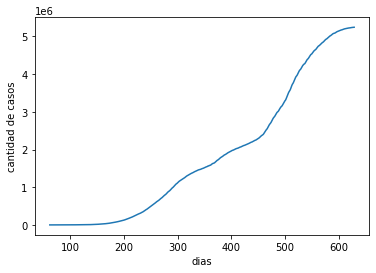

In [9]:
#seleccionamos Argentina
paises= datos2['location'] #cargo el vector de paises
confirmados= datos2['total_cases'] #carga vector todos los casos confirmados

#Cargamos en paises todos los paises y en confirmados todos los casos confirmados.

ind_arg=np.where(paises=='Argentina')
ind_arg=ind_arg[0]
casos_arg=confirmados[ind_arg]
dias=np.arange(0,len(casos_arg))
plt.plot(dias,casos_arg)
plt.xlabel('dias')
plt.ylabel('cantidad de casos')

Esta es la curva de **casos totales** de la Argentina. Aquí no se ven las olas, ya que estas se ven en la curva de casos confirmados por día, es decir, de casos nuevos. Esta habla de los acumulados, entonces siempre se agregan.

Text(0, 0.5, 'log cantidad de casos')

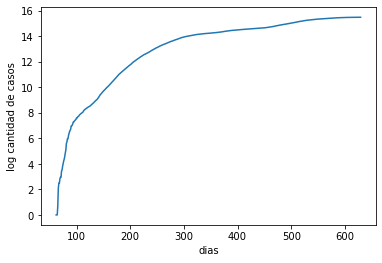

In [10]:
#seleccionamos Argentina
paises= datos2['location'] #cargo el vector de paises
confirmados= datos2['total_cases'] #carga vector todos los casos confirmados

ind_arg = np.where(paises=='Argentina')
ind_arg2 = ind_arg[0]
casos_arg= confirmados[ind_arg2]
dias= np.arange(0,len(casos_arg))

casos_argLog = np.log(casos_arg) 

plt.plot(dias,casos_argLog)
plt.xlabel('dias')
plt.ylabel('log cantidad de casos')

Para ver mejor la curva, tomamos el logartimo de los datos. Una curva exponencial se ve lineal en escala logarítmica

Text(0, 0.5, 'cantidad de casos')

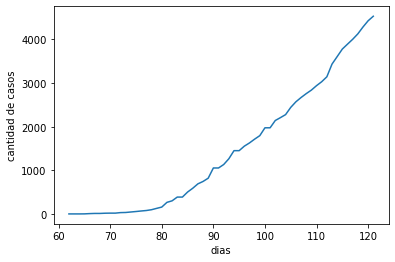

In [11]:
#seleccionamos Argentina
paises= datos2['location'] #cargo el vector de paises
confirmados= datos2['total_cases'] #carga vector todos los casos confirmados

ind_arg = np.where(paises=='Argentina')
ind_arg2 = ind_arg[0]
casos_arg= confirmados[ind_arg2]
dias= np.arange(0,len(casos_arg))

casos_principio=casos_arg[62:122]
dias_principio=dias[62:122]

plt.plot(dias_principio,casos_principio)
plt.xlabel('dias')
plt.ylabel('cantidad de casos')

Veamos lo que pasa en los primeros 60 días desde que se detectó el primer caso en Argentina, para ver cómo fue el $k$ inicial. El día 0 de Argetina sería el día 62 del dataset y el día 60 el día 122 del dataset.

Text(0, 0.5, 'log cantidad de casos')

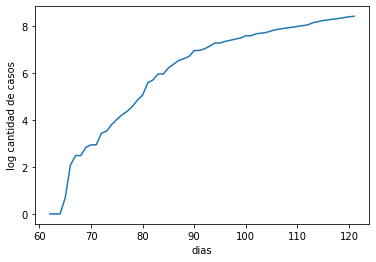

In [12]:
#seleccionamos Argentina
paises= datos2['location'] #cargo el vector de paises
confirmados= datos2['total_cases'] #carga vector todos los casos confirmados

ind_arg = np.where(paises=='Argentina')
ind_arg2 = ind_arg[0]
casos_arg= confirmados[ind_arg2]
dias= np.arange(0,len(casos_arg))

casos_principio=casos_arg[62:122]
dias_principio=dias[62:122]

plt.plot(dias_principio,np.log(casos_principio))
plt.xlabel('dias')
plt.ylabel('log cantidad de casos')

Analicemos qué pasa en escala logarítmica.

Text(0, 0.5, 'cantidad de casos')

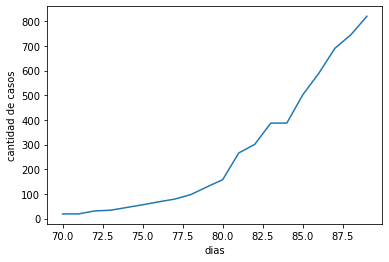

In [13]:
#seleccionamos Argentina
paises= datos2['location'] #cargo el vector de paises
confirmados= datos2['total_cases'] #carga vector todos los casos confirmados

ind_arg = np.where(paises=='Argentina')
ind_arg2 = ind_arg[0]
casos_arg = confirmados[ind_arg2]
dias = np.arange(0,len(casos_arg))

casos_principio2 = casos_arg[70:90]
dias_principio2 = dias[70:90]

plt.plot(dias_principio2,casos_principio2)
plt.xlabel('dias')
plt.ylabel('cantidad de casos')

Visualizamos lo que nos queda con lo que sucede entre los días 70 y 90 que parece que se ve mejor la función logarítmica en esta parte.

Text(0, 0.5, 'log cantidad de casos')

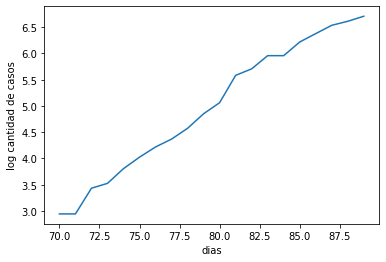

In [14]:
#seleccionamos Argentina
paises= datos2['location'] #cargo el vector de paises
confirmados= datos2['total_cases'] #carga vector todos los casos confirmados

ind_arg = np.where(paises=='Argentina')
ind_arg2 = ind_arg[0]
casos_arg = confirmados[ind_arg2]
dias = np.arange(0,len(casos_arg))

casos_principio2 = casos_arg[70:90]
dias_principio2 = dias[70:90]

plt.plot(dias_principio2,np.log(casos_principio2))
plt.xlabel('dias')
plt.ylabel('log cantidad de casos')

¡Se ve bastante lineal! Aprovechemos esto para averiguar el $k$ utilizando un ajuste hecho con el método de cuadrados mínimos, ajustando los datos al modelo 

$Confirmados=e^{k(t-t_0)}$


In [15]:
#definimos función para ajustar modelo
def exponencial(t,k,t0):
  C=np.exp(k*(t-t0))
  return C

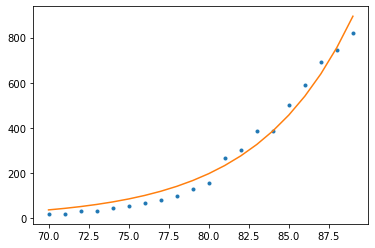

In [16]:
#ajustamos
popt, pcov = curve_fit(exponencial, dias_principio2, casos_principio2)
popt

#Veamos cómo se ajusta lo que obtuvimos a los datos reales

k=popt[0]
t0=popt[1]
casos_simu = exponencial(dias_principio2,k,t0)
plt.plot(dias_principio2,casos_principio2,'.')
plt.plot(dias_principio2,casos_simu)

Observamos que nuestros datos se ajustan bien a la función logarítmica con el k ajustado y el día 0 que sacamos al fitear la curva.

In [17]:
def casos_nuevos(casos):
  nuevos=np.zeros(len(casos))
  i=0
  while i<len(nuevos)-1:
    nuevos[i]=casos[i+1]-casos[i]
    i=i+1

  return nuevos   

Como última pista, hagamos una función que determine los casos nuevos por día a partir de estas curvas. Puede ser útil para tu análisis.

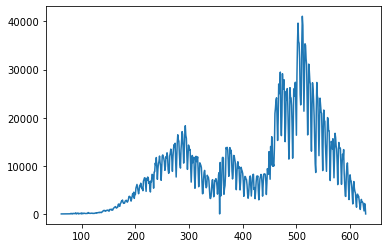

In [18]:
casos_arg3=np.array(casos_arg)
nuevos_arg3=casos_nuevos(casos_arg3)
plt.plot(nuevos_arg3)

#### <U>K INICIAL 10 PAÍSES</U> ####

Vamos a sacar el K inicial para 10 países para observar el principio de la pandemia y como se ajusta la ecuación antes vista con estos países. 

In [19]:
paises = datos2.location.unique()
print(paises)

['Afghanistan' 'Africa' 'Albania' 'Algeria' 'Andorra' 'Angola' 'Anguilla'
 'Antigua and Barbuda' 'Argentina' 'Armenia' 'Aruba' 'Asia' 'Australia'
 'Austria' 'Azerbaijan' 'Bahamas' 'Bahrain' 'Bangladesh' 'Barbados'
 'Belarus' 'Belgium' 'Belize' 'Benin' 'Bermuda' 'Bhutan' 'Bolivia'
 'Bonaire Sint Eustatius and Saba' 'Bosnia and Herzegovina' 'Botswana'
 'Brazil' 'British Virgin Islands' 'Brunei' 'Bulgaria' 'Burkina Faso'
 'Burundi' 'Cambodia' 'Cameroon' 'Canada' 'Cape Verde' 'Cayman Islands'
 'Central African Republic' 'Chad' 'Chile' 'China' 'Colombia' 'Comoros'
 'Congo' 'Cook Islands' 'Costa Rica' "Cote d'Ivoire" 'Croatia' 'Cuba'
 'Curacao' 'Cyprus' 'Czechia' 'Democratic Republic of Congo' 'Denmark'
 'Djibouti' 'Dominica' 'Dominican Republic' 'Ecuador' 'Egypt'
 'El Salvador' 'Equatorial Guinea' 'Eritrea' 'Estonia' 'Eswatini'
 'Ethiopia' 'Europe' 'European Union' 'Faeroe Islands' 'Falkland Islands'
 'Fiji' 'Finland' 'France' 'French Polynesia' 'Gabon' 'Gambia' 'Georgia'
 'Germany' 'Ghana'

Observamos todos los países.

In [20]:
paises =['Austria', 'Belgium', 'Croatia', 'France', 'Germany', 'Italy', 'Poland', 'Portugal', 'Spain', 'United Kingdom']

Hacemos un array con todos los países seleccionados. Seleccionamos países de Europa para tener varios países juntos y que sean del Norte donde empezó la pandemia.

In [21]:
def filtro(pais):
    datos3 = datos2[datos2.location == pais]
    datos4 = datos3.dropna(subset = ['total_cases'])
    datos5 = datos4.sort_values(by = 'date')
    return datos5

Hacemos una función de filtro para poder usarla después. La función de filtro hace lo mismo que hicimos para Argentina antes. Selecciona los datos por páis, elimina los nulos del 'total_cases' y los ordena por fecha.

In [22]:
Austria = filtro('Austria')
Austria

,iso_code,continent,location,date,total_cases,new_cases,new_cases_smoothed,total_deaths,new_deaths,new_deaths_smoothed,...,cardiovasc_death_rate,diabetes_prevalence,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,human_development_index,excess_mortality_cumulative,excess_mortality
6808,AUT,Europe,Austria,2020-02-25,2.0,2.0,NaN,NaN,NaN,NaN,...,145.183,6.35,28.4,30.9,NaN,7.37,81.54,0.922,NaN,NaN
6809,AUT,Europe,Austria,2020-02-26,2.0,0.0,NaN,NaN,NaN,NaN,...,145.183,6.35,28.4,30.9,NaN,7.37,81.54,0.922,NaN,NaN
6810,AUT,Europe,Austria,2020-02-27,3.0,1.0,NaN,NaN,NaN,NaN,...,145.183,6.35,28.4,30.9,NaN,7.37,81.54,0.922,NaN,NaN
6811,AUT,Europe,Austria,2020-02-28,3.0,0.0,NaN,NaN,NaN,NaN,...,145.183,6.35,28.4,30.9,NaN,7.37,81.54,0.922,NaN,NaN
6812,AUT,Europe,Austria,2020-02-29,9.0,6.0,NaN,NaN,NaN,NaN,...,145.183,6.35,28.4,30.9,NaN,7.37,81.54,0.922,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7378,AUT,Europe,Austria,2021-09-17,720455.0,2364.0,2077.429,10882.0,12.0,7.143,...,145.183,6.35,28.4,30.9,NaN,7.37,81.54,0.922,NaN,NaN
7379,AUT,Europe,Austria,2021-09-18,722357.0,1902.0,2026.286,10889.0,7.0,7.429,...,145.183,6.35,28.4,30.9,NaN,7.37,81.54,0.922,NaN,NaN
7380,AUT,Europe,Austria,2021-09-19,724035.0,1678.0,2000.714,10895.0,6.0,8.000,...,145.183,6.35,28.4,30.9,NaN,7.37,81.54,0.922,NaN,NaN
7381,AUT,Europe,Austria,2021-09-20,725434.0,1399.0,1980.143,10896.0,1.0,8.000,...,145.183,6.35,28.4,30.9,NaN,7.37,81.54,0.922,NaN,NaN


Probamos la función con Austria.

(array([-5000.,     0.,  5000., 10000., 15000., 20000., 25000., 30000.,
        35000., 40000.]),
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

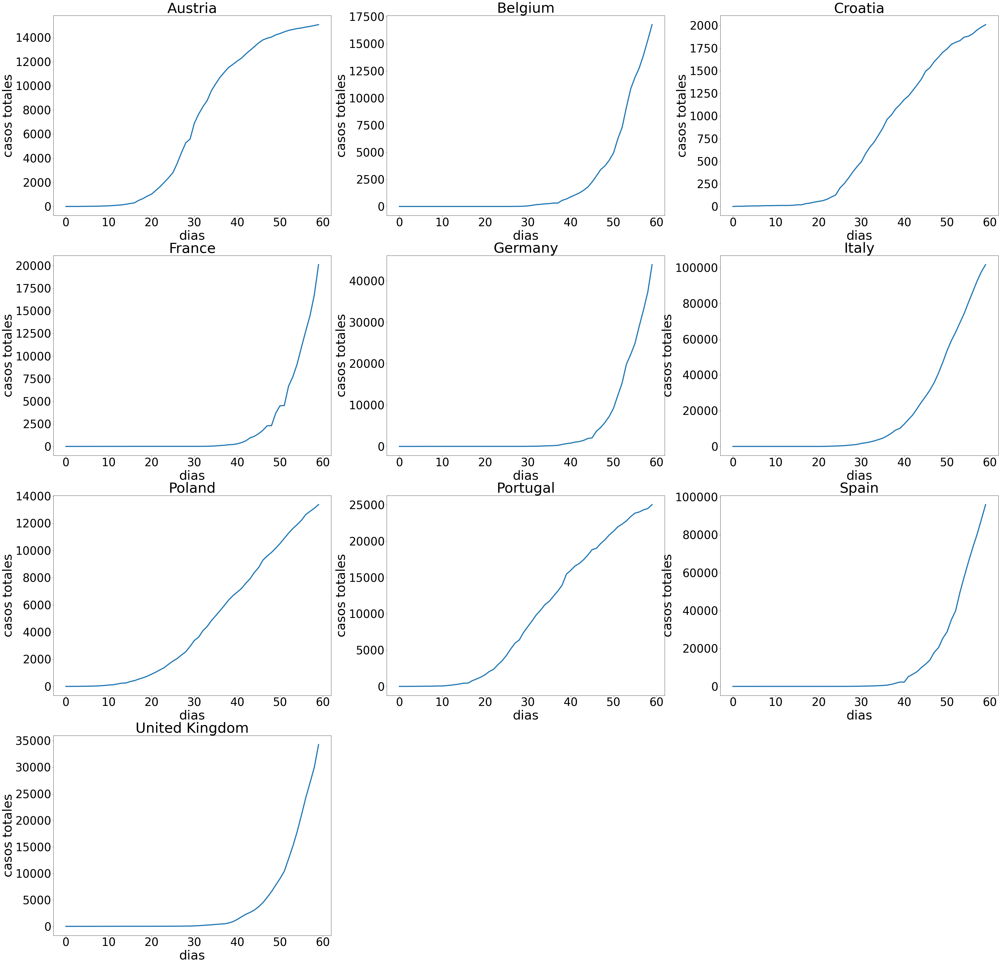

In [23]:
casospais = []
diaspais = []

for i in paises:
    pais = filtro(i)
    casos= pais['total_cases']
    dias=np.arange(0,len(casos))
    casos_principio=casos[0:60]
    dias_principio=dias[0:60]
    casospais.append(casos_principio)
    diaspais.append(dias_principio)
    
plt.figure(figsize=(60,60))

plt.subplot(4, 3, 1)
plt.title(paises[0], fontsize = 50)
plt.plot(diaspais[0],casospais[0], lw=4)
plt.xlabel('dias', fontsize = 45)
plt.ylabel('casos totales', fontsize = 45)
plt.xticks(fontsize = 40)
plt.yticks(fontsize = 40)
    
plt.subplot(4, 3, 2)
plt.title(paises[1], fontsize = 50)
plt.plot(diaspais[1],casospais[1], lw=4)
plt.xlabel('dias', fontsize = 45)
plt.ylabel('casos totales', fontsize = 45)
plt.xticks(fontsize = 40)
plt.yticks(fontsize = 40)
    
plt.subplot(4, 3, 3)
plt.title(paises[2], fontsize = 50)
plt.plot(diaspais[2],casospais[2], lw=4)
plt.xlabel('dias', fontsize = 45)
plt.ylabel('casos totales', fontsize = 45)
plt.xticks(fontsize = 40)
plt.yticks(fontsize = 40)
    
plt.subplot(4, 3, 4)
plt.title(paises[3], fontsize = 50)
plt.plot(diaspais[3],casospais[3], lw=4)
plt.xlabel('dias', fontsize = 45)
plt.ylabel('casos totales', fontsize = 45)
plt.xticks(fontsize = 40)
plt.yticks(fontsize = 40)

plt.subplot(4, 3, 5)
plt.title(paises[4], fontsize = 50)
plt.plot(diaspais[4],casospais[4], lw=4)
plt.xlabel('dias', fontsize = 45)
plt.ylabel('casos totales', fontsize = 45)
plt.xticks(fontsize = 40)
plt.yticks(fontsize = 40)
    
plt.subplot(4, 3, 6)
plt.title(paises[5], fontsize = 50)
plt.plot(diaspais[5],casospais[5], lw=4)
plt.xlabel('dias', fontsize = 45)
plt.ylabel('casos totales', fontsize = 45)
plt.xticks(fontsize = 40)
plt.yticks(fontsize = 40)
    
plt.subplot(4, 3, 7)
plt.title(paises[6], fontsize = 50)
plt.plot(diaspais[6],casospais[6], lw=4)
plt.xlabel('dias', fontsize = 45)
plt.ylabel('casos totales', fontsize = 45)
plt.xticks(fontsize = 40)
plt.yticks(fontsize = 40)
    
plt.subplot(4, 3, 8)
plt.title(paises[7], fontsize = 50)
plt.plot(diaspais[7],casospais[7], lw=4)
plt.xlabel('dias', fontsize = 45)
plt.ylabel('casos totales', fontsize = 45)
plt.xticks(fontsize = 40)
plt.yticks(fontsize = 40)
    
plt.subplot(4, 3, 9)
plt.title(paises[8], fontsize = 50)
plt.plot(diaspais[8],casospais[8], lw=4)
plt.xlabel('dias', fontsize = 45)
plt.ylabel('casos totales', fontsize = 45)
plt.xticks(fontsize = 40)
plt.yticks(fontsize = 40)
    
plt.subplot(4, 3, 10)
plt.title(paises[9], fontsize = 50)
plt.plot(diaspais[9],casospais[9], lw=4)
plt.xlabel('dias', fontsize = 45)
plt.ylabel('casos totales', fontsize = 45)
plt.xticks(fontsize = 40)
plt.yticks(fontsize = 40)

Visualizamos los gráficos para los 10 países seleccionados con los días y cantidad de casos. Los días son de acuerdo a cada país a su primer caso de covid.

In [24]:
diaspaises = {"diasi" : [10,30,15,35,35,25,10,10,35,35], "diasf" : [30,55,35,55,55,50,35,30,50,55]}

Seleccionamos los días que nos interesan para el K según cada país. En los diasi están los días de inicio y en los díasf los últimos. Esta selección la vamos a usar para sacar los k iniciales.

(array([-2500.,     0.,  2500.,  5000.,  7500., 10000., 12500., 15000.,
        17500., 20000.]),
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

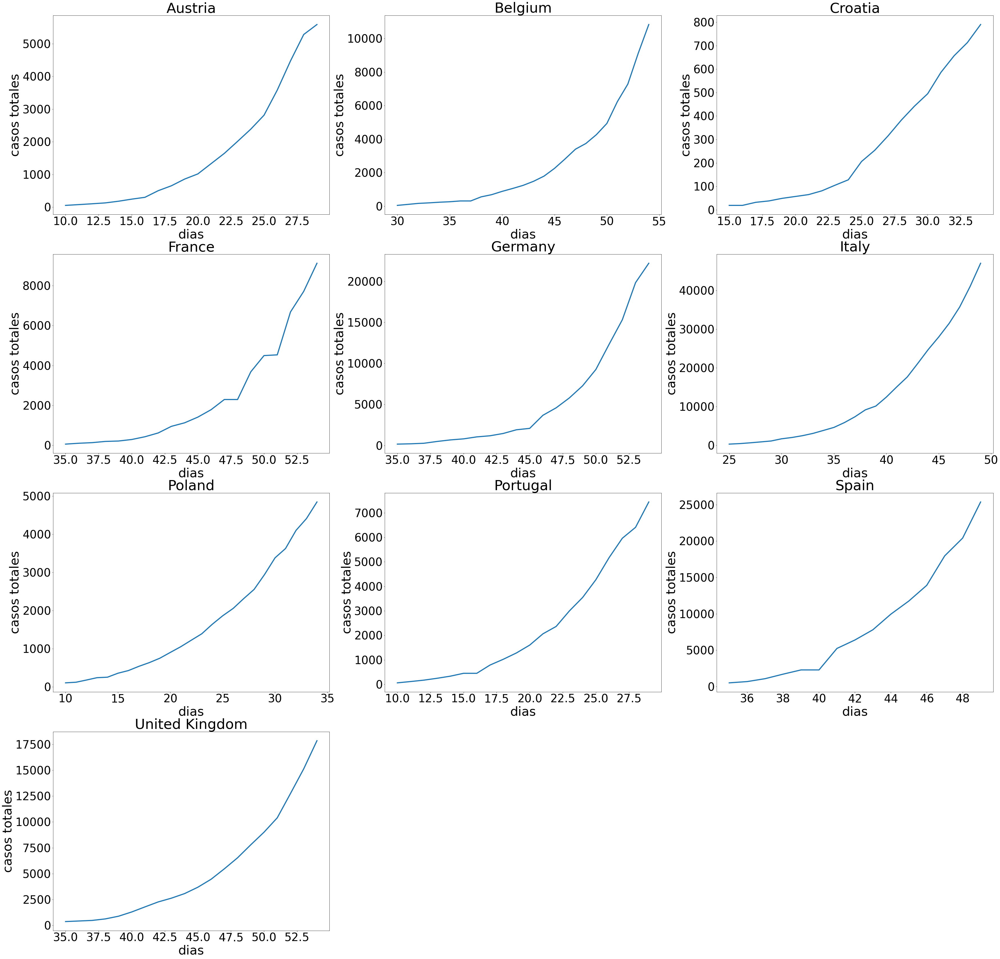

In [25]:
casospais2 = []
diaspais2 = []

for i,j,k in zip(paises,diaspaises['diasi'],diaspaises['diasf']):
    pais = filtro(i)
    casos= pais['total_cases']
    dias=np.arange(0,len(casos))
    casos_principio2=casos[j:k]
    dias_principio2=dias[j:k]
    casospais2.append(casos_principio2)
    diaspais2.append(dias_principio2)

plt.figure(figsize=(60,60))

plt.subplot(4, 3, 1)
plt.title(paises[0], fontsize = 50)
plt.plot(diaspais2[0],casospais2[0], lw=4)
plt.xlabel('dias', fontsize = 45)
plt.ylabel('casos totales', fontsize = 45)
plt.xticks(fontsize = 40)
plt.yticks(fontsize = 40)

plt.subplot(4, 3, 2)
plt.title(paises[1], fontsize = 50)
plt.plot(diaspais2[1],casospais2[1], lw=4)
plt.xlabel('dias', fontsize = 45)
plt.ylabel('casos totales', fontsize = 45)
plt.xticks(fontsize = 40)
plt.yticks(fontsize = 40)
    
plt.subplot(4, 3, 3)
plt.title(paises[2], fontsize = 50)
plt.plot(diaspais2[2],casospais2[2], lw=4)
plt.xlabel('dias', fontsize = 45)
plt.ylabel('casos totales', fontsize = 45)
plt.xticks(fontsize = 40)
plt.yticks(fontsize = 40)
    
plt.subplot(4, 3, 4)
plt.title(paises[3], fontsize = 50)
plt.plot(diaspais2[3],casospais2[3], lw=4)
plt.xlabel('dias', fontsize = 45)
plt.ylabel('casos totales', fontsize = 45)
plt.xticks(fontsize = 40)
plt.yticks(fontsize = 40)

plt.subplot(4, 3, 5)
plt.title(paises[4], fontsize = 50)
plt.plot(diaspais2[4],casospais2[4], lw=4)
plt.xlabel('dias', fontsize = 45)
plt.ylabel('casos totales', fontsize = 45)
plt.xticks(fontsize = 40)
plt.yticks(fontsize = 40)
    
plt.subplot(4, 3, 6)
plt.title(paises[5], fontsize = 50)
plt.plot(diaspais2[5],casospais2[5], lw=4)
plt.xlabel('dias', fontsize = 45)
plt.ylabel('casos totales', fontsize = 45)
plt.xticks(fontsize = 40)
plt.yticks(fontsize = 40)
    
plt.subplot(4, 3, 7)
plt.title(paises[6], fontsize = 50)
plt.plot(diaspais2[6],casospais2[6], lw=4)
plt.xlabel('dias', fontsize = 45)
plt.ylabel('casos totales', fontsize = 45)
plt.xticks(fontsize = 40)
plt.yticks(fontsize = 40)
    
plt.subplot(4, 3, 8)
plt.title(paises[7], fontsize = 50)
plt.plot(diaspais2[7],casospais2[7], lw=4)
plt.xlabel('dias', fontsize = 45)
plt.ylabel('casos totales', fontsize = 45)
plt.xticks(fontsize = 40)
plt.yticks(fontsize = 40)
    
plt.subplot(4, 3, 9)
plt.title(paises[8], fontsize = 50)
plt.plot(diaspais2[8],casospais2[8], lw=4)
plt.xlabel('dias', fontsize = 45)
plt.ylabel('casos totales', fontsize = 45)
plt.xticks(fontsize = 40)
plt.yticks(fontsize = 40)
    
plt.subplot(4, 3, 10)
plt.title(paises[9], fontsize = 50)
plt.plot(diaspais2[9],casospais2[9], lw=4)
plt.xlabel('dias', fontsize = 45)
plt.ylabel('casos totales', fontsize = 45)
plt.xticks(fontsize = 40)
plt.yticks(fontsize = 40)

Visualizamos nuestra selcción por país

In [26]:
#definimos función para ajustar modelo
def exponencial(t,k,t0):
  C=np.exp(k*(t-t0))
  return C

Definimos de nuevo nuestra función exponencial

(array([-2500.,     0.,  2500.,  5000.,  7500., 10000., 12500., 15000.,
        17500., 20000.]),
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

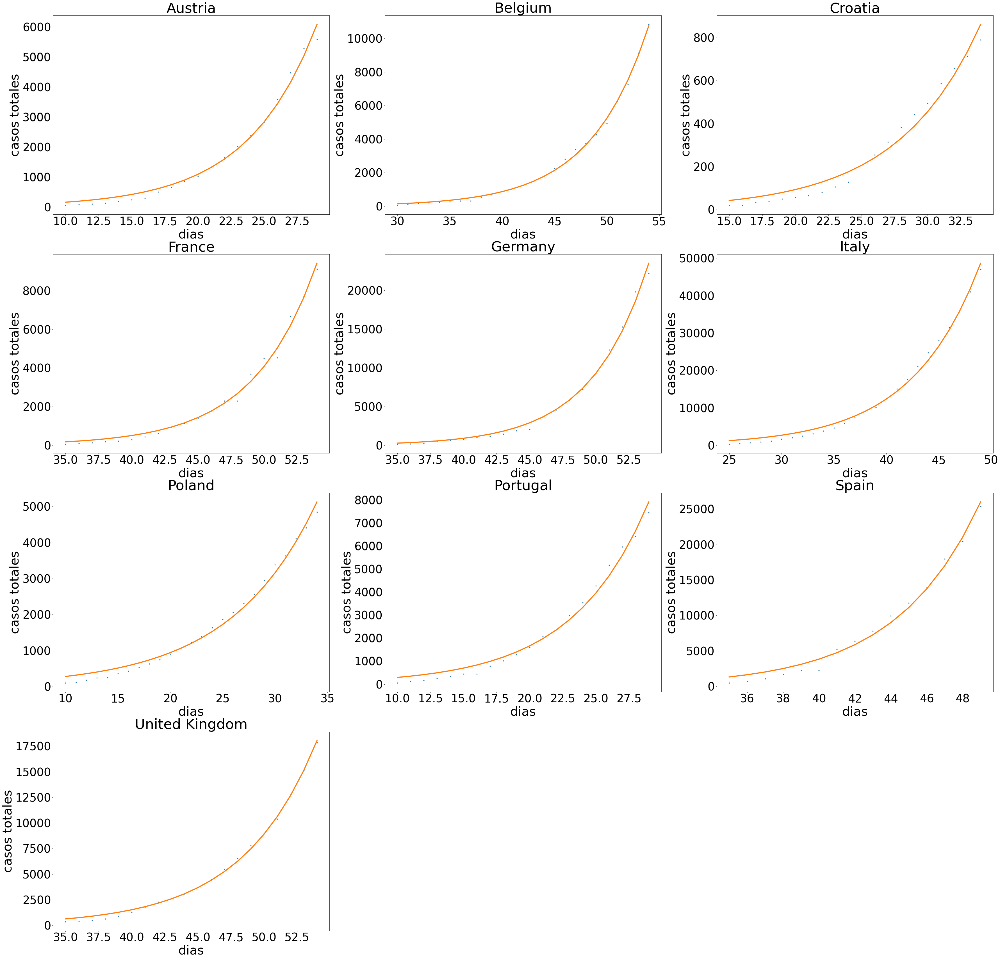

In [27]:
poptpaises = []
kpaises = []
t0paises = []
casos_simu = []
casospais2 = []
diaspais2 = []

for i,j,k in zip(paises,diaspaises['diasi'],diaspaises['diasf']):
    pais = filtro(i)
    casos= pais['total_cases']
    dias=np.arange(0,len(casos))
    casos_principio2=casos[j:k]
    dias_principio2=dias[j:k]
    casospais2.append(casos_principio2)
    diaspais2.append(dias_principio2)

for i in range(len(diaspais2)):
    popt, pcov = curve_fit(exponencial, diaspais2[i], casospais2[i])
    poptpaises.append(popt)
    kpaises.append(popt[0])
    t0paises.append(popt[1])
    casos_simu.append(exponencial(diaspais2[i],popt[0],popt[1]))

plt.figure(figsize=(60,60))

plt.subplot(4, 3, 1)
plt.title(paises[0], fontsize = 50)
plt.plot(diaspais2[0],casospais2[0],'.')
plt.plot(diaspais2[0],casos_simu[0], lw=4)
plt.xlabel('dias', fontsize = 45)
plt.ylabel('casos totales', fontsize = 45)
plt.xticks(fontsize = 40)
plt.yticks(fontsize = 40)
    
plt.subplot(4, 3, 2)
plt.title(paises[1], fontsize = 50)
plt.plot(diaspais2[1],casospais2[1],'.')
plt.plot(diaspais2[1],casos_simu[1], lw=4)
plt.xlabel('dias', fontsize = 45)
plt.ylabel('casos totales', fontsize = 45)
plt.xticks(fontsize = 40)
plt.yticks(fontsize = 40)
    
plt.subplot(4, 3, 3)
plt.title(paises[2], fontsize = 50)
plt.plot(diaspais2[2],casospais2[2],'.')
plt.plot(diaspais2[2],casos_simu[2], lw=4)
plt.xlabel('dias', fontsize = 45)
plt.ylabel('casos totales', fontsize = 45)
plt.xticks(fontsize = 40)
plt.yticks(fontsize = 40)
    
plt.subplot(4, 3, 4)
plt.title(paises[3], fontsize = 50)
plt.plot(diaspais2[3],casospais2[3],'.')
plt.plot(diaspais2[3],casos_simu[3], lw=4)
plt.xlabel('dias', fontsize = 45)
plt.ylabel('casos totales', fontsize = 45)
plt.xticks(fontsize = 40)
plt.yticks(fontsize = 40)

plt.subplot(4, 3, 5)
plt.title(paises[4], fontsize = 50)
plt.plot(diaspais2[4],casospais2[4],'.')
plt.plot(diaspais2[4],casos_simu[4], lw=4)
plt.xlabel('dias', fontsize = 45)
plt.ylabel('casos totales', fontsize = 45)
plt.xticks(fontsize = 40)
plt.yticks(fontsize = 40)
    
plt.subplot(4, 3, 6)
plt.title(paises[5], fontsize = 50)
plt.plot(diaspais2[5],casospais2[5],'.')
plt.plot(diaspais2[5],casos_simu[5], lw=4)
plt.xlabel('dias', fontsize = 45)
plt.ylabel('casos totales', fontsize = 45)
plt.xticks(fontsize = 40)
plt.yticks(fontsize = 40)
    
plt.subplot(4, 3, 7)
plt.title(paises[6], fontsize = 50)
plt.plot(diaspais2[6],casospais2[6],'.')
plt.plot(diaspais2[6],casos_simu[6], lw=4)
plt.xlabel('dias', fontsize = 45)
plt.ylabel('casos totales', fontsize = 45)
plt.xticks(fontsize = 40)
plt.yticks(fontsize = 40)
    
plt.subplot(4, 3, 8)
plt.title(paises[7], fontsize = 50)
plt.plot(diaspais2[7],casospais2[7],'.')
plt.plot(diaspais2[7],casos_simu[7], lw=4)
plt.xlabel('dias', fontsize = 45)
plt.ylabel('casos totales', fontsize = 45)
plt.xticks(fontsize = 40)
plt.yticks(fontsize = 40)
    
plt.subplot(4, 3, 9)
plt.title(paises[8], fontsize = 50)
plt.plot(diaspais2[8],casospais2[8],'.')
plt.plot(diaspais2[8],casos_simu[8], lw=4)
plt.xlabel('dias', fontsize = 45)
plt.ylabel('casos totales', fontsize = 45)
plt.xticks(fontsize = 40)
plt.yticks(fontsize = 40)
    
plt.subplot(4, 3, 10)
plt.title(paises[9], fontsize = 50)
plt.plot(diaspais2[9],casospais2[9],'.')
plt.plot(diaspais2[9],casos_simu[9], lw=4)
plt.xlabel('dias', fontsize = 45)
plt.ylabel('casos totales', fontsize = 45)
plt.xticks(fontsize = 40)
plt.yticks(fontsize = 40)

Visualizamos que las curvas de la función exponencial se ajustan muy bien a los países y periodos de tiempo elegidos.

**kpaises:**

[0.1910613361704529, 0.17967174982743747, 0.159248157608965, 0.20955476549259305, 0.23212363540574965, 0.15220983505754287, 0.12102531398066677, 0.1732217513575455, 0.21242916607849358, 0.1763107318530038]


**t0paises:**

[-16.598227979959624, 2.3296644758165153, -8.441046359215145, 10.333659980638522, 10.636398548823905, -21.90384551910542, -36.579554103793875, -22.815644242897946, 1.1474749491090028, -1.5816939514451456]


**promedio k paises:**

0.18068564428324504


**desviación standard k paises:**

0.03082250694598014


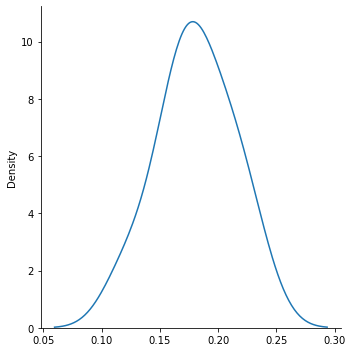

In [28]:
poptpaises = []
kpaises = []
t0paises = []
casos_simu = []
casospais2 = []
diaspais2 = []

for i,j,k in zip(paises,diaspaises['diasi'],diaspaises['diasf']):
    pais = filtro(i)
    casos= pais['total_cases']
    dias=np.arange(0,len(casos))
    casos_principio2=casos[j:k]
    dias_principio2=dias[j:k]
    casospais2.append(casos_principio2)
    diaspais2.append(dias_principio2)

for i in range(len(diaspais2)):
    #ajustamos
    popt, pcov = curve_fit(exponencial, diaspais2[i], casospais2[i])
    poptpaises.append(popt)
    kpaises.append(popt[0])
    t0paises.append(popt[1])
    casos_simu.append(exponencial(diaspais2[i],popt[0],popt[1]))

#averiguamos el promedio y la desviación estandar de la muestra de ks
mu = np.mean(kpaises)
std = np.std(kpaises)
    
printmd("**kpaises:**")
print(kpaises)
printmd("**t0paises:**")
print(t0paises)
printmd("**promedio k paises:**")
print(mu)
printmd("**desviación standard k paises:**")
print(std)

sns.displot(kpaises, kind="kde")

Vemos los k iniciales de los países y los primeros casos teóricos de los países. También visualizamos el k medio y la desviación standard de los k iniciales de los países y hacemos un Displot para visualizar su distribución.

In [29]:
mean_, sims = [], 50
for i in range(sims):
    temp_sample = np.random.choice(kpaises, replace=True, size=500)
    sample_mean = np.mean(temp_sample)
    mean_.append(sample_mean) 
    
boot_mean = np.mean(mean_)
boot_95_ci = np.percentile(mean_, [2.5, 97.5])
print("Bootstrapped Mean Length = {}, 95% CI = {}".format(boot_mean, boot_95_ci))

Bootstrapped Mean Length = 0.18079702195968006, 95% CI = [0.17823056 0.18356645]


Hacemos un Bootstrap para visualizar el k medio haciendo 500 muestras aletorias según nuestra muestra anterio. Tomamos el α=0.05 para sacar la media de k, lo que implica que toleraremos hasta un 5% de error. ***Observamos que el K va de ~0.17798506 a ~0.18250028 en la media para ese rango de confianza.***

#### <U>K INICIAL MUNDO</U> ####

Vamos a visualizar los casos iniciales del mundo para compararlos con los casos de los 10 países que vimos.

In [30]:
maxdate = filtro("Austria").date.iloc[0]

for i in paises:
    m = filtro(i).date.iloc[0]
    if m > maxdate:
        maxdate = m
print(maxdate)

2020-03-04 00:00:00


De los anteriores 10 países vemos la primera fecha por cada uno y elegimos la mayor.

In [31]:
num = maxdate + dt.timedelta(days=60)
print(num)

2020-05-03 00:00:00


A la mayor fecha que encontramos antes le sumamos 60 días para obtener la fecha máxima de los 10 países anteriores.

In [32]:
W = filtro("World")
W2 = W[(W.date <= "2020-05-03")]
W2.head()

,iso_code,continent,location,date,total_cases,new_cases,new_cases_smoothed,total_deaths,new_deaths,new_deaths_smoothed,...,cardiovasc_death_rate,diabetes_prevalence,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,human_development_index,excess_mortality_cumulative,excess_mortality
116150,OWID_WRL,NaN,World,2020-01-22,557.0,0.0,NaN,17.0,0.0,NaN,...,233.07,8.51,6.434,34.635,60.13,2.705,72.58,0.737,NaN,NaN
116151,OWID_WRL,NaN,World,2020-01-23,655.0,98.0,NaN,18.0,1.0,NaN,...,233.07,8.51,6.434,34.635,60.13,2.705,72.58,0.737,NaN,NaN
116152,OWID_WRL,NaN,World,2020-01-24,941.0,286.0,NaN,26.0,8.0,NaN,...,233.07,8.51,6.434,34.635,60.13,2.705,72.58,0.737,NaN,NaN
116153,OWID_WRL,NaN,World,2020-01-25,1433.0,492.0,NaN,42.0,16.0,NaN,...,233.07,8.51,6.434,34.635,60.13,2.705,72.58,0.737,NaN,NaN
116154,OWID_WRL,NaN,World,2020-01-26,2118.0,685.0,NaN,56.0,14.0,NaN,...,233.07,8.51,6.434,34.635,60.13,2.705,72.58,0.737,NaN,NaN


Hacemos un filtro para el mundo y seleccionamos hasta la fecha máxima encontrada antes.

Text(0, 0.5, 'cantidad de casos')

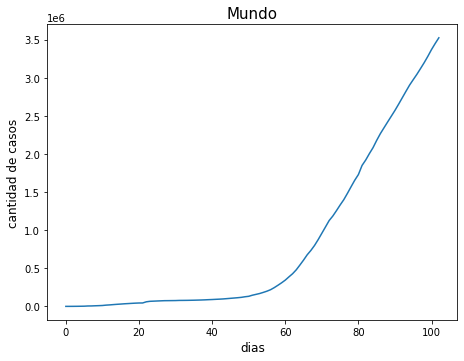

In [33]:
casosmundo= W2['total_cases']
diasmundo= np.arange(0,len(casosmundo))

plt.figure(figsize=(25,25))

plt.subplot(4, 3, 1)
plt.title("Mundo",  fontsize = 15)
plt.plot(diasmundo,casosmundo)
plt.xlabel('dias',  fontsize = 12)
plt.ylabel('cantidad de casos',  fontsize = 12)

Observamos como se visualiza la suma de los casos totales del mundo para los días seleccionados.

Text(0, 0.5, 'cantidad de casos')

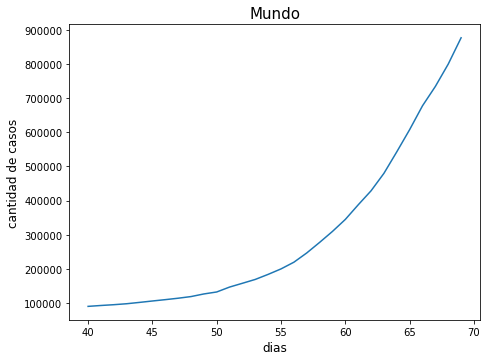

In [34]:
casosmundo2= casosmundo[40:70]
diasmundo2= diasmundo[40:70]

plt.figure(figsize=(25,25))

plt.subplot(4, 3, 1)
plt.title("Mundo",  fontsize = 15)
plt.plot(diasmundo2,casosmundo2)
plt.xlabel('dias',  fontsize = 12)
plt.ylabel('cantidad de casos',  fontsize = 12)

Hacemos una selección de 60 a 70 que es donde se visualiza mejor la subida.

In [35]:
poptmundo = []
kmundo = []
t0mundo = []

#ajustamos
popt, pcov = curve_fit(exponencial,diasmundo2, casosmundo2)
poptpaises.append(popt)
kmundo = popt[0]
t0mundo = popt[1]

printmd("**kmundo:**")
print(kmundo)
printmd("**t0mundo:**")
print(t0mundo)

**kmundo:**

0.0991556908226324


**t0mundo:**

-69.05050941998417


Sacamos el kmundo y el t0 de los datos del mundo

Vemos que el k0 del mundo 0.099 es muy diferente y nos da muy lejano al k medio de los países de 0.181

#### <U>COMPRACIÓN MUNDO-PAISES</U> ####

Al estar lejano de nuestros rangos el k0 del mundo vamos a buscar k mínimos y máximos de nuestras muestras para ver si se acerca más al k de mundo.

In [36]:
min_, sims = [], 50
for i in range(sims):
    temp_sample = np.random.choice(kpaises, replace=True, size=500)
    sample_min = np.min(temp_sample)
    min_.append(sample_min)

boot_min = np.min(min_)
boot_95_ci = np.percentile(min_, [2.5, 97.5])
print("Bootstrapped Mean Length = {}, 95% CI = {}".format(boot_min, boot_95_ci))

Bootstrapped Mean Length = 0.12102531398066677, 95% CI = [0.12102531 0.12102531]


Hacemos un método de Bootstrap para el k mínimo de nuestras muestras y obtenemos un ~0.121.

In [37]:
max_, sims = [], 50
for i in range(sims):
    temp_sample = np.random.choice(kpaises, replace=True, size=500)
    sample_max = np.max(temp_sample)
    max_.append(sample_max)
    
boot_max = np.min(max_)
boot_95_ci = np.percentile(max_, [2.5, 97.5])
print("Bootstrapped Mean Length = {}, 95% CI = {}".format(boot_max, boot_95_ci))

Bootstrapped Mean Length = 0.23212363540574965, 95% CI = [0.23212364 0.23212364]


Hacemos un método de Bootstrap y vemos que nuestro k máximo nos da ~0.2321.

In [38]:
for i in range(len(diasmundo)):
    casos_simu_2=exponencial(diasmundo2,0.121025,t0mundo)
    casos_simu_3=exponencial(diasmundo2,0.232123,t0mundo)
    casos_simu_4=exponencial(diasmundo2,0.181015,t0mundo)

Hacemos tres arrrays, uno con el k mínimo, otro con el k máximo, y otro con el kmedio, con el t0 obtenido del mundo y con los dias del mundo. Utilizamos la función dada antes para hacer nuestras curvas.

Text(0, 0.5, 'cantidad de casos')

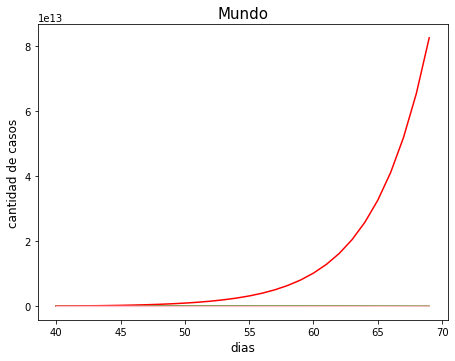

In [39]:
plt.figure(figsize=(25,25))

plt.subplot(4, 3, 1)
plt.title("Mundo",  fontsize = 15)
plt.plot(diasmundo2,casosmundo2, color = "orange")
plt.plot(diasmundo2,casos_simu_2, color = "green")
plt.plot(diasmundo2,casos_simu_3, color = "red")
plt.plot(diasmundo2,casos_simu_4, color = "pink")
plt.xlabel('dias',  fontsize = 12)
plt.ylabel('cantidad de casos',  fontsize = 12)

Graficamos y vemos que la curva máxima se va muy arriba y no permite ver la curva mínima, la curva media y la del mundo real.

Text(0, 0.5, 'cantidad de casos')

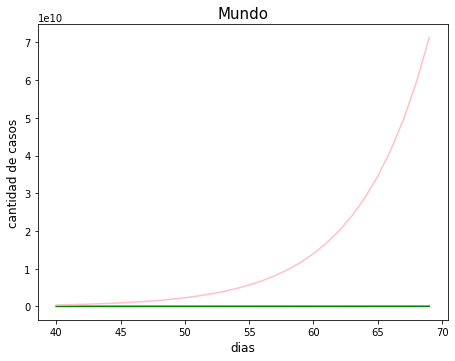

In [40]:
plt.figure(figsize=(25,25))

plt.subplot(4, 3, 1)
plt.title("Mundo",  fontsize = 15)
plt.plot(diasmundo2,casosmundo2, color = "orange")
plt.plot(diasmundo2,casos_simu_2, color = "green")
plt.plot(diasmundo2,casos_simu_4, color = "pink")
plt.xlabel('dias',  fontsize = 12)
plt.ylabel('cantidad de casos',  fontsize = 12)

Vemos que aún sin la curva máxima la curva media no permite bien la curva del mínimo y la del mundo.

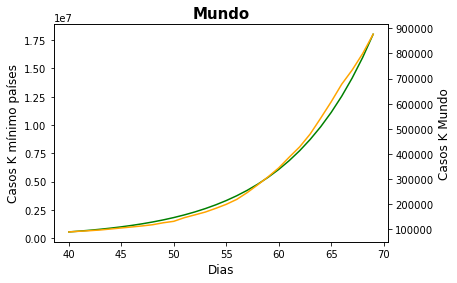

In [41]:
fig, ax1 = pl.subplots()
ax1.set_title("Mundo",fontweight="bold", size=15)
ax1.plot(diasmundo2,casos_simu_2, color = "green")
ax1.set_xlabel('Dias', fontsize = 12)
ax1.set_ylabel('Casos K mínimo países', fontsize = 12)
ax1.xaxis.set_tick_params(labelsize = 10)
ax1.yaxis.set_tick_params(labelsize = 10)

ax2=pl.twinx()
ax2.plot(diasmundo2,casosmundo2, color = "orange")
ax2.set_ylabel('Casos K Mundo', fontsize = 12)
ax2.yaxis.set_tick_params(labelsize = 10)

Graficamos y vemos que se acerca mucho la curva del mundo a nuestra curva de k mínimo sacado de nuestros países, solo que tiene diferentes valores en el eje y, lo que demuestra el sesgo sobre nuestros datos que son pocos. Probablemente si tomaramos más datos serían más parecidos los valores del eje y.

In [42]:
RMSE2 = np.sqrt(mean_squared_error(casosmundo2, casos_simu_2))
RMSE3 = np.sqrt(mean_squared_error(casosmundo2,casos_simu_3))
RMSE4 = np.sqrt(mean_squared_error(casosmundo2,casos_simu_4))
print(f'Raíz del error cuadrático medio con k mínimo: {RMSE2}')
print(f'Raíz del error cuadrático medio con k máximo: {RMSE3}')
print(f'Raíz del error cuadrático medio con k medio: {RMSE4}')

Raíz del error cuadrático medio con k mínimo: 6720359.67212192
Raíz del error cuadrático medio con k máximo: 24737688325951.855
Raíz del error cuadrático medio con k medio: 23596950357.235268


Hacemos un RMSE para ver los errores y vemos que la curva del k máximo se aleja mucho, la media menos y la del k mínimo ya se acerca más.

#### <U>CONCLUSIONES</U> ####

In [43]:
conlu = {"k":["K mínimo", "K medio", "K máximo", "K mundo"], 
           "Valores":["~0.121", "~0.181", "~0.232", "~0.099"],
           "RMSE": ["~6720359", "~23596950357", "~24737688325951",""]}
pd.DataFrame(conlu)

,k,Valores,RMSE
0,K mínimo,~0.121,~6720359
1,K medio,~0.181,~23596950357
2,K máximo,~0.232,~24737688325951
3,K mundo,~0.099,


Observamos los valores y vemos que la que más se acerca al k del mundo es el k mínimo. El modelo, por lo tanto, que más se acerca sería el k mínimo. Los otros k nos da más lejano. Los k que tenemos son sesgados porque tenemos países donde empezó la cuarentena con pocas políticas. Otros países, en ese momento, es posible que tengan muchos menos casos y por lo tanto un menor k de subida al mismo momento que los países elegidos estaban teniendo un k muy grande. Por ello, nuestro k da muy diferente y más cercano al mínimo que al máximo.

### EVALUANDO ESTRATEGIAS ###

#### 1. EXPLORACION DE MEDIDAS ####

La columna que vamos a utilizar como criterio de política es la de stringency.index que es un conjunto de medidas varias como por ejemplo clausura de fronteras, clausura de colegios, restricción de circulación. Este criterio se compone de estas medidas y va de 0 a 100% de acuerdo al grado de restricción. Vamos a elegir un cierto porcentaje de restricción en un cierto tiempo.

In [44]:
Europa2 = datos2[datos2.continent == 'Europe']
print(Europa2.location.unique())
print("Cantidad de países:", len(Europa2.location.unique()))

['Albania' 'Andorra' 'Austria' 'Belarus' 'Belgium'
 'Bosnia and Herzegovina' 'Bulgaria' 'Croatia' 'Cyprus' 'Czechia'
 'Denmark' 'Estonia' 'Faeroe Islands' 'Finland' 'France' 'Germany'
 'Gibraltar' 'Greece' 'Guernsey' 'Hungary' 'Iceland' 'Ireland'
 'Isle of Man' 'Italy' 'Jersey' 'Kosovo' 'Latvia' 'Liechtenstein'
 'Lithuania' 'Luxembourg' 'Malta' 'Moldova' 'Monaco' 'Montenegro'
 'Netherlands' 'North Macedonia' 'Norway' 'Poland' 'Portugal' 'Romania'
 'Russia' 'San Marino' 'Serbia' 'Slovakia' 'Slovenia' 'Spain' 'Sweden'
 'Switzerland' 'Ukraine' 'United Kingdom' 'Vatican']
Cantidad de países: 51


In [45]:
PaisesEuropa = ['Albania', 'Andorra', 'Austria', 'Belarus', 'Belgium','Bosnia and Herzegovina', 'Bulgaria', 
                'Croatia', 'Cyprus', 'Czechia', 'Denmark', 'Estonia', 'Finland', 'France', 'Germany',
                'Greece', 'Hungary', 'Iceland', 'Ireland', 'Italy', 'Kosovo',
                   'Latvia', 'Liechtenstein', 'Lithuania', 'Luxembourg', 'Malta',
                   'Moldova', 'Monaco', 'Netherlands',
                   'Norway', 'Poland', 'Portugal', 'Romania',
                   'Russia', 'San Marino', 'Serbia', 'Slovakia', 'Slovenia', 'Spain',
                   'Sweden', 'Switzerland', 'Ukraine', 'United Kingdom']
print("Cantidad de países:", len(PaisesEuropa))

Cantidad de países: 43


Para comparar nuestras medidas vamos a utilizar países de Europa porque en general se parecen en su idiosincrasia, es decir, el comportamiento de la sociedad. También vamos a tomar estos países por ser más parecidos en su economía y el tipo de empleo en general. Eliminamos algunos países que no nos interesan y nos quedamos con 43 países.

(array([10., 20., 30., 40., 50., 60., 70.]),
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

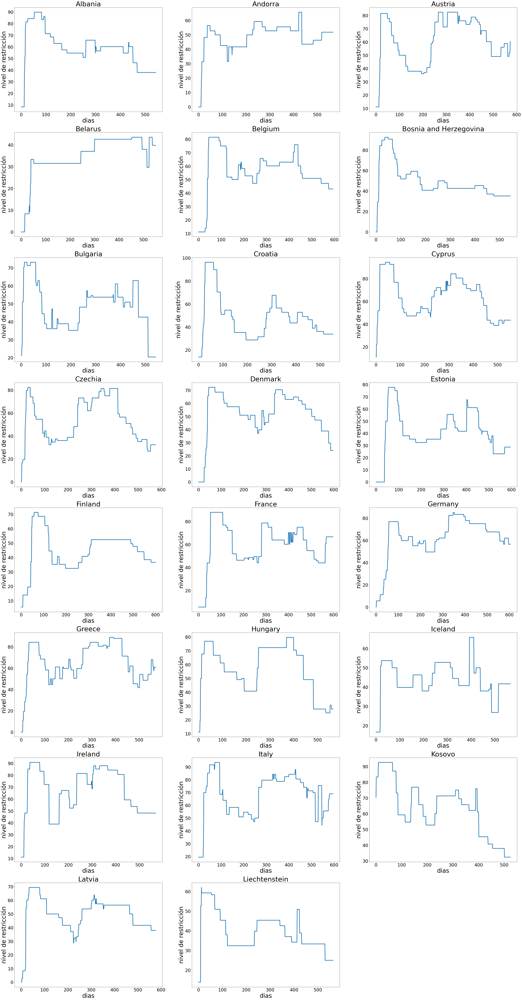

In [46]:
restriccion2 = []
diaspais3 = []

for i in range(len(PaisesEuropa)):
    paisEur = Europa2[Europa2.location == PaisesEuropa[i]]
    restriccion = paisEur['stringency_index']
    dias=np.arange(0,len(restriccion))
    restriccion2.append(restriccion)
    diaspais3.append(dias)

plt.figure(figsize=(60,120))

plt.subplot(8, 3, 1)
plt.title(PaisesEuropa[0], fontsize = 45)
plt.plot(diaspais3[0],restriccion2[0], lw=4)
plt.xlabel('dias', fontsize = 40)
plt.ylabel('nivel de restricción', fontsize = 40)
plt.xticks(fontsize = 30)
plt.yticks(fontsize = 30)

plt.subplot(8, 3, 2)
plt.title(PaisesEuropa[1], fontsize = 45)
plt.plot(diaspais3[1],restriccion2[1], lw=4)
plt.xlabel('dias', fontsize = 40)
plt.ylabel('nivel de restricción', fontsize = 40)
plt.xticks(fontsize = 30)
plt.yticks(fontsize = 30)
    
plt.subplot(8, 3, 3)
plt.title(PaisesEuropa[2], fontsize = 45)
plt.plot(diaspais3[2],restriccion2[2], lw=4)
plt.xlabel('dias', fontsize = 40)
plt.ylabel('nivel de restricción', fontsize = 40)
plt.xticks(fontsize = 30)
plt.yticks(fontsize = 30)
    
plt.subplot(8, 3, 4)
plt.title(PaisesEuropa[3], fontsize = 45)
plt.plot(diaspais3[3],restriccion2[3], lw=4)
plt.xlabel('dias', fontsize = 40)
plt.ylabel('nivel de restricción', fontsize = 40)
plt.xticks(fontsize = 30)
plt.yticks(fontsize = 30)

plt.subplot(8, 3, 5)
plt.title(PaisesEuropa[4], fontsize = 45)
plt.plot(diaspais3[4],restriccion2[4], lw=4)
plt.xlabel('dias', fontsize = 40)
plt.ylabel('nivel de restricción', fontsize = 40)
plt.xticks(fontsize = 30)
plt.yticks(fontsize = 30)
    
plt.subplot(8, 3, 6)
plt.title(PaisesEuropa[5], fontsize = 45)
plt.plot(diaspais3[5],restriccion2[5], lw=4)
plt.xlabel('dias', fontsize = 40)
plt.ylabel('nivel de restricción', fontsize = 40)
plt.xticks(fontsize = 30)
plt.yticks(fontsize = 30)
    
plt.subplot(8, 3, 7)
plt.title(PaisesEuropa[6], fontsize = 45)
plt.plot(diaspais3[6],restriccion2[6], lw=4)
plt.xlabel('dias', fontsize = 40)
plt.ylabel('nivel de restricción', fontsize = 40)
plt.xticks(fontsize = 30)
plt.yticks(fontsize = 30)
    
plt.subplot(8, 3, 8)
plt.title(PaisesEuropa[7], fontsize = 45)
plt.plot(diaspais3[7],restriccion2[7], lw=4)
plt.xlabel('dias', fontsize = 40)
plt.ylabel('nivel de restricción', fontsize = 40)
plt.xticks(fontsize = 30)
plt.yticks(fontsize = 30)
    
plt.subplot(8, 3, 9)
plt.title(PaisesEuropa[8], fontsize = 45)
plt.plot(diaspais3[8],restriccion2[8], lw=4)
plt.xlabel('dias', fontsize = 40)
plt.ylabel('nivel de restricción', fontsize = 40)
plt.xticks(fontsize = 30)
plt.yticks(fontsize = 30)
    
plt.subplot(8, 3, 10)
plt.title(PaisesEuropa[9], fontsize = 45)
plt.plot(diaspais3[9],restriccion2[9], lw=4)
plt.xlabel('dias', fontsize = 40)
plt.ylabel('nivel de restricción', fontsize = 40)
plt.xticks(fontsize = 30)
plt.yticks(fontsize = 30)

plt.subplot(8, 3, 11)
plt.title(PaisesEuropa[10], fontsize = 45)
plt.plot(diaspais3[10],restriccion2[10], lw=4)
plt.xlabel('dias', fontsize = 40)
plt.ylabel('nivel de restricción', fontsize = 40)
plt.xticks(fontsize = 30)
plt.yticks(fontsize = 30)

plt.subplot(8, 3, 12)
plt.title(PaisesEuropa[11], fontsize = 45)
plt.plot(diaspais3[11],restriccion2[11], lw=4)
plt.xlabel('dias', fontsize = 40)
plt.ylabel('nivel de restricción', fontsize = 40)
plt.xticks(fontsize = 30)
plt.yticks(fontsize = 30)

plt.subplot(8, 3, 13)
plt.title(PaisesEuropa[12], fontsize = 45)
plt.plot(diaspais3[12],restriccion2[12], lw=4)
plt.xlabel('dias', fontsize = 40)
plt.ylabel('nivel de restricción', fontsize = 40)
plt.xticks(fontsize = 30)
plt.yticks(fontsize = 30)

plt.subplot(8, 3, 14)
plt.title(PaisesEuropa[13], fontsize = 45)
plt.plot(diaspais3[13],restriccion2[13], lw=4)
plt.xlabel('dias', fontsize = 40)
plt.ylabel('nivel de restricción', fontsize = 40)
plt.xticks(fontsize = 30)
plt.yticks(fontsize = 30)

plt.subplot(8, 3, 15)
plt.title(PaisesEuropa[14], fontsize = 45)
plt.plot(diaspais3[14],restriccion2[14], lw=4)
plt.xlabel('dias', fontsize = 40)
plt.ylabel('nivel de restricción', fontsize = 40)
plt.xticks(fontsize = 30)
plt.yticks(fontsize = 30)

plt.subplot(8, 3, 16)
plt.title(PaisesEuropa[15], fontsize = 45)
plt.plot(diaspais3[15],restriccion2[15], lw=4)
plt.xlabel('dias', fontsize = 40)
plt.ylabel('nivel de restricción', fontsize = 40)
plt.xticks(fontsize = 30)
plt.yticks(fontsize = 30)

plt.subplot(8, 3, 17)
plt.title(PaisesEuropa[16], fontsize = 45)
plt.plot(diaspais3[16],restriccion2[16], lw=4)
plt.xlabel('dias', fontsize = 40)
plt.ylabel('nivel de restricción', fontsize = 40)
plt.xticks(fontsize = 30)
plt.yticks(fontsize = 30)

plt.subplot(8, 3, 18)
plt.title(PaisesEuropa[17], fontsize = 45)
plt.plot(diaspais3[17],restriccion2[17], lw=4)
plt.xlabel('dias', fontsize = 40)
plt.ylabel('nivel de restricción', fontsize = 40)
plt.xticks(fontsize = 30)
plt.yticks(fontsize = 30)

plt.subplot(8, 3, 19)
plt.title(PaisesEuropa[18], fontsize = 45)
plt.plot(diaspais3[18],restriccion2[18], lw=4)
plt.xlabel('dias', fontsize = 40)
plt.ylabel('nivel de restricción', fontsize = 40)
plt.xticks(fontsize = 30)
plt.yticks(fontsize = 30)

plt.subplot(8, 3, 20)
plt.title(PaisesEuropa[19], fontsize = 45)
plt.plot(diaspais3[19],restriccion2[19], lw=4)
plt.xlabel('dias', fontsize = 40)
plt.ylabel('nivel de restricción', fontsize = 40)
plt.xticks(fontsize = 30)
plt.yticks(fontsize = 30)

plt.subplot(8, 3, 21)
plt.title(PaisesEuropa[20], fontsize = 45)
plt.plot(diaspais3[20],restriccion2[20], lw=4)
plt.xlabel('dias', fontsize = 40)
plt.ylabel('nivel de restricción', fontsize = 40)
plt.xticks(fontsize = 30)
plt.yticks(fontsize = 30)

plt.subplot(8, 3, 22)
plt.title(PaisesEuropa[21], fontsize = 45)
plt.plot(diaspais3[21],restriccion2[21], lw=4)
plt.xlabel('dias', fontsize = 40)
plt.ylabel('nivel de restricción', fontsize = 40)
plt.xticks(fontsize = 30)
plt.yticks(fontsize = 30)

plt.subplot(8, 3, 23)
plt.title(PaisesEuropa[22], fontsize = 45)
plt.plot(diaspais3[22],restriccion2[22], lw=4)
plt.xlabel('dias', fontsize = 40)
plt.ylabel('nivel de restricción', fontsize = 40)
plt.xticks(fontsize = 30)
plt.yticks(fontsize = 30)

Miramos los primeros 23 países de Europa con su nivel de restricción durante todo el dataset. Observamos su variación y sus niveles máximos.

(array([-10.,   0.,  10.,  20.,  30.,  40.,  50.]),
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

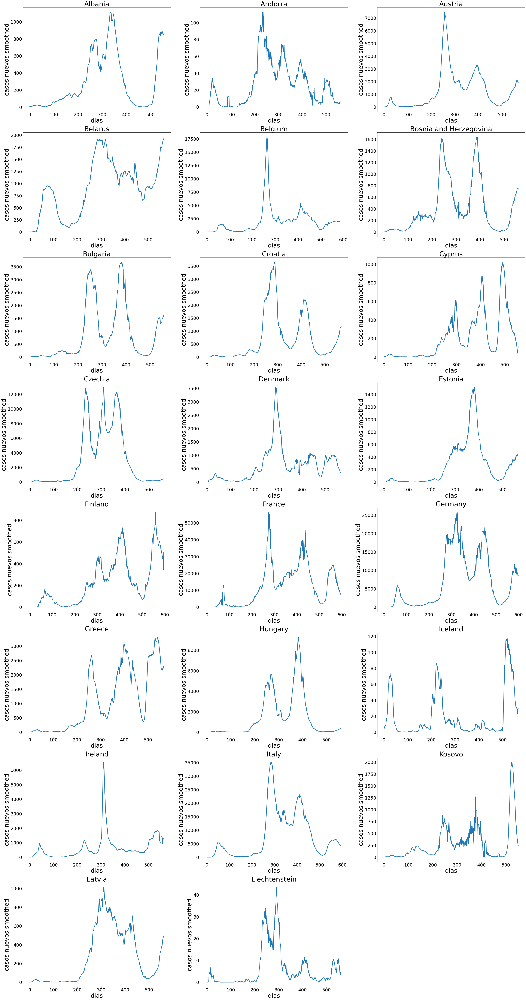

In [47]:
casosnuevos2 = []
diaspais4 = []

for i in range(len(PaisesEuropa)):
    paises = Europa2[(Europa2.location == PaisesEuropa[i]) & (Europa2.new_cases_smoothed >= 0)]
    casosnuevos = paises.new_cases_smoothed
    dias=np.arange(0,len(casosnuevos))
    casosnuevos2.append(casosnuevos)
    diaspais4.append(dias)

plt.figure(figsize=(60,120))

plt.subplot(8, 3, 1)
plt.title(PaisesEuropa[0], fontsize = 45)
plt.plot(diaspais4[0],casosnuevos2[0], lw=4)
plt.xlabel('dias', fontsize = 40)
plt.ylabel('casos nuevos smoothed', fontsize = 40)
plt.xticks(fontsize = 30)
plt.yticks(fontsize = 30)

plt.subplot(8, 3, 2)
plt.title(PaisesEuropa[1], fontsize = 45)
plt.plot(diaspais4[1],casosnuevos2[1], lw=4)
plt.xlabel('dias', fontsize = 40)
plt.ylabel('casos nuevos smoothed', fontsize = 40)
plt.xticks(fontsize = 30)
plt.yticks(fontsize = 30)
    
plt.subplot(8, 3, 3)
plt.title(PaisesEuropa[2], fontsize = 45)
plt.plot(diaspais4[2],casosnuevos2[2], lw=4)
plt.xlabel('dias', fontsize = 40)
plt.ylabel('casos nuevos smoothed', fontsize = 40)
plt.xticks(fontsize = 30)
plt.yticks(fontsize = 30)
    
plt.subplot(8, 3, 4)
plt.title(PaisesEuropa[3], fontsize = 45)
plt.plot(diaspais4[3],casosnuevos2[3], lw=4)
plt.xlabel('dias', fontsize = 40)
plt.ylabel('casos nuevos smoothed', fontsize = 40)
plt.xticks(fontsize = 30)
plt.yticks(fontsize = 30)

plt.subplot(8, 3, 5)
plt.title(PaisesEuropa[4], fontsize = 45)
plt.plot(diaspais4[4],casosnuevos2[4], lw=4)
plt.xlabel('dias', fontsize = 40)
plt.ylabel('casos nuevos smoothed', fontsize = 40)
plt.xticks(fontsize = 30)
plt.yticks(fontsize = 30)
    
plt.subplot(8, 3, 6)
plt.title(PaisesEuropa[5], fontsize = 45)
plt.plot(diaspais4[5],casosnuevos2[5], lw=4)
plt.xlabel('dias', fontsize = 40)
plt.ylabel('casos nuevos smoothed', fontsize = 40)
plt.xticks(fontsize = 30)
plt.yticks(fontsize = 30)
    
plt.subplot(8, 3, 7)
plt.title(PaisesEuropa[6], fontsize = 45)
plt.plot(diaspais4[6],casosnuevos2[6], lw=4)
plt.xlabel('dias', fontsize = 40)
plt.ylabel('casos nuevos smoothed', fontsize = 40)
plt.xticks(fontsize = 30)
plt.yticks(fontsize = 30)
    
plt.subplot(8, 3, 8)
plt.title(PaisesEuropa[7], fontsize = 45)
plt.plot(diaspais4[7],casosnuevos2[7], lw=4)
plt.xlabel('dias', fontsize = 40)
plt.ylabel('casos nuevos smoothed', fontsize = 40)
plt.xticks(fontsize = 30)
plt.yticks(fontsize = 30)
    
plt.subplot(8, 3, 9)
plt.title(PaisesEuropa[8], fontsize = 45)
plt.plot(diaspais4[8],casosnuevos2[8], lw=4)
plt.xlabel('dias', fontsize = 40)
plt.ylabel('casos nuevos smoothed', fontsize = 40)
plt.xticks(fontsize = 30)
plt.yticks(fontsize = 30)
    
plt.subplot(8, 3, 10)
plt.title(PaisesEuropa[9], fontsize = 45)
plt.plot(diaspais4[9],casosnuevos2[9], lw=4)
plt.xlabel('dias', fontsize = 40)
plt.ylabel('casos nuevos smoothed', fontsize = 40)
plt.xticks(fontsize = 30)
plt.yticks(fontsize = 30)

plt.subplot(8, 3, 11)
plt.title(PaisesEuropa[10], fontsize = 45)
plt.plot(diaspais4[10],casosnuevos2[10], lw=4)
plt.xlabel('dias', fontsize = 40)
plt.ylabel('casos nuevos smoothed', fontsize = 40)
plt.xticks(fontsize = 30)
plt.yticks(fontsize = 30)

plt.subplot(8, 3, 12)
plt.title(PaisesEuropa[11], fontsize = 45)
plt.plot(diaspais4[11],casosnuevos2[11], lw=4)
plt.xlabel('dias', fontsize = 40)
plt.ylabel('casos nuevos smoothed', fontsize = 40)
plt.xticks(fontsize = 30)
plt.yticks(fontsize = 30)

plt.subplot(8, 3, 13)
plt.title(PaisesEuropa[12], fontsize = 45)
plt.plot(diaspais4[12],casosnuevos2[12], lw=4)
plt.xlabel('dias', fontsize = 40)
plt.ylabel('casos nuevos smoothed', fontsize = 40)
plt.xticks(fontsize = 30)
plt.yticks(fontsize = 30)

plt.subplot(8, 3, 14)
plt.title(PaisesEuropa[13], fontsize = 45)
plt.plot(diaspais4[13],casosnuevos2[13], lw=4)
plt.xlabel('dias', fontsize = 40)
plt.ylabel('casos nuevos smoothed', fontsize = 40)
plt.xticks(fontsize = 30)
plt.yticks(fontsize = 30)

plt.subplot(8, 3, 15)
plt.title(PaisesEuropa[14], fontsize = 45)
plt.plot(diaspais4[14],casosnuevos2[14], lw=4)
plt.xlabel('dias', fontsize = 40)
plt.ylabel('casos nuevos smoothed', fontsize = 40)
plt.xticks(fontsize = 30)
plt.yticks(fontsize = 30)

plt.subplot(8, 3, 16)
plt.title(PaisesEuropa[15], fontsize = 45)
plt.plot(diaspais4[15],casosnuevos2[15], lw=4)
plt.xlabel('dias', fontsize = 40)
plt.ylabel('casos nuevos smoothed', fontsize = 40)
plt.xticks(fontsize = 30)
plt.yticks(fontsize = 30)

plt.subplot(8, 3, 17)
plt.title(PaisesEuropa[16], fontsize = 45)
plt.plot(diaspais4[16],casosnuevos2[16], lw=4)
plt.xlabel('dias', fontsize = 40)
plt.ylabel('casos nuevos smoothed', fontsize = 40)
plt.xticks(fontsize = 30)
plt.yticks(fontsize = 30)

plt.subplot(8, 3, 18)
plt.title(PaisesEuropa[17], fontsize = 45)
plt.plot(diaspais4[17],casosnuevos2[17], lw=4)
plt.xlabel('dias', fontsize = 40)
plt.ylabel('casos nuevos smoothed', fontsize = 40)
plt.xticks(fontsize = 30)
plt.yticks(fontsize = 30)

plt.subplot(8, 3, 19)
plt.title(PaisesEuropa[18], fontsize = 45)
plt.plot(diaspais4[18],casosnuevos2[18], lw=4)
plt.xlabel('dias', fontsize = 40)
plt.ylabel('casos nuevos smoothed', fontsize = 40)
plt.xticks(fontsize = 30)
plt.yticks(fontsize = 30)

plt.subplot(8, 3, 20)
plt.title(PaisesEuropa[19], fontsize = 45)
plt.plot(diaspais4[19],casosnuevos2[19], lw=4)
plt.xlabel('dias', fontsize = 40)
plt.ylabel('casos nuevos smoothed', fontsize = 40)
plt.xticks(fontsize = 30)
plt.yticks(fontsize = 30)

plt.subplot(8, 3, 21)
plt.title(PaisesEuropa[20], fontsize = 45)
plt.plot(diaspais4[20],casosnuevos2[20], lw=4)
plt.xlabel('dias', fontsize = 40)
plt.ylabel('casos nuevos smoothed', fontsize = 40)
plt.xticks(fontsize = 30)
plt.yticks(fontsize = 30)

plt.subplot(8, 3, 22)
plt.title(PaisesEuropa[21], fontsize = 45)
plt.plot(diaspais4[21],casosnuevos2[21], lw=4)
plt.xlabel('dias', fontsize = 40)
plt.ylabel('casos nuevos smoothed', fontsize = 40)
plt.xticks(fontsize = 30)
plt.yticks(fontsize = 30)

plt.subplot(8, 3, 23)
plt.title(PaisesEuropa[22], fontsize = 45)
plt.plot(diaspais4[22],casosnuevos2[22], lw=4)
plt.xlabel('dias', fontsize = 40)
plt.ylabel('casos nuevos smoothed', fontsize = 40)
plt.xticks(fontsize = 30)
plt.yticks(fontsize = 30)

Observamos los casos_nuevos smoothed cada siete días. Estos datos toman por día la suma de los siete días anteriores. Nos parece que es la mejor forma de medir los casos nuevos para poder enfocarnos en un rango un poco más amplio sobre los casos máximos.

(array([  0.,  10.,  20.,  30.,  40.,  50.,  60.,  70.,  80.,  90., 100.]),
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

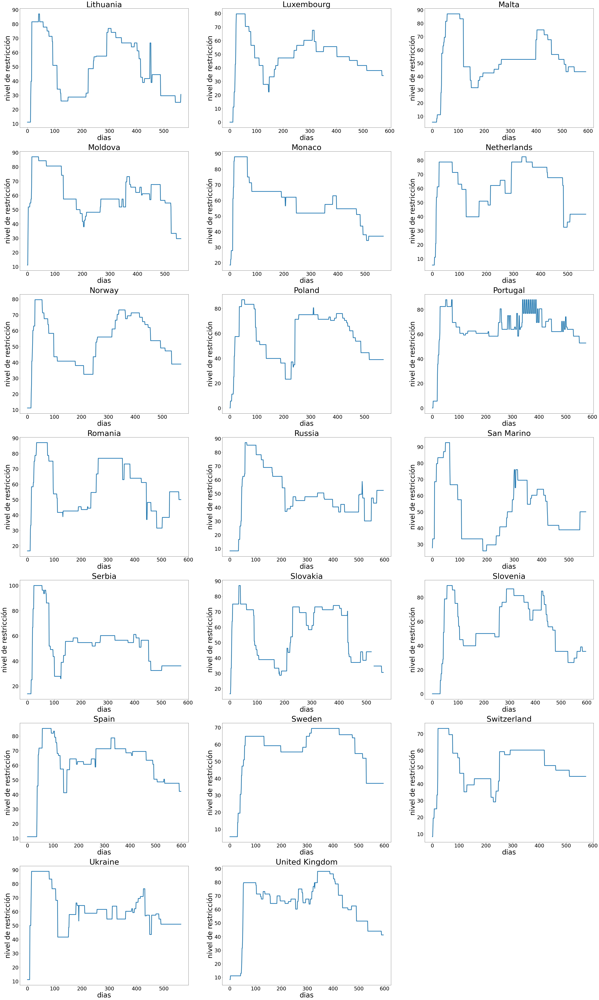

In [48]:
restriccion3 = []
diaspais5 = []

for i in range(len(PaisesEuropa)):
    paisEur = Europa2[Europa2.location == PaisesEuropa[i]]
    restriccion = paisEur['stringency_index']
    dias= np.arange(0,len(restriccion))
    restriccion3.append(restriccion)
    diaspais5.append(dias)

plt.figure(figsize=(60,120))

plt.subplot(8, 3, 1)
plt.title(PaisesEuropa[23], fontsize = 45)
plt.plot(diaspais5[23],restriccion3[23], lw=4)
plt.xlabel('dias', fontsize = 40)
plt.ylabel('nivel de restricción', fontsize = 40)
plt.xticks(fontsize = 30)
plt.yticks(fontsize = 30)

plt.subplot(8, 3, 2)
plt.title(PaisesEuropa[24], fontsize = 45)
plt.plot(diaspais5[24],restriccion3[24], lw=4)
plt.xlabel('dias', fontsize = 40)
plt.ylabel('nivel de restricción', fontsize = 40)
plt.xticks(fontsize = 30)
plt.yticks(fontsize = 30)
    
plt.subplot(8, 3, 3)
plt.title(PaisesEuropa[25], fontsize = 45)
plt.plot(diaspais5[25],restriccion3[25], lw=4)
plt.xlabel('dias', fontsize = 40)
plt.ylabel('nivel de restricción', fontsize = 40)
plt.xticks(fontsize = 30)
plt.yticks(fontsize = 30)
    
plt.subplot(8, 3, 4)
plt.title(PaisesEuropa[26], fontsize = 45)
plt.plot(diaspais5[26],restriccion3[26], lw=4)
plt.xlabel('dias', fontsize = 40)
plt.ylabel('nivel de restricción', fontsize = 40)
plt.xticks(fontsize = 30)
plt.yticks(fontsize = 30)

plt.subplot(8, 3, 5)
plt.title(PaisesEuropa[27], fontsize = 45)
plt.plot(diaspais5[27],restriccion3[27], lw=4)
plt.xlabel('dias', fontsize = 40)
plt.ylabel('nivel de restricción', fontsize = 40)
plt.xticks(fontsize = 30)
plt.yticks(fontsize = 30)
    
plt.subplot(8, 3, 6)
plt.title(PaisesEuropa[28], fontsize = 45)
plt.plot(diaspais5[28],restriccion3[28], lw=4)
plt.xlabel('dias', fontsize = 40)
plt.ylabel('nivel de restricción', fontsize = 40)
plt.xticks(fontsize = 30)
plt.yticks(fontsize = 30)
    
plt.subplot(8, 3, 7)
plt.title(PaisesEuropa[29], fontsize = 45)
plt.plot(diaspais5[29],restriccion3[29], lw=4)
plt.xlabel('dias', fontsize = 40)
plt.ylabel('nivel de restricción', fontsize = 40)
plt.xticks(fontsize = 30)
plt.yticks(fontsize = 30)
    
plt.subplot(8, 3, 8)
plt.title(PaisesEuropa[30], fontsize = 45)
plt.plot(diaspais5[30],restriccion3[30], lw=4)
plt.xlabel('dias', fontsize = 40)
plt.ylabel('nivel de restricción', fontsize = 40)
plt.xticks(fontsize = 30)
plt.yticks(fontsize = 30)
    
plt.subplot(8, 3, 9)
plt.title(PaisesEuropa[31], fontsize = 45)
plt.plot(diaspais5[31],restriccion3[31], lw=4)
plt.xlabel('dias', fontsize = 40)
plt.ylabel('nivel de restricción', fontsize = 40)
plt.xticks(fontsize = 30)
plt.yticks(fontsize = 30)
    
plt.subplot(8, 3, 10)
plt.title(PaisesEuropa[32], fontsize = 45)
plt.plot(diaspais5[32],restriccion3[32], lw=4)
plt.xlabel('dias', fontsize = 40)
plt.ylabel('nivel de restricción', fontsize = 40)
plt.xticks(fontsize = 30)
plt.yticks(fontsize = 30)

plt.subplot(8, 3, 11)
plt.title(PaisesEuropa[33], fontsize = 45)
plt.plot(diaspais5[33],restriccion3[33], lw=4)
plt.xlabel('dias', fontsize = 40)
plt.ylabel('nivel de restricción', fontsize = 40)
plt.xticks(fontsize = 30)
plt.yticks(fontsize = 30)

plt.subplot(8, 3, 12)
plt.title(PaisesEuropa[34], fontsize = 45)
plt.plot(diaspais5[34],restriccion3[34], lw=4)
plt.xlabel('dias', fontsize = 40)
plt.ylabel('nivel de restricción', fontsize = 40)
plt.xticks(fontsize = 30)
plt.yticks(fontsize = 30)

plt.subplot(8, 3, 13)
plt.title(PaisesEuropa[35], fontsize = 45)
plt.plot(diaspais5[35],restriccion3[35], lw=4)
plt.xlabel('dias', fontsize = 40)
plt.ylabel('nivel de restricción', fontsize = 40)
plt.xticks(fontsize = 30)
plt.yticks(fontsize = 30)

plt.subplot(8, 3, 14)
plt.title(PaisesEuropa[36], fontsize = 45)
plt.plot(diaspais5[36],restriccion3[36], lw=4)
plt.xlabel('dias', fontsize = 40)
plt.ylabel('nivel de restricción', fontsize = 40)
plt.xticks(fontsize = 30)
plt.yticks(fontsize = 30)

plt.subplot(8, 3, 15)
plt.title(PaisesEuropa[37], fontsize = 45)
plt.plot(diaspais5[37],restriccion3[37], lw=4)
plt.xlabel('dias', fontsize = 40)
plt.ylabel('nivel de restricción', fontsize = 40)
plt.xticks(fontsize = 30)
plt.yticks(fontsize = 30)

plt.subplot(8, 3, 16)
plt.title(PaisesEuropa[38], fontsize = 45)
plt.plot(diaspais5[38],restriccion3[38], lw=4)
plt.xlabel('dias', fontsize = 40)
plt.ylabel('nivel de restricción', fontsize = 40)
plt.xticks(fontsize = 30)
plt.yticks(fontsize = 30)

plt.subplot(8, 3, 17)
plt.title(PaisesEuropa[39], fontsize = 45)
plt.plot(diaspais5[39],restriccion3[39], lw=4)
plt.xlabel('dias', fontsize = 40)
plt.ylabel('nivel de restricción', fontsize = 40)
plt.xticks(fontsize = 30)
plt.yticks(fontsize = 30)

plt.subplot(8, 3, 18)
plt.title(PaisesEuropa[40], fontsize = 45)
plt.plot(diaspais5[40],restriccion3[40], lw=4)
plt.xlabel('dias', fontsize = 40)
plt.ylabel('nivel de restricción', fontsize = 40)
plt.xticks(fontsize = 30)
plt.yticks(fontsize = 30)

plt.subplot(8, 3, 19)
plt.title(PaisesEuropa[41], fontsize = 45)
plt.plot(diaspais5[41],restriccion3[41], lw=4)
plt.xlabel('dias', fontsize = 40)
plt.ylabel('nivel de restricción', fontsize = 40)
plt.xticks(fontsize = 30)
plt.yticks(fontsize = 30)

plt.subplot(8, 3, 20)
plt.title(PaisesEuropa[42], fontsize = 45)
plt.plot(diaspais5[42],restriccion3[42], lw=4)
plt.xlabel('dias', fontsize = 40)
plt.ylabel('nivel de restricción', fontsize = 40)
plt.xticks(fontsize = 30)
plt.yticks(fontsize = 30)

Hacemos los mismo con los segundos 20 países de revisar los nieveles de restricción en el tiempo.

(array([-10000.,      0.,  10000.,  20000.,  30000.,  40000.,  50000.,
         60000.,  70000.]),
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

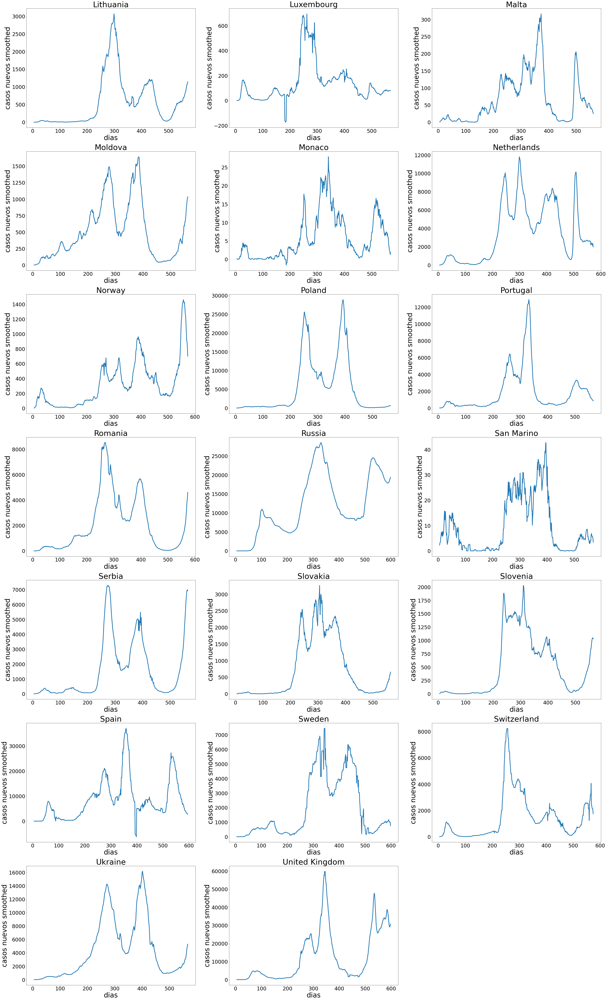

In [49]:
casosnuevos3 = []
diaspais6 = []

for i in range(len(PaisesEuropa)):
    paises = Europa2[(Europa2.location == PaisesEuropa[i]) & (Europa2.new_cases >= 0)]
    casosnuevos = paises.new_cases_smoothed
    dias=np.arange(0,len(casosnuevos))
    casosnuevos3.append(casosnuevos)
    diaspais6.append(dias)

plt.figure(figsize=(60,120))

plt.subplot(8, 3, 1)
plt.title(PaisesEuropa[23], fontsize = 45)
plt.plot(diaspais6[23],casosnuevos3[23], lw=4)
plt.xlabel('dias', fontsize = 40)
plt.ylabel('casos nuevos smoothed', fontsize = 40)
plt.xticks(fontsize = 30)
plt.yticks(fontsize = 30)

plt.subplot(8, 3, 2)
plt.title(PaisesEuropa[24], fontsize = 45)
plt.plot(diaspais6[24],casosnuevos3[24], lw=4)
plt.xlabel('dias', fontsize = 40)
plt.ylabel('casos nuevos smoothed', fontsize = 40)
plt.xticks(fontsize = 30)
plt.yticks(fontsize = 30)
    
plt.subplot(8, 3, 3)
plt.title(PaisesEuropa[25], fontsize = 45)
plt.plot(diaspais6[25],casosnuevos3[25], lw=4)
plt.xlabel('dias', fontsize = 40)
plt.ylabel('casos nuevos smoothed', fontsize = 40)
plt.xticks(fontsize = 30)
plt.yticks(fontsize = 30)
    
plt.subplot(8, 3, 4)
plt.title(PaisesEuropa[26], fontsize = 45)
plt.plot(diaspais6[26],casosnuevos3[26], lw=4)
plt.xlabel('dias', fontsize = 40)
plt.ylabel('casos nuevos smoothed', fontsize = 40)
plt.xticks(fontsize = 30)
plt.yticks(fontsize = 30)

plt.subplot(8, 3, 5)
plt.title(PaisesEuropa[27], fontsize = 45)
plt.plot(diaspais6[27],casosnuevos3[27], lw=4)
plt.xlabel('dias', fontsize = 40)
plt.ylabel('casos nuevos smoothed', fontsize = 40)
plt.xticks(fontsize = 30)
plt.yticks(fontsize = 30)
    
plt.subplot(8, 3, 6)
plt.title(PaisesEuropa[28], fontsize = 45)
plt.plot(diaspais6[28],casosnuevos3[28], lw=4)
plt.xlabel('dias', fontsize = 40)
plt.ylabel('casos nuevos smoothed', fontsize = 40)
plt.xticks(fontsize = 30)
plt.yticks(fontsize = 30)
    
plt.subplot(8, 3, 7)
plt.title(PaisesEuropa[29], fontsize = 45)
plt.plot(diaspais6[29],casosnuevos3[29], lw=4)
plt.xlabel('dias', fontsize = 40)
plt.ylabel('casos nuevos smoothed', fontsize = 40)
plt.xticks(fontsize = 30)
plt.yticks(fontsize = 30)
    
plt.subplot(8, 3, 8)
plt.title(PaisesEuropa[30], fontsize = 45)
plt.plot(diaspais6[30],casosnuevos3[30], lw=4)
plt.xlabel('dias', fontsize = 40)
plt.ylabel('casos nuevos smoothed', fontsize = 40)
plt.xticks(fontsize = 30)
plt.yticks(fontsize = 30)
    
plt.subplot(8, 3, 9)
plt.title(PaisesEuropa[31], fontsize = 45)
plt.plot(diaspais6[31],casosnuevos3[31], lw=4)
plt.xlabel('dias', fontsize = 40)
plt.ylabel('casos nuevos smoothed', fontsize = 40)
plt.xticks(fontsize = 30)
plt.yticks(fontsize = 30)
    
plt.subplot(8, 3, 10)
plt.title(PaisesEuropa[32], fontsize = 45)
plt.plot(diaspais6[32],casosnuevos3[32], lw=4)
plt.xlabel('dias', fontsize = 40)
plt.ylabel('casos nuevos smoothed', fontsize = 40)
plt.xticks(fontsize = 30)
plt.yticks(fontsize = 30)

plt.subplot(8, 3, 11)
plt.title(PaisesEuropa[33], fontsize = 45)
plt.plot(diaspais6[33],casosnuevos3[33], lw=4)
plt.xlabel('dias', fontsize = 40)
plt.ylabel('casos nuevos smoothed', fontsize = 40)
plt.xticks(fontsize = 30)
plt.yticks(fontsize = 30)

plt.subplot(8, 3, 12)
plt.title(PaisesEuropa[34], fontsize = 45)
plt.plot(diaspais6[34],casosnuevos3[34], lw=4)
plt.xlabel('dias', fontsize = 40)
plt.ylabel('casos nuevos smoothed', fontsize = 40)
plt.xticks(fontsize = 30)
plt.yticks(fontsize = 30)

plt.subplot(8, 3, 13)
plt.title(PaisesEuropa[35], fontsize = 45)
plt.plot(diaspais6[35],casosnuevos3[35], lw=4)
plt.xlabel('dias', fontsize = 40)
plt.ylabel('casos nuevos smoothed', fontsize = 40)
plt.xticks(fontsize = 30)
plt.yticks(fontsize = 30)

plt.subplot(8, 3, 14)
plt.title(PaisesEuropa[36], fontsize = 45)
plt.plot(diaspais6[36],casosnuevos3[36], lw=4)
plt.xlabel('dias', fontsize = 40)
plt.ylabel('casos nuevos smoothed', fontsize = 40)
plt.xticks(fontsize = 30)
plt.yticks(fontsize = 30)

plt.subplot(8, 3, 15)
plt.title(PaisesEuropa[37], fontsize = 45)
plt.plot(diaspais6[37],casosnuevos3[37], lw=4)
plt.xlabel('dias', fontsize = 40)
plt.ylabel('casos nuevos smoothed', fontsize = 40)
plt.xticks(fontsize = 30)
plt.yticks(fontsize = 30)

plt.subplot(8, 3, 16)
plt.title(PaisesEuropa[38], fontsize = 45)
plt.plot(diaspais6[38],casosnuevos3[38], lw=4)
plt.xlabel('dias', fontsize = 40)
plt.ylabel('casos nuevos smoothed', fontsize = 40)
plt.xticks(fontsize = 30)
plt.yticks(fontsize = 30)

plt.subplot(8, 3, 17)
plt.title(PaisesEuropa[39], fontsize = 45)
plt.plot(diaspais6[39],casosnuevos3[39], lw=4)
plt.xlabel('dias', fontsize = 40)
plt.ylabel('casos nuevos smoothed', fontsize = 40)
plt.xticks(fontsize = 30)
plt.yticks(fontsize = 30)

plt.subplot(8, 3, 18)
plt.title(PaisesEuropa[40], fontsize = 45)
plt.plot(diaspais6[40],casosnuevos3[40], lw=4)
plt.xlabel('dias', fontsize = 40)
plt.ylabel('casos nuevos smoothed', fontsize = 40)
plt.xticks(fontsize = 30)
plt.yticks(fontsize = 30)

plt.subplot(8, 3, 19)
plt.title(PaisesEuropa[41], fontsize = 45)
plt.plot(diaspais6[41],casosnuevos3[41], lw=4)
plt.xlabel('dias', fontsize = 40)
plt.ylabel('casos nuevos smoothed', fontsize = 40)
plt.xticks(fontsize = 30)
plt.yticks(fontsize = 30)

plt.subplot(8, 3, 20)
plt.title(PaisesEuropa[42], fontsize = 45)
plt.plot(diaspais6[42],casosnuevos3[42], lw=4)
plt.xlabel('dias', fontsize = 40)
plt.ylabel('casos nuevos smoothed', fontsize = 40)
plt.xticks(fontsize = 30)
plt.yticks(fontsize = 30)

Miramos los casos nuevos smoothed para los segundos 20 países.

In [50]:
PaisesSin = ["Croatia", "Denmark", "Sweden", "Serbia", "Switzerland"]   
PaisesCon = ["United Kingdom", "Germany", "Portugal", "Italy", "Netherlands"]

Elegimos en PaisesCon países que tuvieron niveles de restricción altos y en PaisesSin países que tuvieron menores niveles de restrcicción y vamos a observar más de cerca estos países. Tratamos de elegir también estos países por su impotancia en Europa.

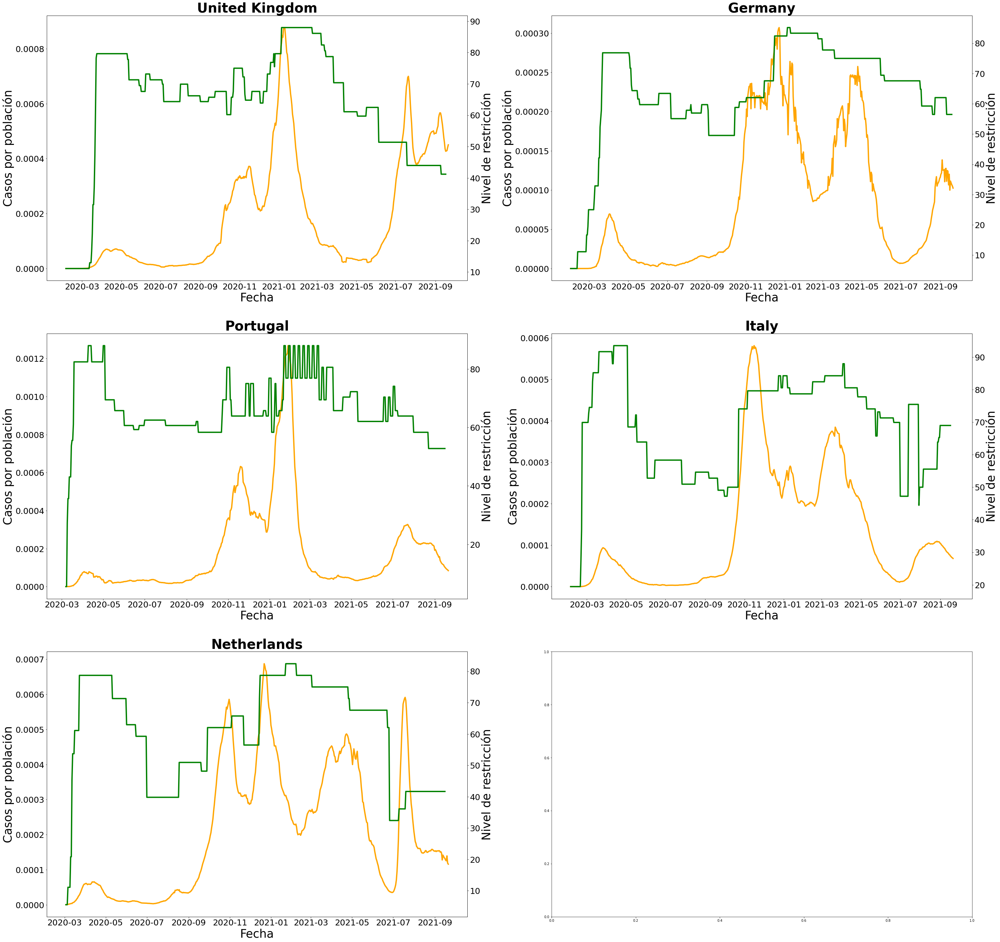

In [51]:
casosnuevosCon = []
diaspaisCon = []
restriccionCon = []

for i in range(len(PaisesCon)):
    paises = datos2[(datos2.location == PaisesCon[i]) & (datos2.new_cases_smoothed >= 0)]
    casosnuevos = paises.new_cases_smoothed/paises.population
    dias= paises.date
    restriccion = paises['stringency_index']
    casosnuevosCon.append(casosnuevos)
    restriccionCon.append(restriccion)
    diaspaisCon.append(dias)

fig = pl.figure(figsize = (50,50))
gs = fig.add_gridspec(3, 2)
((ax1, ax2), (ax3, ax4), (ax5, ax6)) = gs.subplots()

ax1.plot(diaspaisCon[0],casosnuevosCon[0], color = "orange", lw=4)
ax1.set_title(PaisesCon[0],fontweight="bold", size=40)
ax1.set_xlabel('Fecha', fontsize = 35)
ax1.set_ylabel('Casos por población', fontsize = 35)
ax1.xaxis.set_tick_params(labelsize = 25)
ax1.yaxis.set_tick_params(labelsize = 25)

ax1_1=ax1.twinx()
ax1_1.plot(diaspaisCon[0],restriccionCon[0], color = "green", lw=4)
ax1_1.yaxis.set_tick_params(labelsize = 25)
ax1_1.set_ylabel('Nivel de restricción', fontsize = 35)
ax1_1.xaxis.set_tick_params(labelsize = 25)

ax2.plot(diaspaisCon[1],casosnuevosCon[1], color = "orange", lw=4)
ax2.set_title(PaisesCon[1],fontweight="bold", size=40)
ax2.set_xlabel('Fecha', fontsize = 35)
ax2.set_ylabel('Casos por población', fontsize = 35)
ax2.yaxis.set_tick_params(labelsize = 25)
ax2.xaxis.set_tick_params(labelsize = 25)

ax1_2 = ax2.twinx()
ax1_2.plot(diaspaisCon[1],restriccionCon[1], color = "green", lw=4)
ax1_2.set_xlabel('Fecha', fontsize = 35)
ax1_2.set_ylabel('Nivel de restricción', fontsize = 35)
ax1_2.xaxis.set_tick_params(labelsize = 25)
ax1_2.yaxis.set_tick_params(labelsize = 25)

ax3.plot(diaspaisCon[2],casosnuevosCon[2], color = "orange", lw=4)
ax3.set_title(PaisesCon[2],fontweight="bold", size=40)
ax3.set_xlabel('Fecha', fontsize = 35)
ax3.set_ylabel('Casos por población', fontsize = 35)
ax3.xaxis.set_tick_params(labelsize = 25)
ax3.yaxis.set_tick_params(labelsize = 25)

ax1_3 = ax3.twinx()
ax1_3.plot(diaspaisCon[2],restriccionCon[2], color = "green", lw=4)
ax1_3.set_xlabel('Fecha', fontsize = 35)
ax1_3.set_ylabel('Nivel de restricción', fontsize = 35)
ax1_3.xaxis.set_tick_params(labelsize = 25)
ax1_3.yaxis.set_tick_params(labelsize = 25)

ax4.plot(diaspaisCon[3],casosnuevosCon[3], color = "orange", lw=4)
ax4.set_title(PaisesCon[3],fontweight="bold", size=40)
ax4.set_xlabel('Fecha', fontsize = 35)
ax4.set_ylabel('Casos por población', fontsize = 35)
ax4.xaxis.set_tick_params(labelsize = 25)
ax4.yaxis.set_tick_params(labelsize = 25)

ax1_4 = ax4.twinx()
ax1_4.plot(diaspaisCon[3],restriccionCon[3], color = "green", lw=4)
ax1_4.set_xlabel('Fecha', fontsize = 35)
ax1_4.set_ylabel('Nivel de restricción', fontsize = 35)
ax1_4.xaxis.set_tick_params(labelsize = 25)
ax1_4.yaxis.set_tick_params(labelsize = 25)

ax5.plot(diaspaisCon[4],casosnuevosCon[4], color = "orange", lw=4)
ax5.set_title(PaisesCon[4],fontweight="bold", size=40)
ax5.set_xlabel('Fecha', fontsize = 35)
ax5.set_ylabel('Casos por población', fontsize = 35)
ax5.xaxis.set_tick_params(labelsize = 25)
ax5.yaxis.set_tick_params(labelsize = 25)

ax1_5 = ax5.twinx()
ax1_5.plot(diaspaisCon[4],restriccionCon[4], color = "green", lw=4)
ax1_5.set_xlabel('Fecha', fontsize = 35)
ax1_5.set_ylabel('Nivel de restricción', fontsize = 35)
ax1_5.xaxis.set_tick_params(labelsize = 25)
ax1_5.yaxis.set_tick_params(labelsize = 25)

pl.show()

Miramos más de cerca los países con sus casos nuevos smoothed y los dividimos por la población para poder homogeneizar un poco los casos por los países. También observamos los niveles de restricción.

In [52]:
dateMinCon = ['2020-11-01', '2020-10-01', '2020-11-01', '2020-09-01', '2020-11-01']
dateMaxCon = ['2021-03-01', '2021-02-01', '2021-03-01', '2021-01-01', '2021-03-01']

Tomamos fechas para mirar más precisamente los picos de los países. Vamos a tomar fecha mínima y fecha máxima para cada uno. 

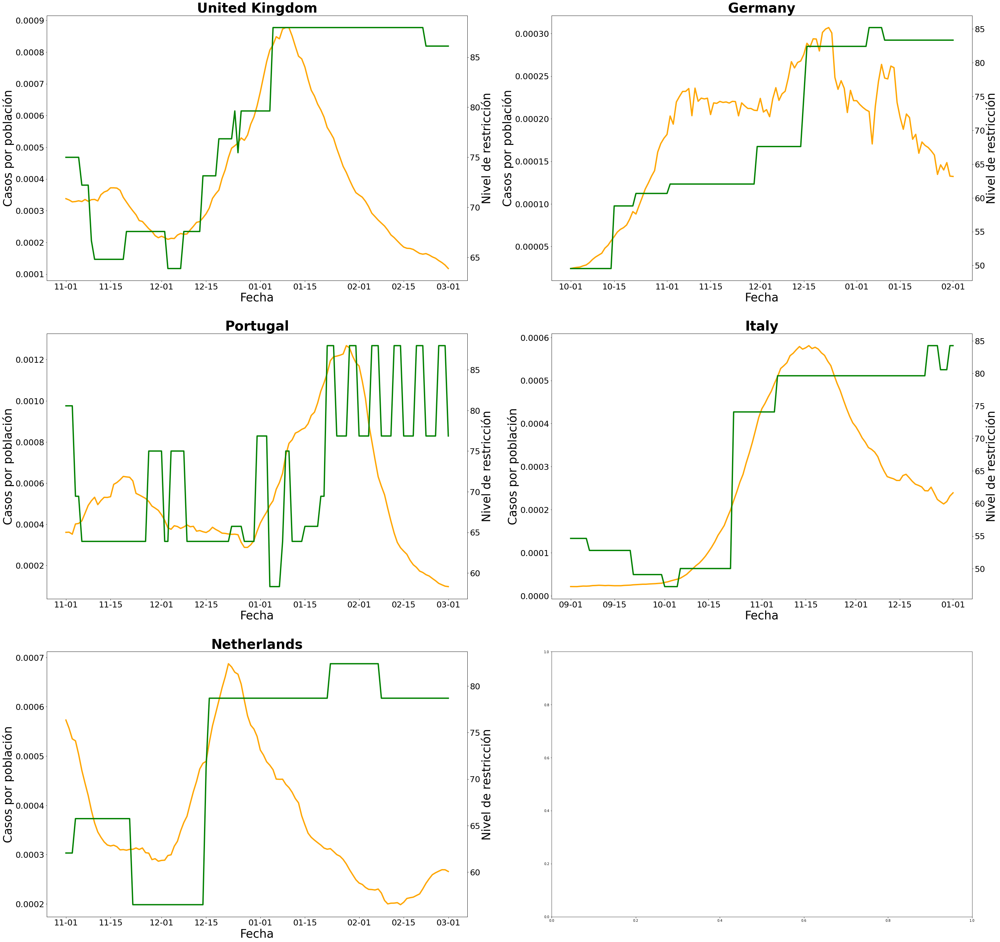

In [53]:
casosnuevosCon_2 = []
diaspaisCon_2 = []
restriccionCon_2 = []

for i in range(len(PaisesCon)):
    paises = datos2[(datos2.location == PaisesCon[i]) & (datos2.new_cases_smoothed >= 0) & (datos2.date >= dateMinCon[i]) & (datos2.date <= dateMaxCon[i])]
    casosnuevos = paises.new_cases_smoothed/paises.population
    dias= paises.date
    restriccion = paises['stringency_index']
    restriccionCon_2.append(restriccion)
    casosnuevosCon_2.append(casosnuevos)
    diaspaisCon_2.append(dias)

fig = pl.figure(figsize = (50,50))
gs = fig.add_gridspec(3, 2)
((ax1, ax2), (ax3, ax4), (ax5, ax6)) = gs.subplots()

date_form = DateFormatter("%m-%d")

ax1.plot(diaspaisCon_2[0],casosnuevosCon_2[0], color = "orange", lw=4)
ax1.set_title(PaisesCon[0],fontweight="bold", size=40)
ax1.set_xlabel('Fecha', fontsize = 35)
ax1.set_ylabel('Casos por población', fontsize = 35)
ax1.xaxis.set_tick_params(labelsize = 25)
ax1.yaxis.set_tick_params(labelsize = 25)
ax1.xaxis.set_major_formatter(date_form)

ax1_1=ax1.twinx()
ax1_1.plot(diaspaisCon_2[0],restriccionCon_2[0], color = "green", lw=4)
ax1_1.set_xlabel('Fecha', fontsize = 35)
ax1_1.set_ylabel('Nivel de restricción', fontsize = 35)
ax1_1.xaxis.set_tick_params(labelsize = 25)
ax1_1.yaxis.set_tick_params(labelsize = 25)
ax1_1.xaxis.set_major_formatter(date_form)

ax2.plot(diaspaisCon_2[1],casosnuevosCon_2[1], color = "orange", lw=4)
ax2.set_title(PaisesCon[1],fontweight="bold", size=40)
ax2.set_xlabel('Fecha', fontsize = 35)
ax2.set_ylabel('Casos por población', fontsize = 35)
ax2.xaxis.set_tick_params(labelsize = 25)
ax2.yaxis.set_tick_params(labelsize = 25)
ax2.xaxis.set_major_formatter(date_form)

ax1_2 = ax2.twinx()
ax1_2.plot(diaspaisCon_2[1],restriccionCon_2[1], color = "green", lw=4)
ax1_2.set_xlabel('Fecha', fontsize = 35)
ax1_2.set_ylabel('Nivel de restricción', fontsize = 35)
ax1_2.xaxis.set_tick_params(labelsize = 25)
ax1_2.yaxis.set_tick_params(labelsize = 25)
ax1_2.xaxis.set_major_formatter(date_form)

ax3.plot(diaspaisCon_2[2],casosnuevosCon_2[2], color = "orange", lw=4)
ax3.set_title(PaisesCon[2],fontweight="bold", size=40)
ax3.set_xlabel('Fecha', fontsize = 35)
ax3.set_ylabel('Casos por población', fontsize = 35)
ax3.xaxis.set_tick_params(labelsize = 25)
ax3.yaxis.set_tick_params(labelsize = 25)
ax3.xaxis.set_major_formatter(date_form)

ax1_3 = ax3.twinx()
ax1_3.plot(diaspaisCon_2[2],restriccionCon_2[2], color = "green", lw=4)
ax1_3.set_xlabel('Fecha', fontsize = 35)
ax1_3.set_ylabel('Nivel de restricción', fontsize = 35)
ax1_3.xaxis.set_tick_params(labelsize = 25)
ax1_3.yaxis.set_tick_params(labelsize = 25)
ax1_3.xaxis.set_major_formatter(date_form)

ax4.plot(diaspaisCon_2[3],casosnuevosCon_2[3], color = "orange", lw=4)
ax4.set_title(PaisesCon[3],fontweight="bold", size=40)
ax4.set_xlabel('Fecha', fontsize = 35)
ax4.set_ylabel('Casos por población', fontsize = 35)
ax4.xaxis.set_tick_params(labelsize = 25)
ax4.yaxis.set_tick_params(labelsize = 25)
ax4.xaxis.set_major_formatter(date_form)

ax1_4 = ax4.twinx()
ax1_4.plot(diaspaisCon_2[3],restriccionCon_2[3], color = "green", lw=4)
ax1_4.set_xlabel('Fecha', fontsize = 35)
ax1_4.set_ylabel('Nivel de restricción', fontsize = 35)
ax1_4.xaxis.set_tick_params(labelsize = 25)
ax1_4.yaxis.set_tick_params(labelsize = 25)
ax1_4.xaxis.set_major_formatter(date_form)

ax5.plot(diaspaisCon_2[4],casosnuevosCon_2[4], color = "orange", lw=4)
ax5.set_title(PaisesCon[4],fontweight="bold", size=40)
ax5.set_xlabel('Fecha', fontsize = 35)
ax5.set_ylabel('Casos por población', fontsize = 35)
ax5.xaxis.set_tick_params(labelsize = 25)
ax5.yaxis.set_tick_params(labelsize = 25)
ax5.xaxis.set_major_formatter(date_form)

ax1_5 = ax5.twinx()
ax1_5.plot(diaspaisCon_2[4],restriccionCon_2[4], color = "green", lw=4)
ax1_5.set_xlabel('Fecha', fontsize = 35)
ax1_5.set_ylabel('Nivel de restricción', fontsize = 35)
ax1_5.xaxis.set_tick_params(labelsize = 25)
ax1_5.yaxis.set_tick_params(labelsize = 25)
ax1_5.xaxis.set_major_formatter(date_form)

pl.show()

Observamos los picos con el nivel de restricción de los países con más nivel de restricción. Vamos a tomar el pico más alto de casos para poder evaluar un tiempo determinado para evaluar el impacto del nivel de restricción. Vamos a buscar esa fecha uno por uno.

In [54]:
UK = datos2[(datos2.location == PaisesCon[0]) & (datos2.new_cases_smoothed >= 0) & (datos2.date >= "2021-01-01") & (datos2.date <= "2021-01-20")]
UK[['date','new_cases_smoothed', 'stringency_index']]

,date,new_cases_smoothed,stringency_index
111934,2021-01-01,45963.143,79.63
111935,2021-01-02,49258.143,79.63
111936,2021-01-03,52495.857,79.63
111937,2021-01-04,54990.571,79.63
111938,2021-01-05,56106.571,87.96
111939,2021-01-06,57866.143,87.96
111940,2021-01-07,57403.000,87.96
111941,2021-01-08,59507.857,87.96
111942,2021-01-09,59828.571,87.96
111943,2021-01-10,59809.857,87.96


Vamos a tomar el "2021-01-09" para UK por ser la fecha del pico de casos.

In [55]:
GER = datos2[(datos2.location == PaisesCon[1]) & (datos2.new_cases_smoothed >= 0) & (datos2.date >= "2020-12-01") & (datos2.date <= "2021-01-15")]
GER[['date','new_cases_smoothed', 'stringency_index']]

,date,new_cases_smoothed,stringency_index
41120,2020-12-01,18783.714,67.59
41121,2020-12-02,17439.143,67.59
41122,2020-12-03,17673.429,67.59
41123,2020-12-04,16980.714,67.59
41124,2020-12-05,18735.143,67.59
41125,2020-12-06,19837.000,67.59
41126,2020-12-07,18584.857,67.59
41127,2020-12-08,19227.286,67.59
41128,2020-12-09,19486.429,67.59
41129,2020-12-10,20792.571,67.59


Para Alemania vamos a tomar la fecha "2020-12-23".

In [56]:
POR = datos2[(datos2.location == PaisesCon[2]) & (datos2.new_cases_smoothed >= 0) & (datos2.date >= "2021-01-15") & (datos2.date <= "2021-02-15")]
POR[['date','new_cases_smoothed', 'stringency_index']]

,date,new_cases_smoothed,stringency_index
86480,2021-01-15,8822.857,65.74
86481,2021-01-16,9032.714,65.74
86482,2021-01-17,9444.571,65.74
86483,2021-01-18,9601.429,65.74
86484,2021-01-19,10058.000,65.74
86485,2021-01-20,10642.429,69.44
86486,2021-01-21,11049.000,69.44
86487,2021-01-22,11523.857,87.96
86488,2021-01-23,12150.429,87.96
86489,2021-01-24,12341.286,87.96


Para Portugal vamos a tomar la fecha "2021-01-28".

In [57]:
ITA = datos2[(datos2.location == PaisesCon[3]) & (datos2.new_cases_smoothed >= 0) & (datos2.date >= "2020-11-01") & (datos2.date <= "2020-12-01")]
ITA[['date','new_cases_smoothed', 'stringency_index']]

,date,new_cases_smoothed,stringency_index
53531,2020-11-01,26221.857,74.07
53532,2020-11-02,26971.286,74.07
53533,2020-11-03,27864.429,74.07
53534,2020-11-04,28658.714,74.07
53535,2020-11-05,29754.857,74.07
53536,2020-11-06,30715.286,79.63
53537,2020-11-07,31865.714,79.63
53538,2020-11-08,32252.714,79.63
53539,2020-11-09,32683.571,79.63
53540,2020-11-10,33662.000,79.63


Para Italia vamos a tomar "2020-11-16".

In [58]:
HOL = datos2[(datos2.location == PaisesCon[4]) & (datos2.new_cases_smoothed >= 0) & (datos2.date >= "2020-12-01") & (datos2.date <= "2021-01-15")]
HOL[['date','new_cases_smoothed', 'stringency_index']]

,date,new_cases_smoothed,stringency_index
75438,2020-12-01,4946.571,56.48
75439,2020-12-02,4954.429,56.48
75440,2020-12-03,5117.143,56.48
75441,2020-12-04,5142.143,56.48
75442,2020-12-05,5439.571,56.48
75443,2020-12-06,5613.143,56.48
75444,2020-12-07,5974.286,56.48
75445,2020-12-08,6266.857,56.48
75446,2020-12-09,6486.429,56.48
75447,2020-12-10,6927.286,56.48


Para Holanda vamos a tomar la fecha de "2020-12-22"

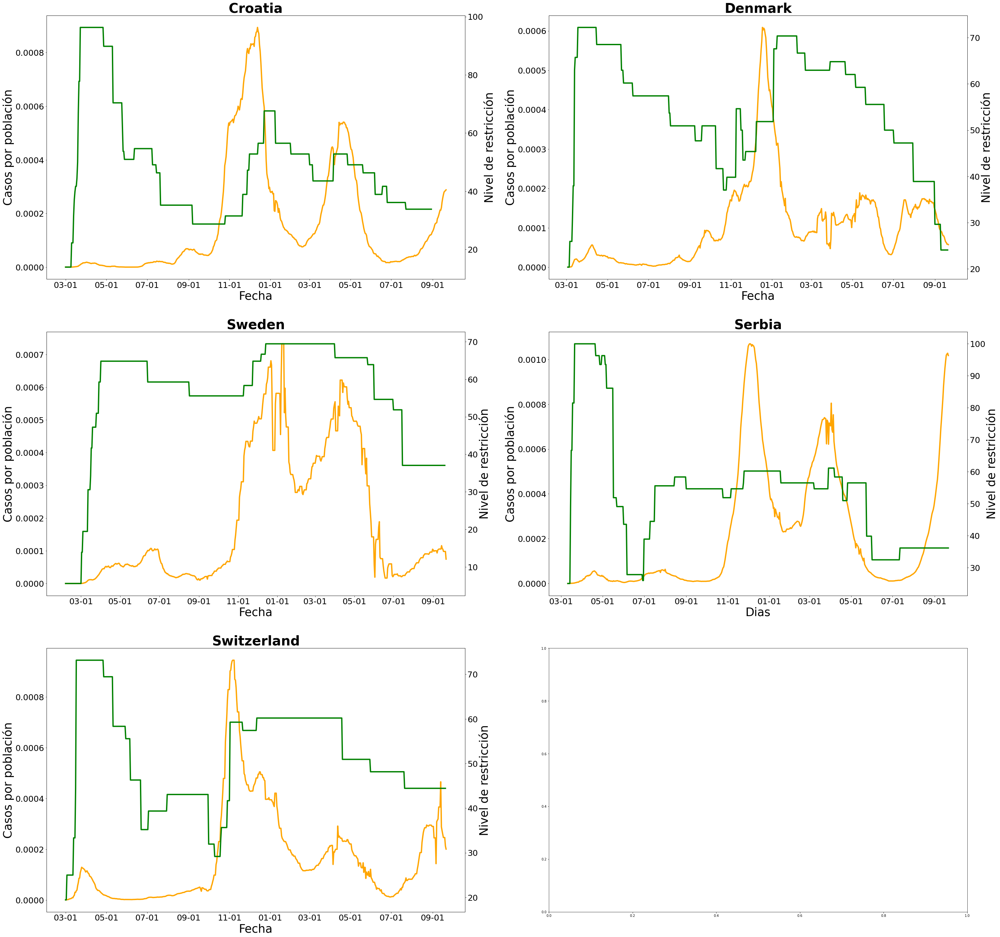

In [59]:
casosnuevosSin = []
diaspaisSin = []
restriccionSin = []

for i in range(len(PaisesSin)):
    paises = datos2[(datos2.location == PaisesSin[i]) & (datos2.new_cases_smoothed >= 0)]
    casosnuevos = paises.new_cases_smoothed/paises.population
    dias= paises.date
    restriccion = paises['stringency_index']
    restriccionSin.append(restriccion)
    casosnuevosSin.append(casosnuevos)
    diaspaisSin.append(dias)

fig = pl.figure(figsize = (50,50))
gs = fig.add_gridspec(3, 2)
((ax1, ax2), (ax3, ax4), (ax5, ax6)) = gs.subplots()

date_form = DateFormatter("%m-%d")

ax1.plot(diaspaisSin[0],casosnuevosSin[0], color = "orange", lw=4)
ax1.set_title(PaisesSin[0],fontweight="bold", size=40)
ax1.set_xlabel('Fecha', fontsize = 35)
ax1.set_ylabel('Casos por población', fontsize = 35)
ax1.xaxis.set_tick_params(labelsize = 25)
ax1.yaxis.set_tick_params(labelsize = 25)
ax1.xaxis.set_major_formatter(date_form)

ax1_1=ax1.twinx()
ax1_1.plot(diaspaisSin[0],restriccionSin[0], color = "green", lw=4)
ax1_1.yaxis.set_tick_params(labelsize = 25)
ax1_1.set_xlabel('Fecha', fontsize = 35)
ax1_1.set_ylabel('Nivel de restricción', fontsize = 35)
ax1_1.xaxis.set_major_formatter(date_form)

ax2.plot(diaspaisSin[1],casosnuevosSin[1], color = "orange", lw=4)
ax2.set_title(PaisesSin[1],fontweight="bold", size=40)
ax2.set_xlabel('Fecha', fontsize = 35)
ax2.set_ylabel('Casos por población', fontsize = 35)
ax2.xaxis.set_tick_params(labelsize = 25)
ax2.yaxis.set_tick_params(labelsize = 25)
ax2.xaxis.set_major_formatter(date_form)

ax1_2 = ax2.twinx()
ax1_2.plot(diaspaisSin[1],restriccionSin[1], color = "green", lw=4)
ax1_2.set_xlabel('Fecha', fontsize = 35)
ax1_2.set_ylabel('Nivel de restricción', fontsize = 35)
ax1_2.xaxis.set_tick_params(labelsize = 25)
ax1_2.yaxis.set_tick_params(labelsize = 25)
ax1_2.xaxis.set_major_formatter(date_form)

ax3.plot(diaspaisSin[2],casosnuevosSin[2], color = "orange", lw=4)
ax3.set_title(PaisesSin[2],fontweight="bold", size=40)
ax3.set_xlabel('Fecha', fontsize = 35)
ax3.set_ylabel('Casos por población', fontsize = 35)
ax3.xaxis.set_tick_params(labelsize = 25)
ax3.yaxis.set_tick_params(labelsize = 25)
ax3.xaxis.set_major_formatter(date_form)

ax1_3 = ax3.twinx()
ax1_3.plot(diaspaisSin[2],restriccionSin[2], color = "green", lw=4)
ax1_3.set_xlabel('Fecha', fontsize = 35)
ax1_3.set_ylabel('Nivel de restricción', fontsize = 35)
ax1_3.xaxis.set_tick_params(labelsize = 25)
ax1_3.yaxis.set_tick_params(labelsize = 25)
ax1_3.xaxis.set_major_formatter(date_form)

ax4.plot(diaspaisSin[3],casosnuevosSin[3], color = "orange", lw=4)
ax4.set_title(PaisesSin[3],fontweight="bold", size=40)
ax4.set_xlabel('Dias', fontsize = 35)
ax4.set_ylabel('Casos por población', fontsize = 35)
ax4.xaxis.set_tick_params(labelsize = 25)
ax4.yaxis.set_tick_params(labelsize = 25)
ax4.xaxis.set_major_formatter(date_form)

ax1_4 = ax4.twinx()
ax1_4.plot(diaspaisSin[3],restriccionSin[3], color = "green", lw=4)
ax1_4.set_xlabel('Fecha', fontsize = 35)
ax1_4.set_ylabel('Nivel de restricción', fontsize = 35)
ax1_4.xaxis.set_tick_params(labelsize = 25)
ax1_4.yaxis.set_tick_params(labelsize = 25)
ax1_4.xaxis.set_major_formatter(date_form)

ax5.plot(diaspaisSin[4],casosnuevosSin[4], color = "orange", lw=4)
ax5.set_title(PaisesSin[4],fontweight="bold", size=40)
ax5.set_xlabel('Fecha', fontsize = 35)
ax5.set_ylabel('Casos por población', fontsize = 35)
ax5.xaxis.set_tick_params(labelsize = 25)
ax5.yaxis.set_tick_params(labelsize = 25)
ax5.xaxis.set_major_formatter(date_form)

ax1_5 = ax5.twinx()
ax1_5.plot(diaspaisSin[4],restriccionSin[4], color = "green", lw=4)
ax1_5.set_xlabel('Fecha', fontsize = 35)
ax1_5.set_ylabel('Nivel de restricción', fontsize = 35)
ax1_5.xaxis.set_tick_params(labelsize = 25)
ax1_5.yaxis.set_tick_params(labelsize = 25)
ax1_5.xaxis.set_major_formatter(date_form)

pl.show()

In [60]:
dateMinSin = ['2020-10-01', '2020-11-01', '2020-10-01', '2020-10-01', '2020-10-01']
dateMaxSin = ['2021-02-01', '2021-02-01', '2021-02-01', '2021-02-01', '2021-02-01']

Hacemos los mismo que hicimos para los PaisesCon pero para los paísesSin para poder observar mejor las fechas.

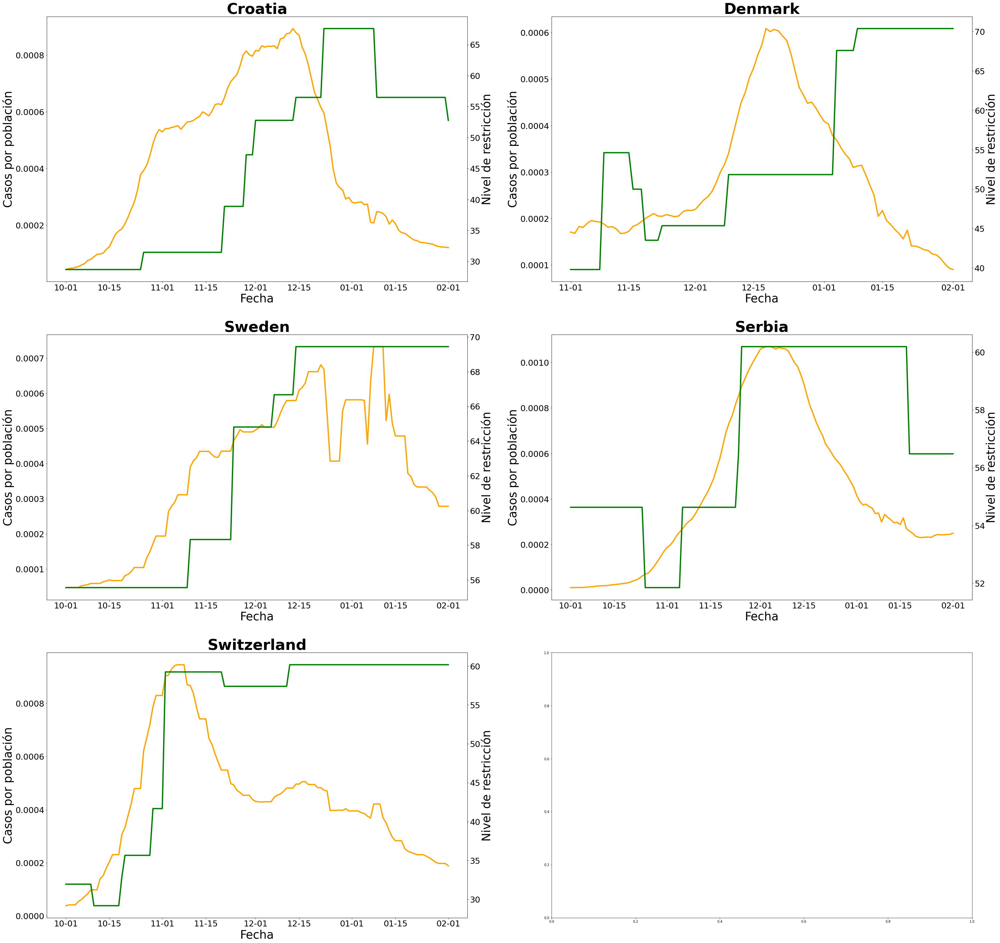

In [61]:
casosnuevosSin_2 = []
diaspaisSin_2 = []
restriccionSin_2 = []

for i in range(len(PaisesSin)):
    paises = datos2[(datos2.location == PaisesSin[i]) & (datos2.new_cases_smoothed >= 0) & (datos2.date >= dateMinSin[i]) & (datos2.date <= dateMaxSin[i])]
    casosnuevos = paises.new_cases_smoothed/paises.population
    dias= paises.date
    restriccion = paises['stringency_index']
    restriccionSin_2.append(restriccion)
    casosnuevosSin_2.append(casosnuevos)
    diaspaisSin_2.append(dias)

fig = pl.figure(figsize = (50,50))
gs = fig.add_gridspec(3, 2)
((ax1, ax2), (ax3, ax4), (ax5, ax6)) = gs.subplots()

date_form = DateFormatter("%m-%d")

ax1.plot(diaspaisSin_2[0],casosnuevosSin_2[0], color = "orange", lw=4)
ax1.set_title(PaisesSin[0],fontweight="bold", size=45)
ax1.set_xlabel('Fecha', fontsize = 35)
ax1.set_ylabel('Casos por población', fontsize = 35)
ax1.xaxis.set_tick_params(labelsize = 25)
ax1.yaxis.set_tick_params(labelsize = 25)
ax1.xaxis.set_major_formatter(date_form)

ax1_1=ax1.twinx()
ax1_1.plot(diaspaisSin_2[0],restriccionSin_2[0], color = "green", lw=4)
ax1_1.yaxis.set_tick_params(labelsize = 25)
ax1_1.set_xlabel('Fecha', fontsize = 35)
ax1_1.set_ylabel('Nivel de restricción', fontsize = 35)
ax1_1.xaxis.set_major_formatter(date_form)

ax2.plot(diaspaisSin_2[1],casosnuevosSin_2[1], color = "orange", lw=4)
ax2.set_title(PaisesSin[1],fontweight="bold", size=45)
ax2.set_xlabel('Fecha', fontsize = 35)
ax2.set_ylabel('Casos por población', fontsize = 35)
ax2.xaxis.set_tick_params(labelsize = 25)
ax2.yaxis.set_tick_params(labelsize = 25)
ax2.xaxis.set_major_formatter(date_form)

ax1_2 = ax2.twinx()
ax1_2.plot(diaspaisSin_2[1],restriccionSin_2[1], color = "green", lw=4)
ax1_2.set_xlabel('Fecha', fontsize = 35)
ax1_2.set_ylabel('Nivel de restricción', fontsize = 35)
ax1_2.xaxis.set_tick_params(labelsize = 25)
ax1_2.yaxis.set_tick_params(labelsize = 25)
ax1_2.xaxis.set_major_formatter(date_form)

ax3.plot(diaspaisSin_2[2],casosnuevosSin_2[2], color = "orange", lw=4)
ax3.set_title(PaisesSin[2],fontweight="bold", size=45)
ax3.set_xlabel('Fecha', fontsize = 35)
ax3.set_ylabel('Casos por población', fontsize = 35)
ax3.xaxis.set_tick_params(labelsize = 25)
ax3.yaxis.set_tick_params(labelsize = 25)
ax3.xaxis.set_major_formatter(date_form)

ax1_3 = ax3.twinx()
ax1_3.plot(diaspaisSin_2[2],restriccionSin_2[2], color = "green", lw=4)
ax1_3.set_xlabel('Fecha', fontsize = 35)
ax1_3.set_ylabel('Nivel de restricción', fontsize = 35)
ax1_3.xaxis.set_tick_params(labelsize = 25)
ax1_3.yaxis.set_tick_params(labelsize = 25)
ax1_3.xaxis.set_major_formatter(date_form)

ax4.plot(diaspaisSin_2[3],casosnuevosSin_2[3], color = "orange", lw=4)
ax4.set_title(PaisesSin[3],fontweight="bold", size=45)
ax4.set_xlabel('Fecha', fontsize = 35)
ax4.set_ylabel('Casos por población', fontsize = 35)
ax4.xaxis.set_tick_params(labelsize = 25)
ax4.yaxis.set_tick_params(labelsize = 25)
ax4.xaxis.set_major_formatter(date_form)

ax1_4 = ax4.twinx()
ax1_4.plot(diaspaisSin_2[3],restriccionSin_2[3], color = "green", lw=4)
ax1_4.set_xlabel('Fecha', fontsize = 35)
ax1_4.set_ylabel('Nivel de restricción', fontsize = 35)
ax1_4.xaxis.set_tick_params(labelsize = 25)
ax1_4.yaxis.set_tick_params(labelsize = 25)
ax1_4.xaxis.set_major_formatter(date_form)

ax5.plot(diaspaisSin_2[4],casosnuevosSin_2[4], color = "orange", lw=4)
ax5.set_title(PaisesSin[4],fontweight="bold", size=45)
ax5.set_xlabel('Fecha', fontsize = 35)
ax5.set_ylabel('Casos por población', fontsize = 35)
ax5.xaxis.set_tick_params(labelsize = 25)
ax5.yaxis.set_tick_params(labelsize = 25)
ax5.xaxis.set_major_formatter(date_form)

ax1_5 = ax5.twinx()
ax1_5.plot(diaspaisSin_2[4],restriccionSin_2[4], color = "green", lw=4)
ax1_5.set_xlabel('Fecha', fontsize =35)
ax1_5.set_ylabel('Nivel de restricción', fontsize = 35)
ax1_5.xaxis.set_tick_params(labelsize = 25)
ax1_5.yaxis.set_tick_params(labelsize = 25)
ax1_5.xaxis.set_major_formatter(date_form)

pl.show()

Observamos los PaisesSin con sus casos por población y el nivel de restricción para las fechas designadas.

In [62]:
CRO = datos2[(datos2.location == PaisesSin[0]) & (datos2.new_cases_smoothed >= 0) & (datos2.date >= "2020-11-20") & (datos2.date <= "2020-12-20")]
CRO[['date','new_cases_smoothed', 'stringency_index']]

,date,new_cases_smoothed,stringency_index
26025,2020-11-20,2551.286,31.48
26026,2020-11-21,2652.286,38.89
26027,2020-11-22,2787.429,38.89
26028,2020-11-23,2881.714,38.89
26029,2020-11-24,2935.714,38.89
26030,2020-11-25,2986.000,38.89
26031,2020-11-26,3106.714,38.89
26032,2020-11-27,3267.000,38.89
26033,2020-11-28,3326.143,47.22
26034,2020-11-29,3270.571,47.22


Para Croacia vamos a tomar la fecha de "2020-12-13"

In [63]:
DEN = datos2[(datos2.location == PaisesSin[1]) & (datos2.new_cases_smoothed >= 0) & (datos2.date >= "2020-12-01") & (datos2.date <= "2021-01-01")]
DEN[['date','new_cases_smoothed', 'stringency_index']]

,date,new_cases_smoothed,stringency_index
29070,2020-12-01,1275.857,45.37
29071,2020-12-02,1333.429,45.37
29072,2020-12-03,1392.857,45.37
29073,2020-12-04,1432.857,45.37
29074,2020-12-05,1501.143,45.37
29075,2020-12-06,1608.429,45.37
29076,2020-12-07,1739.286,45.37
29077,2020-12-08,1837.429,45.37
29078,2020-12-09,1977.000,51.85
29079,2020-12-10,2194.857,51.85


Para Dinamarca vamos a tomar la fecha "2020-12-18".

In [64]:
SUE = datos2[(datos2.location == PaisesSin[2]) & (datos2.new_cases_smoothed >= 0) & (datos2.date >= "2020-12-15") & (datos2.date <= "2021-01-15")]
SUE[['date','new_cases_smoothed', 'stringency_index']]

,date,new_cases_smoothed,stringency_index
102766,2020-12-15,6185.286,69.44
102767,2020-12-16,6256.000,69.44
102768,2020-12-17,6391.143,69.44
102769,2020-12-18,6717.429,69.44
102770,2020-12-19,6717.429,69.44
102771,2020-12-20,6717.429,69.44
102772,2020-12-21,6717.429,69.44
102773,2020-12-22,6915.714,69.44
102774,2020-12-23,6780.429,69.44
102775,2020-12-24,5511.714,69.44


Para Suecia vamos a tomar la fecha "2021-01-11"

In [65]:
SER = datos2[(datos2.location == PaisesSin[3]) & (datos2.new_cases_smoothed >= 0) & (datos2.date >= "2020-11-20") & (datos2.date <= "2021-01-01")]
SER[['date','new_cases_smoothed', 'stringency_index']]

,date,new_cases_smoothed,stringency_index
93606,2020-11-20,4726.714,54.63
93607,2020-11-21,5005.571,54.63
93608,2020-11-22,5221.714,54.63
93609,2020-11-23,5543.714,54.63
93610,2020-11-24,5807.714,56.48
93611,2020-11-25,6088.571,60.19
93612,2020-11-26,6302.429,60.19
93613,2020-11-27,6520.429,60.19
93614,2020-11-28,6701.429,60.19
93615,2020-11-29,6870.571,60.19


Para Serbia vamos a elegir la fecha de "2020-12-04"

In [66]:
SUI = datos2[(datos2.location == PaisesSin[4]) & (datos2.new_cases_smoothed >= 0) & (datos2.date >= "2020-10-15") & (datos2.date <= "2020-11-15")]
SUI[['date','new_cases_smoothed', 'stringency_index']]

,date,new_cases_smoothed,stringency_index
103280,2020-10-15,1776.571,29.17
103281,2020-10-16,2007.714,29.17
103282,2020-10-17,2007.714,29.17
103283,2020-10-18,2007.714,29.17
103284,2020-10-19,2674.714,32.87
103285,2020-10-20,2898.000,35.65
103286,2020-10-21,3294.143,35.65
103287,2020-10-22,3671.714,35.65
103288,2020-10-23,4175.857,35.65
103289,2020-10-24,4175.857,35.65


Para Suiza vamos a elegir la fecha de "2020-11-08"

In [67]:
FechasConAño = [2021, 2020, 2021, 2020, 2020]
FechasConMes = [1, 12, 1, 11, 12]
FechasConDia = [9, 23, 28, 16, 22]
FechasSinAño = [2020, 2020, 2021, 2020, 2020]
FechasSinMes = [12, 12, 1, 12, 11]
FechasSinDia = [13, 18, 11, 4, 8]

Elegimos todas nuestras fechas para Con y Sin y las ponemos en arrays por Año, Mes y Día para poder usarlas después.

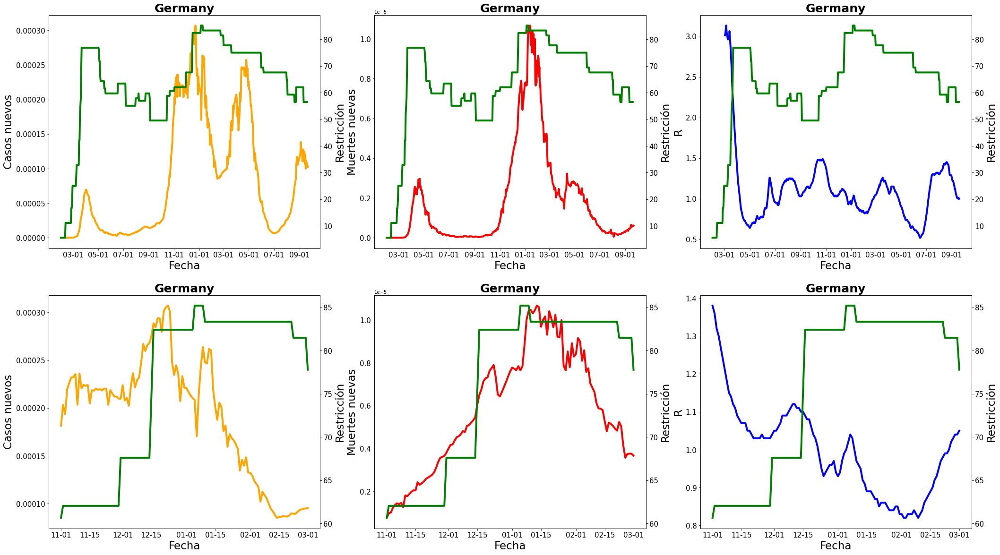

In [68]:
casosP_1 = datos2[datos2.location == 'Germany']

casosP_2 = casosP_1[(casosP_1.date >= "2020-01-01") & (casosP_1.date <= "2021-12-01") & (casosP_1.new_cases_smoothed > 0)]
casosP_3 = casosP_1[(casosP_1.date >= "2020-11-01") & (casosP_1.date <= "2021-03-01") & (casosP_1.new_cases_smoothed > 0)]

casosnuevosP = casosP_2['new_cases_smoothed']/casosP_2.population
diasP  = casosP_2['date']
restriccionP = casosP_2['stringency_index']
muertesP = casosP_2['new_deaths_smoothed']/casosP_2.population
R = casosP_2.reproduction_rate

casosnuevosP_2 = casosP_3['new_cases_smoothed']/casosP_3.population
diasP_2  = casosP_3['date']
restriccionP_2 = casosP_3['stringency_index']
muertesP_2 = casosP_3['new_deaths_smoothed']/casosP_3.population
R_2 = casosP_3.reproduction_rate

fig = pl.figure(figsize = (35,20))
gs = fig.add_gridspec(2, 3)
((ax1, ax2, ax3), (ax4, ax5, ax6)) = gs.subplots()

date_form = DateFormatter("%m-%d")

ax1.plot(diasP, casosnuevosP, color = "orange", lw=4)
ax1.set_title("Germany",fontweight="bold", size=25)
ax1.set_xlabel('Fecha', fontsize = 23)
ax1.set_ylabel('Casos nuevos', fontsize = 23)
ax1.xaxis.set_tick_params(labelsize = 15)
ax1.yaxis.set_tick_params(labelsize = 15)
ax1.xaxis.set_major_formatter(date_form)

ax1_1=ax1.twinx()
ax1_1.plot(diasP, restriccionP, color = "green", lw=4)
ax1_1.set_ylabel('Restricción', fontsize = 23)
ax1_1.xaxis.set_tick_params(labelsize = 15)
ax1_1.yaxis.set_tick_params(labelsize = 15)
ax1_1.xaxis.set_major_formatter(date_form)

ax2.plot(diasP, muertesP, color = "red", lw=4)
ax2.set_title("Germany",fontweight="bold", size=25)
ax2.set_xlabel('Fecha', fontsize = 23)
ax2.set_ylabel('Muertes nuevas', fontsize = 23)
ax2.xaxis.set_tick_params(labelsize = 15)
ax2.yaxis.set_tick_params(labelsize = 15)
ax2.xaxis.set_major_formatter(date_form)

ax1_2=ax2.twinx()
ax1_2.plot(diasP, restriccionP, color = "green", lw=4)
ax1_2.set_ylabel('Restricción', fontsize = 23)
ax1_2.xaxis.set_tick_params(labelsize = 15)
ax1_2.yaxis.set_tick_params(labelsize = 15)
ax1_2.xaxis.set_major_formatter(date_form)

ax3.plot(diasP,R, color = "blue", lw=4)
ax3.set_title("Germany",fontweight="bold", size=25)
ax3.set_xlabel('Fecha', fontsize = 23)
ax3.set_ylabel('R', fontsize = 23)
ax3.xaxis.set_tick_params(labelsize = 15)
ax3.yaxis.set_tick_params(labelsize = 15)
ax3.xaxis.set_major_formatter(date_form)

ax1_3=ax3.twinx()
ax1_3.plot(diasP, restriccionP, color = "green", lw=4)
ax1_3.set_ylabel('Restricción', fontsize = 23)
ax1_3.xaxis.set_tick_params(labelsize = 15)
ax1_3.yaxis.set_tick_params(labelsize = 15)
ax1_3.xaxis.set_major_formatter(date_form)

ax4.plot(diasP_2, casosnuevosP_2, color = "orange", lw=4)
ax4.set_title("Germany",fontweight="bold", size=25)
ax4.set_xlabel('Fecha', fontsize = 23)
ax4.set_ylabel('Casos nuevos', fontsize = 23)
ax4.xaxis.set_tick_params(labelsize = 15)
ax4.yaxis.set_tick_params(labelsize = 15)
ax4.xaxis.set_major_formatter(date_form)

ax4_1=ax4.twinx()
ax4_1.plot(diasP_2, restriccionP_2, color = "green", lw=4)
ax4_1.set_ylabel('Restricción', fontsize = 23)
ax4_1.xaxis.set_tick_params(labelsize = 15)
ax4_1.yaxis.set_tick_params(labelsize = 15)
ax4_1.xaxis.set_major_formatter(date_form)

ax5.plot(diasP_2, muertesP_2, color = "red", lw=4)
ax5.set_title("Germany",fontweight="bold", size=25)
ax5.set_xlabel('Fecha', fontsize = 23)
ax5.set_ylabel('Muertes nuevas', fontsize = 23)
ax5.xaxis.set_tick_params(labelsize = 15)
ax5.yaxis.set_tick_params(labelsize = 15)
ax5.xaxis.set_major_formatter(date_form)

ax5_2=ax5.twinx()
ax5_2.plot(diasP_2, restriccionP_2, color = "green", lw=4)
ax5_2.set_ylabel('Restricción', fontsize = 23)
ax5_2.xaxis.set_tick_params(labelsize = 15)
ax5_2.yaxis.set_tick_params(labelsize = 15)
ax5_2.xaxis.set_major_formatter(date_form)

ax6.plot(diasP_2,R_2, color = "blue", lw=4)
ax6.set_title("Germany",fontweight="bold", size=25)
ax6.set_xlabel('Fecha', fontsize = 23)
ax6.set_ylabel('R', fontsize = 23)
ax6.xaxis.set_tick_params(labelsize = 15)
ax6.yaxis.set_tick_params(labelsize = 15)
ax6.xaxis.set_major_formatter(date_form)

ax6_3=ax6.twinx()
ax6_3.plot(diasP_2, restriccionP_2, color = "green", lw=4)
ax6_3.set_ylabel('Restricción', fontsize = 23)
ax6_3.xaxis.set_tick_params(labelsize = 15)
ax6_3.yaxis.set_tick_params(labelsize = 15)
ax6_3.xaxis.set_major_formatter(date_form)

plt.show() 

A través de este ejemplo observamos para el país de Alemania diferentes estadísticas. Los gráficos de amarillo son para los casos nuevos smoothed, los gráficos de rojo para las muertes nuevas smoothed y los de azul son para lo que se conoce como R o índice de reproducción que calcula la velocidad de reproducción de contagios o a cuantas personas contagia una persona.
Algunas observaciones:
1. Los casos nuevos tienen el pico más grande para finales de diciembre del 2020 como se observa en ambos gráficos y más detenidamente en el segundo amarillo. 
2. El pico de muertes se da más cercano a la tercera quincena de Enero del 2021 lo que nos da una diferencia de aproximadamente 3 semanas desde el pico de casos al pico de muertes. Esto nos puede significar que el pico de muertes se da 21 días después del pico de casos, lo cuál tiene sentido teniendo en cuenta que las muertes se producen después de un periodo de contagio y hospitalización.
3. El R es relativamente constante y crece mucho generalmente al principio de la curva de contagios.

Teniendo en cuenta estas observaciones vamos a tomar el pico de contagios y de ahí el promedio de cuarentena de 14 días antes y 14 días después para visualizar las medidas. En ese rango vamos a tomar los nuevos casos smoothed con su antes y después en promedio de 14 días, teniendo en cuenta que el proceso de evolución de la enfermedad tarda eso. También vamos a tomar las muertes producidas 14 días antes del pico de muertes, el cuál sería 21 días después del pico de casos, y 14 días después. Por útlimo también vamos a tomar el R y lo vamos a medir en promedio 14 días antes del pico de casos y 14 días después. 

In [69]:
def estadisticas (pais, fecha1, fecha2, fecha3, fecha4, fecha5, fecha6):
    
    #fecha1 es la fecha del pico de contagios, 
    #fecha2 es 14 días antes para tomar el valor de cuarentena en ese periodo
    #fecha3 es 14 días despúes del pico, se toma como fecha final de la parte 2 de los contagios
    #fecha4 es la fecha 14 días antes que es el pico de muertes
    #fehca5 es el pico de muertes que es 21 días después que el pico de casos
    #fecha6 es 14 días después del pico de muertes
  
    #fecha2---14---fecha1(pico casos y R)---14---fecha3
    #fecha5 = fecha1 + 21
    #fecha4---14---fecha5(pico muertes)---14---fecha6
    
    pais1 = datos2[datos2.location == pais]
    
    pais2 = pais1[(pais1.date >= fecha2) & (pais1.date <= fecha1) & (pais1.new_cases_smoothed > 0)]
    pais3 = pais1[(pais1.date > fecha1) & (pais1.date <= fecha3) & (pais1.new_cases_smoothed > 0)]
    
    pais4 = pais1[(pais1.date >= fecha4) & (pais1.date <= fecha5) & (pais1.new_cases_smoothed > 0)]
    pais5 = pais1[(pais1.date > fecha5) & (pais1.date <= fecha6) & (pais1.new_cases_smoothed > 0)]
    
    pais6 = pais1[(pais1.date == fecha1)]
    
    casosC2 = pais2['new_cases_smoothed']/pais2.population*10000
    casosC3 = pais3['new_cases_smoothed']/pais3.population*10000
    
    casosC2Promedio = np.mean(casosC2)
    casosC3Promedio = np.mean(casosC3)
    
    if casosC2Promedio == 0:
        porcentajecasos = np.nan
    else: 
        porcentajecasos = (casosC2Promedio-casosC3Promedio)*100/casosC2Promedio
       
    R2 = pais2['reproduction_rate']
    R3 = pais3['reproduction_rate']
    
    promedioR2 = np.mean(R2)
    promedioR3 = np.mean(R3)
    
    if promedioR2 == 0:
        porcentajeR = np.nan
    else: 
        porcentajeR = (promedioR2-promedioR3)*100/promedioR2
    
    D2 = pais4['new_deaths_smoothed']/pais4.population*10000
    D3 = pais5['new_deaths_smoothed']/pais5.population*10000
    
    promedioD2 = np.mean(D2)
    promedioD3 = np.mean(D3)
    
    if promedioD2 == 0:
        porcentajemuertes = np.nan
    else: 
        porcentajemuertes = (promedioD2-promedioD3)*100/promedioD2

    cuarentena2 = pais2['stringency_index']
    cuarentena3 = pais3['stringency_index']
    promedioCUA2 = np.mean(cuarentena2)
    promedioCUA3 = np.mean(cuarentena3)
    
    Densidad = np.mean(pais1.population_density)
    
    PoblacionContagiada = pais6['total_cases'].values*100/pais6.population.values
    
    return (casosC2Promedio, casosC3Promedio, promedioD2, promedioD3, promedioR2, promedioR3,  promedioCUA2, promedioCUA3, porcentajecasos,porcentajemuertes, porcentajeR, Densidad, PoblacionContagiada)

Hacemos una función para sacar estadísticas

Sacamos:
1. Promedio de restricción de cuarentena 14 días antes y 14 días después del pico de casos.
2. Promedio de casos nuevos smoothed por población 14 días antes y 14 dias después del pico de casos.
3. Porcentaje de diferencia entre casos nuevos smoothed por población entre el periodo anes y después del pico de casos.
4. Promedio de R 14 días antes y 14 días después del pico de casos.
5. Porcentaje de diferencia de R entre el periodo antes y después del pico de casos.
6. Promedio de muertes 14 días antes y después del pico de muertes que sería 21 días después del pico de casos.
7. Porcentaje de diferencia de muertes entre el periodo antes y después de 21 días después del pico de casos.
8. Densidad de la población.
9. Porcentaje de población total contagiada en la fecha del pico de contagios.

***Los indicadores que vamos a tomar van a ser:***

***A. El porcentaje de diferencia de casos nuevos smoothed entre el periodo antes y después del pico de casos.***

***B. El porcentaje de diferencia de R antes y después del pico de casos.***

***C. El porcentaje de diferencia de muertes antes y después del pico de muertes.***

In [70]:
paisE = []
Fase1E = []
PromedioCasosE_1 = []
PromedioCasosE_2 = []
PromedioMuertesE_1 = []
PromedioMuertesE_2 = []
RE_1 = []
RE_2 = []
cuarentenaE_2 = []
cuarentenaE_3 = []
porcentajecasosE = []
porcentajemuertesE = []
porcentajeRE = []
DensidadE = []
PoblacionContagiadaE = []

for i in range(len(PaisesCon)):
    
    fecha1 = date(FechasConAño[i], FechasConMes[i], FechasConDia[i])
    
    fecha2 = fecha1 - dt.timedelta(days=14)     
    fecha3 = fecha1 + dt.timedelta(days=14)
    
    fecha5 = fecha1 + dt.timedelta(days=21)
    fecha4 = fecha5 - dt.timedelta(days=14)
    fecha6 = fecha5 + dt.timedelta(days=14)
    
    date1 = dt.datetime(year=fecha1.year, month=fecha1.month, day=fecha1.day)
    date2 = dt.datetime(year=fecha2.year, month=fecha2.month, day=fecha2.day)
    date3 = dt.datetime(year=fecha3.year, month=fecha3.month, day=fecha3.day)
    date4 = dt.datetime(year=fecha4.year, month=fecha4.month, day=fecha4.day)
    date5 = dt.datetime(year=fecha5.year, month=fecha5.month, day=fecha5.day)
    date6 = dt.datetime(year=fecha6.year, month=fecha6.month, day=fecha6.day)
    
    e = estadisticas(PaisesCon[i], date1, date2, date3, date4, date5, date6)
    
    paisE.append(PaisesCon[i])
    Fase1E.append(1)
    PromedioCasosE_1.append(e[0])
    PromedioCasosE_2.append(e[1])
    PromedioMuertesE_1.append(e[2])
    PromedioMuertesE_2.append(e[3])
    RE_1.append(e[4])
    RE_2.append(e[5])
    cuarentenaE_2.append(e[6])
    cuarentenaE_3.append(e[7])
    porcentajecasosE.append(e[8])
    porcentajemuertesE.append(e[9])
    porcentajeRE.append(e[10])
    DensidadE.append(e[11])
    PoblacionContagiadaE.append(e[12][0])
    
for i in range(len(PaisesSin)):
    
    fecha1 = date(FechasSinAño[i], FechasSinMes[i], FechasSinDia[i]) 
    
    fecha2 = fecha1 - dt.timedelta(days=14)     
    fecha3 = fecha1 + dt.timedelta(days=14)
    
    fecha5 = fecha1 + dt.timedelta(days=21)
    fecha4 = fecha5 - dt.timedelta(days=14)
    fecha6 = fecha5 + dt.timedelta(days=14)
    
    date1 = dt.datetime(year=fecha1.year, month=fecha1.month, day=fecha1.day)
    date2 = dt.datetime(year=fecha2.year, month=fecha2.month, day=fecha2.day)
    date3 = dt.datetime(year=fecha3.year, month=fecha3.month, day=fecha3.day)
    date4 = dt.datetime(year=fecha4.year, month=fecha4.month, day=fecha4.day)
    date5 = dt.datetime(year=fecha5.year, month=fecha5.month, day=fecha5.day)
    date6 = dt.datetime(year=fecha6.year, month=fecha6.month, day=fecha6.day)
    
    e = estadisticas(PaisesSin[i], date1, date2, date3, date4, date5, date6)
    
    paisE.append(PaisesSin[i])
    Fase1E.append(0)
    PromedioCasosE_1.append(e[0])
    PromedioCasosE_2.append(e[1])
    PromedioMuertesE_1.append(e[2])
    PromedioMuertesE_2.append(e[3])
    RE_1.append(e[4])
    RE_2.append(e[5])
    cuarentenaE_2.append(e[6])
    cuarentenaE_3.append(e[7])
    porcentajecasosE.append(e[8])
    porcentajemuertesE.append(e[9])
    porcentajeRE.append(e[10])
    DensidadE.append(e[11])
    PoblacionContagiadaE.append(e[12][0])
       
frameE = pd.DataFrame({"pais": paisE, "Fase1": Fase1E, "promedioCasos1": PromedioCasosE_1, "promedioCasos2": PromedioCasosE_2, "proemdioMuertes1": PromedioMuertesE_1, "promedioMuertes2": PromedioMuertesE_2, "R1": RE_1, "R2": RE_2, "cuarentenaC1": cuarentenaE_2, "cuarentenaC2": cuarentenaE_3, "porcentajecasos": porcentajecasosE, "porcentajemuertes": porcentajemuertesE, "porcentajeR": porcentajeRE, "Densidad": DensidadE, "PoblacionContagiada": PoblacionContagiadaE})
frameE

,pais,Fase1,promedioCasos1,promedioCasos2,proemdioMuertes1,promedioMuertes2,R1,R2,cuarentenaC1,cuarentenaC2,porcentajecasos,porcentajemuertes,porcentajeR,Densidad,PoblacionContagiada
0,United Kingdom,1,7.081130,7.052903,0.176553,0.136504,1.260000,0.869286,82.406667,87.960000,0.398619,22.684242,31.009070,272.898,4.436995
1,Germany,1,2.779450,2.261616,0.088372,0.095687,1.076000,0.960714,75.988000,82.807143,18.630816,-8.276855,10.714286,237.016,1.911943
2,Portugal,1,10.725129,8.566887,0.193775,0.066134,1.194667,0.690000,73.516667,81.611429,20.123226,65.870498,42.243304,112.371,6.740639
3,Italy,1,5.326404,5.085688,0.119202,0.107292,1.200000,0.898571,78.147333,79.630000,4.519298,9.991313,25.119048,205.859,1.997568
4,Netherlands,1,5.163337,5.693268,0.054509,0.050191,1.263333,0.920000,67.837333,78.700000,-10.263331,7.922011,27.176781,508.544,4.200926
5,Croatia,0,8.380980,6.535161,0.170122,0.105724,1.062667,0.740000,52.038667,60.447857,22.023900,37.853750,30.363864,73.726,4.309181
6,Denmark,0,4.138948,5.124700,0.042448,0.051044,1.329333,0.949286,49.690000,51.850000,-23.816490,-20.251208,28.589339,136.520,2.216881
7,Sweden,0,6.026012,4.250134,0.100317,0.060661,1.321333,0.954286,69.440000,69.440000,29.470196,39.530736,27.778579,24.718,4.817553
8,Serbia,0,9.290905,9.760420,0.076279,0.065067,1.282000,0.932143,58.460000,60.190000,-5.053489,14.698778,27.289949,80.291,3.041180
9,Switzerland,0,8.187532,6.948861,0.107209,0.104295,1.478000,0.938571,48.273333,58.995714,15.128744,2.718526,36.497197,214.243,2.431451


Observamos los resultados. Vemos claramente como se distinguen los promedios de CuarentenaC1 en los países de arriba y abajo, que es lo que estábamos buscando. Sin embargo, nuestros porcentaje de casos, muertes y R no dan tanta diferencia como hubieramos esperado.

In [71]:
Fase1Si = frameE[frameE.Fase1 == 1]
Fase1No = frameE[frameE.Fase1 == 0]

promediocasosFase1Si = np.mean(Fase1Si.porcentajecasos)
promediocasosFase1No = np.mean(Fase1No.porcentajecasos)
promediomuertesFase1Si = np.mean(Fase1Si.porcentajemuertes)
promediomuertesFase1No = np.mean(Fase1No.porcentajemuertes)
promedioRFase1Si = np.mean(Fase1Si.porcentajeR)
promedioRFase1No = np.mean(Fase1No.porcentajeR)

printmd(f"***PromedioCasosFase1Si:***")
print(promediocasosFase1Si)
printmd(f"***PromedioCasosFase1No:***")
print(promediocasosFase1No)
printmd(f"***PromedioMuertesFase1Si:***")
print(promediomuertesFase1Si)
printmd(f"***PromedioMuertesFase1No:***")
print(promediomuertesFase1No)
printmd(f"***PromedioRFase1Si:***")
print(promedioRFase1Si)
printmd(f"***PromedioRFase1No:***")
print(promedioRFase1No)

***PromedioCasosFase1Si:***

6.681725606033308


***PromedioCasosFase1No:***

7.55057217578346


***PromedioMuertesFase1Si:***

19.63824185555282


***PromedioMuertesFase1No:***

14.910116561126728


***PromedioRFase1Si:***

27.252497640437007


***PromedioRFase1No:***

30.103785660040653


Observamos la diferencia de promedio de Casos, Muertes y R de países con Fase1 en 1 y Fase1 en 0 y vemos que no hay mucha diferencia en general.

In [72]:
frameE_2 = frameE.copy()

for i in range(frameE_2.shape[0]):
    if ((frameE_2.cuarentenaC1[i] >= 70)):
        frameE_2.Fase1[i] = 1
    elif ((frameE_2.cuarentenaC1[i] < 70)):
        frameE_2.Fase1[i] = 0
frameE_2

C:\Users\SARODR~1\AppData\Local\Temp/ipykernel_26652/1684001140.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frameE_2.Fase1[i] = 1
C:\Users\SARODR~1\AppData\Local\Temp/ipykernel_26652/1684001140.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  frameE_2.Fase1[i] = 0


,pais,Fase1,promedioCasos1,promedioCasos2,proemdioMuertes1,promedioMuertes2,R1,R2,cuarentenaC1,cuarentenaC2,porcentajecasos,porcentajemuertes,porcentajeR,Densidad,PoblacionContagiada
0,United Kingdom,1,7.081130,7.052903,0.176553,0.136504,1.260000,0.869286,82.406667,87.960000,0.398619,22.684242,31.009070,272.898,4.436995
1,Germany,1,2.779450,2.261616,0.088372,0.095687,1.076000,0.960714,75.988000,82.807143,18.630816,-8.276855,10.714286,237.016,1.911943
2,Portugal,1,10.725129,8.566887,0.193775,0.066134,1.194667,0.690000,73.516667,81.611429,20.123226,65.870498,42.243304,112.371,6.740639
3,Italy,1,5.326404,5.085688,0.119202,0.107292,1.200000,0.898571,78.147333,79.630000,4.519298,9.991313,25.119048,205.859,1.997568
4,Netherlands,0,5.163337,5.693268,0.054509,0.050191,1.263333,0.920000,67.837333,78.700000,-10.263331,7.922011,27.176781,508.544,4.200926
5,Croatia,0,8.380980,6.535161,0.170122,0.105724,1.062667,0.740000,52.038667,60.447857,22.023900,37.853750,30.363864,73.726,4.309181
6,Denmark,0,4.138948,5.124700,0.042448,0.051044,1.329333,0.949286,49.690000,51.850000,-23.816490,-20.251208,28.589339,136.520,2.216881
7,Sweden,0,6.026012,4.250134,0.100317,0.060661,1.321333,0.954286,69.440000,69.440000,29.470196,39.530736,27.778579,24.718,4.817553
8,Serbia,0,9.290905,9.760420,0.076279,0.065067,1.282000,0.932143,58.460000,60.190000,-5.053489,14.698778,27.289949,80.291,3.041180
9,Switzerland,0,8.187532,6.948861,0.107209,0.104295,1.478000,0.938571,48.273333,58.995714,15.128744,2.718526,36.497197,214.243,2.431451


Ponemos el promedio de Casos1 por arriba de 70 y vamos a tomar Fase1 en 1 cuando el promedio de Casos 1 esté por arriba de ese valor, por lo que Holanda sale de ese rango y pasa a ser Fase1 0.

In [73]:
Fase1Si = frameE_2[frameE_2.Fase1 == 1]
Fase1No = frameE_2[frameE_2.Fase1 == 0]

promediocasosFase1Si = np.mean(Fase1Si.porcentajecasos)
promediocasosFase1No = np.mean(Fase1No.porcentajecasos)
promediomuertesFase1Si = np.mean(Fase1Si.porcentajemuertes)
promediomuertesFase1No = np.mean(Fase1No.porcentajemuertes)
promediopRFase1Si = np.mean(Fase1Si.porcentajeR)
promediopRFase1No = np.mean(Fase1No.porcentajeR)

printmd(f"***PromedioCasosFase1Si:***")
print(promediocasosFase1Si)
printmd(f"***PromedioCasosFase1No:***")
print(promediocasosFase1No)
printmd(f"***PromedioMuertesFase1Si:***")
print(promediomuertesFase1Si)
printmd(f"***PromedioMuertesFase1No:***")
print(promediomuertesFase1No)
printmd(f"***PromedioRFase1Si:***")
print(promedioRFase1Si)
printmd(f"***PromedioRFase1No:***")
print(promedioRFase1No)

***PromedioCasosFase1Si:***

10.91798983759458


***PromedioCasosFase1No:***

4.581588259784252


***PromedioMuertesFase1Si:***

22.56729953349976


***PromedioMuertesFase1No:***

13.745432324899786


***PromedioRFase1Si:***

27.252497640437007


***PromedioRFase1No:***

30.103785660040653


Visualizamos de nuevo los promedios y vemos como se diferencian un poco más, por lo que vamos a tomar el promedio de la cuarentena 14 días antes del pico que sea mayor o igual a 70 para Fase1 en 1, si es menor lo vamos a poner en 0.

Text(0, 0.5, 'Fase1')

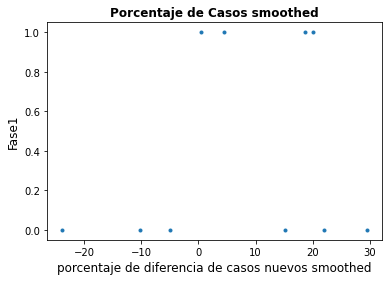

In [74]:
porcentajeCasosE_2 = frameE_2.porcentajecasos
Fase1E_2 = frameE_2.Fase1

plt.plot(porcentajeCasosE_2,Fase1E_2,'.')
plt.title("Porcentaje de Casos smoothed", fontweight="bold", size=12)
plt.xlabel('porcentaje de diferencia de casos nuevos smoothed', size=12)
plt.ylabel('Fase1', size=12)

Vemos que la dstribución del porcentajde de la diferencia no es tan claro, aunque para los de Fase1 en 1 no hay valores menores a 0.

Text(0, 0.5, 'Fase1')

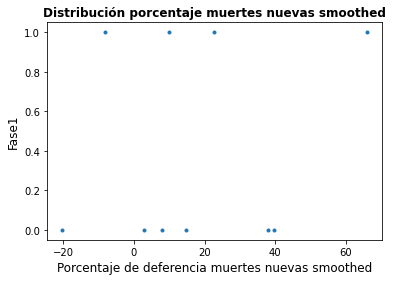

In [75]:
porcentajeMuertesE_2 = frameE_2.porcentajemuertes
Fase1E_2 = frameE_2.Fase1

plt.plot(porcentajeMuertesE_2,Fase1E_2,'.')
plt.title("Distribución porcentaje muertes nuevas smoothed", fontweight="bold", size=12)
plt.xlabel('Porcentaje de deferencia muertes nuevas smoothed', size=12)
plt.ylabel('Fase1', size=12)

Vemos que la dstribución del porcentajde de la diferencia de muertes no es tan claro, aunque vemos que tres de cuatro datos de Fase1 en 1 se encuentra después del 0.

Text(0, 0.5, 'Fase1')

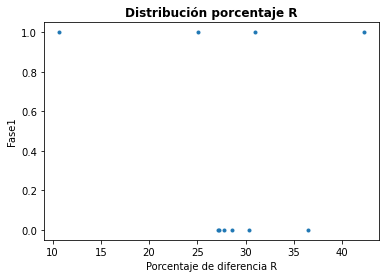

In [76]:
porcentajeRE_2 = frameE_2.porcentajeR
Fase1E_2 = frameE_2.Fase1

plt.plot(porcentajeRE_2,Fase1E_2,'.')
plt.title("Distribución porcentaje R", fontweight="bold", size=12)
plt.xlabel('Porcentaje de diferencia R')
plt.ylabel('Fase1')

Acá es más difícil de determinar todavía porque hay muchos porcentajes de diferencia de R por encima de 25 tanto de Fase1 en 1 como en Fase1 en 0.

***Para poder determinar mejor los límites vamos a tomar más datos, vamos a tomar los primeros 20 países de Europa.***

In [77]:
def fechamax(pais): 
    paises = datos2[datos2.location == pais]
    casosmax = np.max(paises.new_cases_smoothed)
    fecha = paises.loc[paises.new_cases_smoothed == casosmax, 'date'].values[0]
    fechamax = np.max(fecha)
    return (fechamax)

print(fechamax('Albania'))

2021-02-11T00:00:00.000000000


Hacemos una función de fechamax para sacar la fecha del pico máximo de nuevos casos smoothed.

In [78]:
paisE_2 = []
Fase1E_2 = []
PromedioCasos1E_2 = []
PromedioCasos2E_2 = []
PromedioMuertes1E_2 = []
PromedioMuertes2E_2 = []
R1E_2 = []
R2E_2 = []
cuarentenaC2E_2 = []
cuarentenaC3E_2 = []
porcentajecasosE_2 = []
porcentajemuertesE_2 = []
porcentajeRE_2 = []
DensidadE_2=[]
PoblacionContagiadaE_2 = []

for i in range(20):
    
    date1 = fechamax(PaisesEuropa[i])
    
    date2 = date1 - np.timedelta64(14, 'D')    
    date3 = date1 + np.timedelta64(14, 'D') 
    
    date5 = date1 + np.timedelta64(21, 'D')
    date4 = date5 - np.timedelta64(14, 'D')
    date6 = date5 + np.timedelta64(14, 'D')     
    
    e = estadisticas(PaisesEuropa[i], date1, date2, date3, date4, date5, date6)
    
    if ((e[6] >= 70)):
        C = 1
    else:
        C = 0
        
    if ((e[0] < 0.01) | (e[1] < 0.01) | (e[2] < 0.01) | (e[3] < 0.01) | (e[4] < 0.01) | (e[5] < 0.01)):
        C = np.nan
        
    paisE_2.append(PaisesEuropa[i])
    Fase1E_2.append(C)
    PromedioCasos1E_2.append(e[0])
    PromedioCasos2E_2.append(e[1])
    PromedioMuertes1E_2.append(e[2])
    PromedioMuertes2E_2.append(e[3])
    R1E_2.append(e[4])
    R2E_2.append(e[5])
    cuarentenaC2E_2.append(e[6])
    cuarentenaC3E_2.append(e[7])
    porcentajecasosE_2.append(e[8])
    porcentajemuertesE_2.append(e[9])
    porcentajeRE_2.append(e[10])
    DensidadE_2.append(e[11])
    PoblacionContagiadaE_2.append(e[12][0])
    
frameE_3 = pd.DataFrame({"pais": paisE_2, "Fase1": Fase1E_2, "promedioCasos1": PromedioCasos1E_2, "promedioCasos2": PromedioCasos2E_2, "proemdioMuertes1": PromedioMuertes1E_2, "promedioMuertes2": PromedioMuertes2E_2, "R1": R1E_2, "R2": R2E_2, "cuarentenaC1": cuarentenaC2E_2, "cuarentenaC2": cuarentenaC3E_2, "porcentajecasos": porcentajecasosE_2, "porcentajemuertes": porcentajemuertesE_2, "porcentajeR": porcentajeRE_2, "Densidad": DensidadE_2, "PoblacionContagiada": PoblacionContagiadaE_2})
frameE_3

,pais,Fase1,promedioCasos1,promedioCasos2,proemdioMuertes1,promedioMuertes2,R1,R2,cuarentenaC1,cuarentenaC2,porcentajecasos,porcentajemuertes,porcentajeR,Densidad,PoblacionContagiada
0,Albania,0.0,3.299696,3.678028,0.060168,0.061020,1.170000,1.007857,60.190000,60.190000,-11.465669,-1.416852,13.858364,104.871,3.124889
1,Andorra,NaN,12.166714,11.159946,0.013557,0.005282,1.283333,1.017143,55.184000,59.260000,8.274777,61.038961,20.742115,163.755,5.701063
2,Austria,1.0,6.141676,7.024207,0.105621,0.109138,1.399333,0.934286,72.962000,80.822143,-14.369541,-3.328992,33.233513,106.749,2.114635
3,Belarus,0.0,1.934935,NaN,NaN,NaN,1.086154,NaN,NaN,NaN,NaN,NaN,NaN,46.858,5.509831
4,Belgium,0.0,10.640259,9.527051,0.164591,0.120819,1.416000,0.765000,53.394667,64.417143,10.462229,26.594112,45.974576,375.564,3.544551
5,Bosnia and Herzegovina,0.0,4.556398,3.889638,0.214380,0.145895,1.208000,0.939286,42.590000,44.178571,14.633500,31.945774,22.244560,68.496,5.315771
6,Bulgaria,0.0,5.069124,4.542575,0.170062,0.132051,1.159333,0.910714,57.038000,54.229286,10.387379,22.350865,21.445001,65.180,4.907104
7,Croatia,0.0,8.380980,6.535161,0.170122,0.105724,1.062667,0.740000,52.038667,60.447857,22.023900,37.853750,30.363864,73.726,4.309181
8,Cyprus,0.0,9.662215,9.526859,0.030135,0.030796,1.432000,0.915000,39.013333,41.205000,1.400879,-2.194106,36.103352,127.657,10.388680
9,Czechia,1.0,9.015858,8.298067,0.140035,0.123215,1.237333,0.867143,73.150000,74.735714,7.961426,12.010801,29.918411,137.176,7.750113


Hacemos una tabla con los primeros 20 países de Europa. Le ponemos 1 a los que tienen CuarentenaC1 mayor o igual a 70, 0 al resto, que tiene menos de 70 en el nivel de restricción de la cuarentena. Si los promedios de Casos, muerte por población o R son más chicos que el 0.01 no vamos a tomar esos países por tener valores muy chicos. Lo que hicimos fue tomar la fecha máxima de casos nuevos smoothed y sacar nuestros estadísticas de acuerdo a eso.

In [79]:
frameE_4 = frameE_3.dropna().reset_index(drop=True)
frameE_4

,pais,Fase1,promedioCasos1,promedioCasos2,proemdioMuertes1,promedioMuertes2,R1,R2,cuarentenaC1,cuarentenaC2,porcentajecasos,porcentajemuertes,porcentajeR,Densidad,PoblacionContagiada
0,Albania,0.0,3.299696,3.678028,0.060168,0.061020,1.170000,1.007857,60.190000,60.190000,-11.465669,-1.416852,13.858364,104.871,3.124889
1,Austria,1.0,6.141676,7.024207,0.105621,0.109138,1.399333,0.934286,72.962000,80.822143,-14.369541,-3.328992,33.233513,106.749,2.114635
2,Belgium,0.0,10.640259,9.527051,0.164591,0.120819,1.416000,0.765000,53.394667,64.417143,10.462229,26.594112,45.974576,375.564,3.544551
3,Bosnia and Herzegovina,0.0,4.556398,3.889638,0.214380,0.145895,1.208000,0.939286,42.590000,44.178571,14.633500,31.945774,22.244560,68.496,5.315771
4,Bulgaria,0.0,5.069124,4.542575,0.170062,0.132051,1.159333,0.910714,57.038000,54.229286,10.387379,22.350865,21.445001,65.180,4.907104
5,Croatia,0.0,8.380980,6.535161,0.170122,0.105724,1.062667,0.740000,52.038667,60.447857,22.023900,37.853750,30.363864,73.726,4.309181
6,Cyprus,0.0,9.662215,9.526859,0.030135,0.030796,1.432000,0.915000,39.013333,41.205000,1.400879,-2.194106,36.103352,127.657,10.388680
7,Czechia,1.0,9.015858,8.298067,0.140035,0.123215,1.237333,0.867143,73.150000,74.735714,7.961426,12.010801,29.918411,137.176,7.750113
8,Denmark,0.0,4.138948,5.124700,0.042448,0.051044,1.329333,0.949286,49.690000,51.850000,-23.816490,-20.251208,28.589339,136.520,2.216881
9,Estonia,0.0,10.823765,8.767027,0.084444,0.069686,1.072667,0.835000,57.900667,61.110000,19.002058,17.476951,22.156619,31.033,7.199054


Eliminamos nuestras filas vacías y visualizamos nuestro dataset. Este va a ser el dataset de entrenamiento para poder predecir otros países.

Text(0, 0.5, 'Fase1')

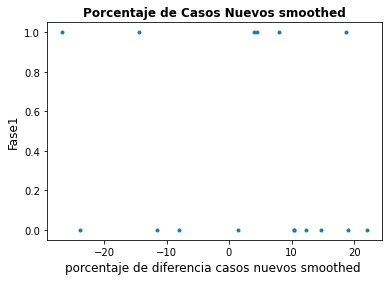

In [80]:
porcentajecasosE_4 = frameE_4.porcentajecasos
Fase1E_4 = frameE_4.Fase1

plt.plot(porcentajecasosE_4,Fase1E_4,'.')
plt.title("Porcentaje de Casos Nuevos smoothed", fontweight="bold", size=12)
plt.xlabel('porcentaje de diferencia casos nuevos smoothed ', size=12)
plt.ylabel('Fase1', size=12)

Observamos que se comportan de manera similar para Fase1 en 1 y Fase 1 en 0, lo cuál hace muy difícil el poder diferenciar la clasificación con estos datos.

Text(0, 0.5, 'Fase1')

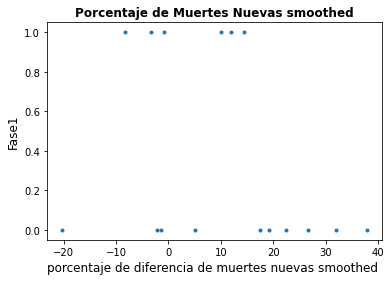

In [81]:
porcentajemuertesE_4 = frameE_4.porcentajemuertes
Fase1E_4 = frameE_4.Fase1

plt.plot(porcentajemuertesE_4,Fase1E_4,'.')
plt.title("Porcentaje de Muertes Nuevas smoothed", fontweight="bold", size=12)
plt.xlabel('porcentaje de diferencia de muertes nuevas smoothed ', size=12)
plt.ylabel('Fase1', size=12)

Observamos que el porcentaje de muertes es también muy difícil de usar como indicador, ya que los países que tuvieron mayores restricciones tuvieron menor porcentaje de diferencia entre el periodo antes y después del pico de muertes, lo cuál no sería muy lógico.

Text(0, 0.5, 'Fase1')

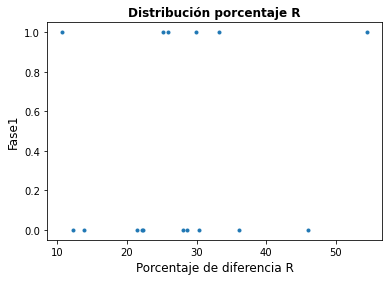

In [82]:
porcentajeRE_4 = frameE_4.porcentajeR
Fase1E_4 = frameE_4.Fase1

plt.plot(porcentajeRE_4,Fase1E_4,'.')
plt.title("Distribución porcentaje R", fontweight="bold", size=12)
plt.xlabel('Porcentaje de diferencia R', size=12)
plt.ylabel('Fase1', size=12)

Observamos que para R también el indicador es difícil de tomar porque no diferenica muy bien entre Fase1 en 1 y Fase1 en 0 ya que hay muchos datos dispersos.

#### 2. MODELOS DE CLASIFICACION ####

Vamos a implementar con estos datos modelos de regresión logística para cada indicador y modelos de naive-bayes.

##### 2.1 Obtención de los datos para test #####

Vamos a obtener los datos para test en donde vamos a utilizar los segundos 20 países para predecir. Las características de los datos que vamos a obtener son iguales a los de Train que son los primeros 20 países.

In [83]:
paisE_3 = []
Fase1E_3 = []
Fase1PredCasosE_3 = []
Fase1PredMuertesE_3 = []
Fase1PredRE_3 = []
PromedioCasos1E_3 = []
PromedioCasos2E_3 = []
PromedioMuertes1E_3 = []
PromedioMuertes2E_3 = []
R1E_3 = []
R2E_3 = []
cuarentenaC2E_3 = []
cuarentenaC3E_3 = []
porcentajecasosE_3 = []
porcentajemuertesE_3 = []
porcentajeRE_3 = []
DensidadE_3=[]
PoblacionContagiadaE_3 = []

for i in range(20,40):

    date1 = fechamax(PaisesEuropa[i])    
    date2 = date1 - np.timedelta64(14, 'D')    
    date3 = date1 + np.timedelta64(14, 'D') 
    
    date5 = date1 + np.timedelta64(21, 'D')
    date4 = date5 - np.timedelta64(14, 'D')
    date6 = date5 + np.timedelta64(14, 'D')     

    e = estadisticas(PaisesEuropa[i], date1, date2, date3, date4, date5, date6)
    
    if ((e[6] >= 70)):
        C = 1
    else:
        C = 0
        
    if ((e[0] < 0.01) | (e[1] < 0.01) | (e[2] < 0.01) | (e[3] < 0.01) | (e[4] < 0.01) | (e[5] < 0.01)):
        C = np.nan
    
    paisE_3.append(PaisesEuropa[i])
    Fase1E_3.append(C)
    PromedioCasos1E_3.append(e[0])
    PromedioCasos2E_3.append(e[1])
    PromedioMuertes1E_3.append(e[2])
    PromedioMuertes2E_3.append(e[3])
    R1E_3.append(e[4])
    R2E_3.append(e[5])
    cuarentenaC2E_3.append(e[6])
    cuarentenaC3E_3.append(e[7])
    porcentajecasosE_3.append(e[8])
    porcentajemuertesE_3.append(e[9])
    porcentajeRE_3.append(e[10])
    DensidadE_3.append(e[11])
    PoblacionContagiadaE_3.append(e[12][0])

frameE_5 = pd.DataFrame({"pais": paisE_3, "Fase1": Fase1E_3, "promedioCasos1": PromedioCasos1E_3, "promedioCasos2": PromedioCasos2E_3, "proemdioMuertes1": PromedioMuertes1E_3, "promedioMuertes2": PromedioMuertes2E_3, "R1": R1E_3, "R2": R2E_3, "cuarentenaC1": cuarentenaC2E_3, "cuarentenaC2": cuarentenaC3E_3, "porcentajecasos": porcentajecasosE_3, "porcentajemuertes": porcentajemuertesE_3, "porcentajeR": porcentajeRE_3, "Densidad": DensidadE_3, "PoblacionContagiada": PoblacionContagiadaE_3})
frameE_6 = frameE_5.dropna().reset_index(drop=True)
frameE_6

,pais,Fase1,promedioCasos1,promedioCasos2,proemdioMuertes1,promedioMuertes2,R1,R2,cuarentenaC1,cuarentenaC2,porcentajecasos,porcentajemuertes,porcentajeR,Densidad,PoblacionContagiada
0,Latvia,0.0,4.641530,4.654472,0.089120,0.097234,1.076000,0.985000,60.495333,57.410000,-0.278841,-9.105225,8.457249,31.212,2.655048
1,Liechtenstein,0.0,7.563479,7.927686,0.249002,0.056073,1.197333,0.862143,45.370000,45.370000,-4.815339,77.481103,27.994750,237.012,5.175929
2,Lithuania,0.0,10.247968,9.270106,0.157771,0.114300,1.107333,0.900000,68.147333,75.460000,9.542008,27.553364,18.723660,45.135,4.641725
3,Luxembourg,0.0,9.656975,8.388765,0.092414,0.102392,1.148667,1.025714,56.480000,58.335000,13.132573,-10.796714,10.703922,231.447,4.501003
4,Malta,0.0,5.492400,3.544510,0.039793,0.014873,1.122667,0.634286,59.692000,75.000000,35.465192,62.625234,43.501866,1454.037,5.259015
5,Moldova,0.0,3.805335,3.024994,0.088326,0.053556,1.068000,0.812143,66.727333,64.154286,20.506486,39.365859,23.956661,123.655,5.629215
6,Monaco,0.0,5.373971,4.575296,0.060307,0.064615,1.054667,0.895714,51.850000,53.835714,14.861907,-7.142857,15.071338,19347.500,4.111842
7,Netherlands,0.0,5.163337,5.693268,0.054509,0.050191,1.263333,0.920000,67.837333,78.700000,-10.263331,7.922011,27.176781,508.544,4.200926
8,Poland,1.0,6.495915,5.958876,0.136801,0.107000,1.207333,0.885000,73.457333,75.930000,8.267325,21.784029,26.697957,124.027,6.235865
9,Portugal,1.0,10.725129,8.566887,0.193775,0.066134,1.194667,0.690000,73.516667,81.611429,20.123226,65.870498,42.243304,112.371,6.740639


In [84]:
def sigmoidea(x,x0, k):
    y = 1 / (1 + np.exp(-k*(x-x0)))
    return (y)

Definimos nuestra función sgmoidea como función que vamos a fitear.

Text(0, 0.5, 'Fase1')

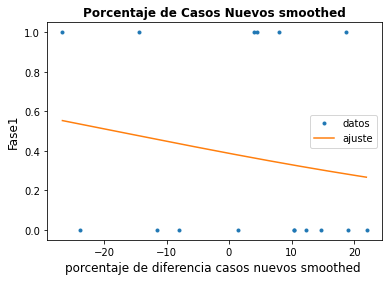

In [85]:
p0C = [np.median(frameE_4.porcentajecasos),1] # punto de partida para los parámetros

poptC, pcovC = curve_fit(sigmoidea, frameE_4.porcentajecasos, frameE_4.Fase1,p0C, method='dogbox') #hago fiteo
pC1 = poptC[0]
pC2 = poptC[1]

sigmoidea=np.vectorize(sigmoidea)
x_plot=np.arange(min(frameE_4.porcentajecasos),max(frameE_4.porcentajecasos),0.1)
PorcentajeCasosAjustado = sigmoidea(x_plot,pC1,pC2)

plt.plot(frameE_4.porcentajecasos,frameE_4.Fase1,'.',label="datos")
plt.plot(x_plot,PorcentajeCasosAjustado,label="ajuste")
plt.legend(loc= 'center right')
plt.title("Porcentaje de Casos Nuevos smoothed", fontweight="bold", size=12)
plt.xlabel('porcentaje de diferencia casos nuevos smoothed ', size=12)
plt.ylabel('Fase1', size=12)

Fiteamos la curva de la sigmoidea con el porcentaje de Casos Smoothed y vemos que no se ajusta muy bien. La función baja en cuanto el porcentaje de casos nuevos smoothed crece.

Text(0, 0.5, 'Fase1')

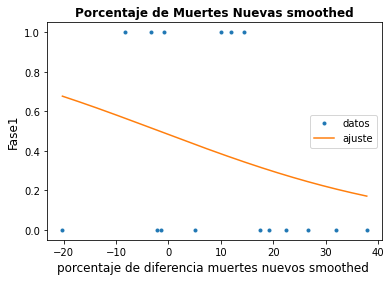

In [86]:
p0M = [np.median(frameE_4.porcentajemuertes),1] # punto de partida para los parámetros

poptM, pcovM = curve_fit(sigmoidea, frameE_4.porcentajemuertes, frameE_4.Fase1,p0M, method='dogbox') #hago fiteo
pM1 = poptM[0]
pM2 = poptM[1]

sigmoidea=np.vectorize(sigmoidea)
x_plot=np.arange(min(frameE_4.porcentajemuertes),max(frameE_4.porcentajemuertes),0.1)
PorcentajeMuertesAjustado= sigmoidea(x_plot,pM1,pM2)

plt.plot(frameE_4.porcentajemuertes,frameE_4.Fase1,'.',label="datos")
plt.plot(x_plot, PorcentajeMuertesAjustado, label="ajuste")
plt.legend(loc= 'center right')
plt.title("Porcentaje de Muertes Nuevas smoothed", fontweight="bold", size=12)
plt.xlabel('porcentaje de diferencia muertes nuevos smoothed ', size=12)
plt.ylabel('Fase1', size=12)

Observamos como se ajusta la sigmoidea con la diferencia del porcentaje de muertes y vemos que no se ajusta muy bien. La función baja en cuanto el porcentaje de mueres nuevas smoothed crece.

Text(0, 0.5, 'Fase1')

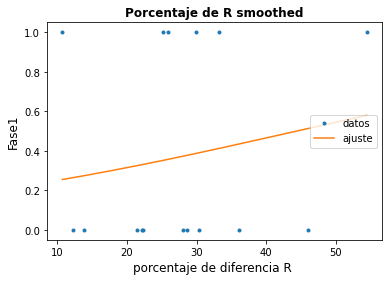

In [87]:
p0R = [np.median(frameE_4.porcentajeR),1] # punto de partida para los parámetros

poptR, pcovR = curve_fit(sigmoidea, frameE_4.porcentajeR, frameE_4.Fase1,p0R, method='dogbox') #hago fiteo
pR1 = poptR[0]
pR2 = poptR[1]

sigmoidea=np.vectorize(sigmoidea)
x_plot=np.arange(min(frameE_4.porcentajeR),max(frameE_4.porcentajeR),0.1)
PorcentajeRAjustado =sigmoidea(x_plot,pR1,pR2)

plt.plot(frameE_4.porcentajeR,frameE_4.Fase1,'.',label="datos")
plt.plot(x_plot, PorcentajeRAjustado, label="ajuste")
plt.legend(loc= 'center right')
plt.title("Porcentaje de R smoothed", fontweight="bold", size=12)
plt.xlabel('porcentaje de diferencia R ', size=12)
plt.ylabel('Fase1', size=12)

Hago el fiteo de la sigmoidea con R y vemos que tampoco nos da muy bien.

Las tres sigmoideas no se ajustan muy bien, esto demuestra la complejidad del problema. Sin embargo, vamos a buscar usar estos indicadores para predecir los segundos 20 valores de Europa y comparar los resultados.

##### 2.2 REGRESIÓN LOGÍSTICA #####

In [88]:
p0C_2 = [np.median(frameE_4.porcentajecasos),1] # punto de partida para los parámetros
popt, pcov = curve_fit(sigmoidea, frameE_4.porcentajecasos, frameE_4.Fase1,p0C_2, method='dogbox') #hago fiteo
pC1_2 = popt[0]
pC2_2 = popt[1]

F1Cpred2 = []
dato = 2
ProbDato = sigmoidea(dato,pC1_2, pC2_2)
F1Cpred= sigmoidea(frameE_6.porcentajecasos,pC1_2, pC2_2)

for i in range(len(F1Cpred)):
    if F1Cpred[i] > ProbDato:
        C2 = 1
    else:
        C2 = 0
    F1Cpred2.append(C2)

F1Cpred2

[1, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0]

Hacemos una predicción de los países del FrameE_6 que es el de test utilizando la sigmoidea con los parámetros utilizados cuando fiteamos Train. Ponemos un límite en 2 y decimos que los que estén a la izquierda de la probabilidad de 2 de la sigmoidea van a ser 0 y los que estén a la derecha van a ser 1.

In [89]:
p0M_2 = [np.median(frameE_4.porcentajemuertes),1] # punto de partida para los parámetros
popt, pcov = curve_fit(sigmoidea, frameE_4.porcentajemuertes, frameE_4.Fase1,p0M_2, method='dogbox') #hago fiteo
pM1_2 = popt[0]
pM2_2 = popt[1]

F1Mpred2 = []
dato = 10
ProbDato = sigmoidea(dato,pM1_2, pM2_2)
F1Mpred=sigmoidea(frameE_6.porcentajemuertes,pM1_2,pM2_2)

for i in range(len(F1Mpred)):
    if F1Mpred[i] > ProbDato:
        M2 = 1
    else:
        M2 = 0
    F1Mpred2.append(M2)
print(F1Mpred2)

[1, 0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0]


Hacemos lo mismo fiteando para el indicador de muertes_smoothed de Train. Vamos a tomar como límite 10, los que estén por abajo de la probabilidad de la sigmoidea con ese límite van a ser 0 y los que estén por arriba van a ser 1.

In [90]:
p0R_2 = [np.median(frameE_4.porcentajeR),1] # punto de partida para los parámetros
popt, pcov = curve_fit(sigmoidea, frameE_4.porcentajeR, frameE_4.Fase1,p0R_2, method='dogbox') #hago fiteo
pR1_2 = popt[0]
pR2_2 = popt[1]

F1Rpred2 = []
dato = 25
ProbDato = sigmoidea(dato,pR1, pR2)
F1Rpred=sigmoidea(frameE_6.porcentajeR,pR1,pR2)
for i in range(len(F1Cpred)):
    if F1Rpred[i] > ProbDato:
        R2 = 1
    else:
        R2 = 0
    F1Rpred2.append(R2)
print(F1Rpred2)

[0, 1, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0, 1, 1, 0, 0, 1, 1]


Hacemos lo mismo para el porcentaje de difrencia de R. El límite que vamos a tomar va a ser mayor a 25.Los que estén por arriba de la probabilidad de la sigmoidea de 25 vana a ser 1 y los que estén por debajo van a ser 0.

In [91]:

y = frameE_6.Fase1
y_pred_C = F1Cpred2
y_pred_M = F1Mpred2
y_pred_R = F1Rpred2
printmd("***Precisión indicador Casos:***")
print(accuracy_score(y,y_pred_C))
printmd("***Precisión indicador Muertes:***")
print(accuracy_score(y,y_pred_M))
printmd("***Precisión indicador R:***")
print(accuracy_score(y,y_pred_R))

***Precisión indicador Casos:***

0.5


***Precisión indicador Muertes:***

0.3888888888888889


***Precisión indicador R:***

0.6111111111111112


Observamos que nos dio una mejor precisión con nuestro indicador de Casos y R. Lo cuál no significa necesariamente que sean un mejor modelo, ya que habría que ver como predice.

In [92]:
y = frameE_6.Fase1
y_pred_C = F1Cpred2
y_pred_M = F1Mpred2
y_pred_R = F1Rpred2

printmd("***Matriz de confusión con indicador Casos:***")
print(confusion_matrix(y, y_pred_C))
printmd("***Matriz de confusión con indicador Muertes:***")
print(confusion_matrix(y, y_pred_M))
printmd("***Matriz de confusión con indicador R:***")
print(confusion_matrix(y, y_pred_R))

***Matriz de confusión con indicador Casos:***

[[9 5]
 [4 0]]


***Matriz de confusión con indicador Muertes:***

[[7 7]
 [4 0]]


***Matriz de confusión con indicador R:***

[[8 6]
 [1 3]]


Observamos que se predicen todos los 1 mal, excepto en R que predice 3 bien. En cuanto a 0 vemos que el que mejor predijo fue el indicador de Casos. 

In [93]:
y = frameE_6.Fase1
y_pred_C = F1Cpred2
y_pred_M = F1Mpred2
y_pred_R = F1Rpred2

printmd("***Recall indicador Casos:***")
print("Recall para label 1: ", recall_score(y, y_pred_C, pos_label=1))
print("Recall para label 0: ", recall_score(y, y_pred_C, pos_label=0))
printmd("***Recall indicador Muertes:***")
print("Recall para label 1: ", recall_score(y, y_pred_M, pos_label=1))
print("Recall para label 0: ", recall_score(y, y_pred_M, pos_label=0))
printmd("***Recall indicador R:***")
print("Recall para label 1: ", recall_score(y, y_pred_R, pos_label=1))
print("Recall para label 0: ", recall_score(y, y_pred_R, pos_label=0))

***Recall indicador Casos:***

Recall para label 1:  0.0
Recall para label 0:  0.6428571428571429


***Recall indicador Muertes:***

Recall para label 1:  0.0
Recall para label 0:  0.5


***Recall indicador R:***

Recall para label 1:  0.75
Recall para label 0:  0.5714285714285714


Observamos que nuestro modelo con los tres indicadores predice muy mal el 1 en general El de indicador R predice un mejor el 1 que el resto.

###### 2.2.1 CONCLUSOINES REGRESIÓN LOGÍSTICA ######

In [94]:
conlu2 = {"indicador":["Casos", "Muertes", "R"], 
           "Precisión":["~0.5", "~0.38", "~0.61"],
           "Recall 1": ["~0.0", "~0.0", "~0.75"],
            "Recall 0": ["~0.64", "~0.5", "~0.57"]}

pd.DataFrame(conlu2)

,indicador,Precisión,Recall 1,Recall 0
0,Casos,~0.5,~0.0,~0.64
1,Muertes,~0.38,~0.0,~0.5
2,R,~0.61,~0.75,~0.57


El indicador de R da mejor resultado en precisión y en recall de 1, mientras que el indicador de Casoss da mejor indicador de 0. Nosotros nos vamos a quedar con el modelo de R porque tiene mejor precisión y recall en 1 que es lo que más nos interesa, qué países tuvieron mayores restricciones.

##### 2.3 NAIVE-BAYES #####

Ahora vamos a probar con un modelo de NAIVE-BAYES para ver si nos dan resultados diferentes.

In [95]:
#comenzamos por P(Y=k) para Fase1 para los primeros 20 casos
F1_4 = frameE_4.Fase1
Fase1Si_4 = frameE_4[frameE_4.Fase1 == 1.0]
Fase1No_4 = frameE_4[frameE_4.Fase1 == 0.0]

NF1 = len(F1_4)
P_F1 = [len(Fase1No_4)/NF1,len(Fase1Si_4)/NF1] #distribucion de probabilidad de Fase1 1 y Fase1 0

print(P_F1)

[0.625, 0.375]


Primero sacamos la probabilidad de que sea Fase1 1 y Fase1 0.

In [96]:
#Obtenemos P(Y=k) para porcentajecasos, porcentajemuertes y porcentajeR para los primeros 20 paises

NB_Casos = frameE_4.porcentajecasos
NB_Muertes = frameE_4.porcentajemuertes
NB_R = frameE_4.porcentajeR

Pcasos_0 = frameE_4[frameE_4.porcentajecasos < 2]
Pcasos_1 = frameE_4[frameE_4.porcentajecasos >= 2]

Pmuertes_0 = frameE_4[frameE_4.porcentajemuertes < 10]
Pmuertes_1 = frameE_4[frameE_4.porcentajemuertes >= 10]

PR_0 = frameE_4[frameE_4.porcentajeR < 25]
PR_1 = frameE_4[frameE_4.porcentajeR >= 25]


NPcasos=len(NB_Casos)
P_Pcasos=[len(Pcasos_0)/NPcasos,len(Pcasos_1)/NPcasos] #distribucion de probabilidad de porcentajecasos mayor a 2 o menor a 2

NPMuertes=len(NB_Muertes)
P_PMuertes=[len(Pmuertes_0)/NPMuertes,len(Pmuertes_1)/NPMuertes] #distribucion de probabilidad de porcentajemuertes mayor a 10 o menor a 10

NPR=len(NB_R)
P_PR=[len(PR_0)/NPR,len(PR_1)/NPR] #distribucion de probabilidad de porcentajeR mayor a 25 o menor a 25

print(P_Pcasos)
print(P_PMuertes)
print(P_PR)

[0.375, 0.625]
[0.5, 0.5]
[0.375, 0.625]


Sacamos la probabilidad de la probabilidad de casos, muertes y R según son mayor o menor de 2, mayor o menor de 10 y mayor o menor de 25.

In [97]:
np.where(F1_4 ==1)

(array([ 1,  7, 11, 13, 14, 15], dtype=int64),)

In [98]:
def separa_datos(indices,indicador):
  indices = indices[0]
  separado = np.zeros(len(indices))
  i = 0
  while i<len(indices):
    F1 = int(indices[i])
    separado[i] = indicador[F1]
    i = i+1
  return separado

Hacemos función para poder buscar por índices de Fase1 en los indicadores.

In [99]:
#vamos con P(X=x|Y=k), probabilidad de que los indicadores sean mayores o menores a cierto nùmero dado que es Fase1 1 o 0. 
#Esta será una matriz para cada indicador de 2*2.

F1_4 = frameE_4.Fase1
Casos = frameE_4.porcentajecasos
Muertes = frameE_4.porcentajemuertes
R = frameE_4.porcentajeR

Casos2 = []
Muertes2 = []
R2 = []

for i in Casos:
    
    if i>= 2:
        Casos2.append(1)
    else:
        Casos2.append(0)

for i in Muertes:
    
    if i>= 10:
        Muertes2.append(1)
    else:
        Muertes2.append(0)

for i in R:
    
    if i>= 25:
        R2.append(1)
    else:
        R2.append(0)
        
P_Casos_F1= np.zeros([2,2])
P_Muertes_F1 = np.zeros([2,2])
P_R_F1 = np.zeros([2,2])

for i in range(2): #Fase1
  for j in range(2): #Indicadores
    
    indi = np.where(F1_4==i)
    
    separadosC = separa_datos(indi,Casos2)
    NindicadorC = np.where(separadosC == j)
    NindicadorC_2 = NindicadorC[0]
    
    separadosM = separa_datos(indi,Muertes2)
    NindicadorM = np.where(separadosM == j)
    NindicadorM_2 = NindicadorM[0]
    
    separadosR = separa_datos(indi,R2)
    NindicadorR = np.where(separadosR == j)
    NindicadorR_2 = NindicadorR[0]

    P_Casos_F1[i,j] = len(NindicadorC_2)/len(separadosC)
    P_Muertes_F1[i,j] = len(NindicadorM_2)/len(separadosM)
    P_R_F1[i,j] = len(NindicadorR_2)/len(separadosR)

printmd("***Probabilidad Casos dado F1:***")
print(P_Casos_F1)
printmd("***Probabilidad Muertes dado F1:***")
print(P_Muertes_F1)
printmd("***Probabilidad R dado F1:***")
print(P_R_F1)

***Probabilidad Casos dado F1:***

[[0.4        0.6       ]
 [0.33333333 0.66666667]]


***Probabilidad Muertes dado F1:***

[[0.4        0.6       ]
 [0.66666667 0.33333333]]


***Probabilidad R dado F1:***

[[0.5        0.5       ]
 [0.16666667 0.83333333]]


Observamos las probabilidades de Casos, Muertes y R dado F1. Ahora tenemos todos los elementos para sacar la probabilidad de F1 dado indicador.

In [116]:
def clasificador(tipo, numero):
    
    nuemro2 = "error"
    P_F1_Casos = np.zeros(2)
    P_F1_Muertes = np.zeros(2)
    P_F1_R = np.zeros(2)
    
    if (tipo == "porcentajecasos"):
        
        if numero >= 2: 
            numero2 = 1
        elif numero < 2:
            numero2 = 0
    
    elif (tipo == "porcentajemuertes"):
        
        if numero >= 10: 
            numero2 = 1
        elif numero < 10:
            numero2 = 0
    
    elif (tipo == "porcentajeR") :
        
        if numero >= 25: 
            numero2 = 1
        elif numero < 25:
            numero2 = 0

    for i in range(2):     
        
        if (tipo == "porcentajecasos"):
            P_F1_Casos[i] = P_Casos_F1[i,numero2]*P_F1[i]/P_Pcasos[numero2]
        
        elif(tipo == "porcentajemuertes"):
            P_F1_Muertes[i] = P_Muertes_F1[i,numero2]*P_F1[i]/P_PMuertes[numero2]
        
        elif (tipo == "porcentajeR"):
            P_F1_R[i]=P_R_F1[i,numero2]*P_F1[i]/P_PR[numero2]
    
    if (tipo == "porcentajecasos"):
        maximo = np.where(P_F1_Casos==np.max(P_F1_Casos))
    
    elif(tipo == "porcentajemuertes"):
        maximo = np.where(P_F1_Muertes==np.max(P_F1_Muertes))
    
    elif (tipo == "porcentajeR"):
        maximo = np.where(P_F1_R==np.max(P_F1_R))
        
    maximo1 = maximo[0]
    
    if len(maximo1) == 2:
        maximo2 = [1]
    else:
        maximo2 = maximo1

    return maximo2  

Ahora tenemos nuestra función de clasificador para poder clasificar según nuestro indicador y el nùmero que le inserte.

In [117]:
clasificador("porcentajecasos",11)

array([0], dtype=int64)

Probamos nuestra función de clasificador.

In [118]:
PC = []
PM = []
PR = []

for i in range(frameE_6.shape[0]):
    PC1 = clasificador("porcentajecasos", frameE_6.porcentajecasos[i])
    PM1 = clasificador("porcentajemuertes", frameE_6.porcentajemuertes[i])
    PR1 = clasificador("porcentajeR", frameE_6.porcentajeR[i])
    
    PC.append(PC1[0])
    PM.append(PM1[0])
    PR.append(PR1[0])

printmd("***Clasificador con indicador casos:***")
print(PC)
printmd("***Clasificador con indicador Muertes:***")
print(PM)
printmd("***Clasificador con indicador R:***")
print(PR)

***Clasificador con indicador casos:***

[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


***Clasificador con indicador Muertes:***

[1, 0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0]


***Clasificador con indicador R:***

[0, 1, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0, 1, 1, 0, 0, 1, 1]


Observamos los resultados que nos dan del clasificador. Vemos que el clasificador de casos nos dan todos ceros, por lo que no sería muy conveniente.

In [119]:
y = frameE_6.Fase1
y_pred_C = PC
y_pred_M = PM
y_pred_R = PR

printmd("***Precisión con indicador casos:***")
print(accuracy_score(y,y_pred_C))
printmd("***Precisión con indicador Muertes:***")
print(accuracy_score(y,y_pred_M))
printmd("***Precisión con indicador R:***")
print(accuracy_score(y,y_pred_R))

***Precisión con indicador casos:***

0.7777777777777778


***Precisión con indicador Muertes:***

0.3888888888888889


***Precisión con indicador R:***

0.6111111111111112


Observamos que el indicador que mejor precisión da es el indicador de casos. Sin embargo, vimos anteriormente que nos da todos 0s, por lo que vamos a observar la matriz de confusión y el recall.

In [104]:
y = frameE_6.Fase1
y_pred_C = PC
y_pred_M = PM
y_pred_R = PR

printmd("***Matriz de confusión con indicador Casos:***")
print(confusion_matrix(y, y_pred_C))
printmd("***Matriz de confusión con indicador Muertes:***")
print(confusion_matrix(y, y_pred_M))
printmd("***Matriz de confusión con indicador R:***")
print(confusion_matrix(y, y_pred_R))

***Matriz de confusión con indicador Casos:***

[[14  0]
 [ 4  0]]


***Matriz de confusión con indicador Muertes:***

[[7 7]
 [4 0]]


***Matriz de confusión con indicador R:***

[[8 6]
 [1 3]]


Observamos que el indicador de casos clasifica todos en 0. El indicador de muertes clasifica los de 1 en 0 y 7 de 0 en 1, por lo que tampoco es muy buen indicador. El mejor indicador que observamos es el R por predecir mejor los 1.

In [105]:
y = frameE_6.Fase1
y_pred_C = PC
y_pred_M = PM
y_pred_R = PR

printmd("***Recall indicador Casos:***")
print("Recall para label 1: ", recall_score(y, y_pred_C, pos_label=1))
print("Recall para label 0: ", recall_score(y, y_pred_C, pos_label=0))
printmd("***Recall indicador Muertes:***")
print("Recall para label 1: ", recall_score(y, y_pred_M, pos_label=1))
print("Recall para label 0: ", recall_score(y, y_pred_M, pos_label=0))
printmd("***Recall indicador R:***")
print("Recall para label 1: ", recall_score(y, y_pred_R, pos_label=1))
print("Recall para label 0: ", recall_score(y, y_pred_R, pos_label=0))

***Recall indicador Casos:***

Recall para label 1:  0.0
Recall para label 0:  1.0


***Recall indicador Muertes:***

Recall para label 1:  0.0
Recall para label 0:  0.5


***Recall indicador R:***

Recall para label 1:  0.75
Recall para label 0:  0.5714285714285714


Observamos el recall y vemos que para 1 el indicador de casos y muertes nos da muy mal. Esa es otra razón para elegir el indicador de R, por tener un mejor recall para 1.

###### 2.2.1 CONCLUSOINES NAIVE-BAYES ######

In [106]:
conlu2 = {"indicador":["Casos", "Muertes", "R"], 
           "Precisión":["~0.78", "~0.38", "~0.61"],
           "Recall 1": ["~0.0", "~0.0", "~0.75"],
            "Recall 0": ["~1.0", "~0.5", "~0.57"]}

pd.DataFrame(conlu2)

,indicador,Precisión,Recall 1,Recall 0
0,Casos,~0.78,~0.0,~1.0
1,Muertes,~0.38,~0.0,~0.5
2,R,~0.61,~0.75,~0.57


Según lo que vemos en las conclusiones, observamos que el mejor indicador sería el R por tener un mejor recall en 1 y una precisión decente.

### INVESTIGACIÓN ###

#### 1. PLANTEO DE PREGUNTA Y RESOLUCIÓN ####

En la anteroir sección observamos que el mejor indicador para saber si el país hizo una cuarentena más estricta o menos estricta es ver la diferencia del R antes y después del R. Este fue el indicador que mejor nos dio a nivel relación precisión-recall. 

Nosotros queremos investigar ahora si los resultados mejoran con un modelo de que tome los tres indicadores usando al mismo tiempo. Para ello vamos a utilizar los mismos datos que antes para poder hacer la comparativa.

In [107]:
Train = frameE_4.copy()
Test = frameE_6.copy()
Total = Train.append(Test).reset_index(drop=True)
Total

,pais,Fase1,promedioCasos1,promedioCasos2,proemdioMuertes1,promedioMuertes2,R1,R2,cuarentenaC1,cuarentenaC2,porcentajecasos,porcentajemuertes,porcentajeR,Densidad,PoblacionContagiada
0,Albania,0.0,3.299696,3.678028,0.060168,0.061020,1.170000,1.007857,60.190000,60.190000,-11.465669,-1.416852,13.858364,104.871,3.124889
1,Austria,1.0,6.141676,7.024207,0.105621,0.109138,1.399333,0.934286,72.962000,80.822143,-14.369541,-3.328992,33.233513,106.749,2.114635
2,Belgium,0.0,10.640259,9.527051,0.164591,0.120819,1.416000,0.765000,53.394667,64.417143,10.462229,26.594112,45.974576,375.564,3.544551
3,Bosnia and Herzegovina,0.0,4.556398,3.889638,0.214380,0.145895,1.208000,0.939286,42.590000,44.178571,14.633500,31.945774,22.244560,68.496,5.315771
4,Bulgaria,0.0,5.069124,4.542575,0.170062,0.132051,1.159333,0.910714,57.038000,54.229286,10.387379,22.350865,21.445001,65.180,4.907104
5,Croatia,0.0,8.380980,6.535161,0.170122,0.105724,1.062667,0.740000,52.038667,60.447857,22.023900,37.853750,30.363864,73.726,4.309181
6,Cyprus,0.0,9.662215,9.526859,0.030135,0.030796,1.432000,0.915000,39.013333,41.205000,1.400879,-2.194106,36.103352,127.657,10.388680
7,Czechia,1.0,9.015858,8.298067,0.140035,0.123215,1.237333,0.867143,73.150000,74.735714,7.961426,12.010801,29.918411,137.176,7.750113
8,Denmark,0.0,4.138948,5.124700,0.042448,0.051044,1.329333,0.949286,49.690000,51.850000,-23.816490,-20.251208,28.589339,136.520,2.216881
9,Estonia,0.0,10.823765,8.767027,0.084444,0.069686,1.072667,0.835000,57.900667,61.110000,19.002058,17.476951,22.156619,31.033,7.199054


Hacemos un append de los dos datasets, el que usamos para Train y para Test antes, por lo que vamos a usarlos para nuestro nuevo modelo.

In [108]:
Total[["pais", "Fase1", "cuarentenaC1", "porcentajecasos", "porcentajemuertes", "porcentajeR"]]

,pais,Fase1,cuarentenaC1,porcentajecasos,porcentajemuertes,porcentajeR
0,Albania,0.0,60.190000,-11.465669,-1.416852,13.858364
1,Austria,1.0,72.962000,-14.369541,-3.328992,33.233513
2,Belgium,0.0,53.394667,10.462229,26.594112,45.974576
3,Bosnia and Herzegovina,0.0,42.590000,14.633500,31.945774,22.244560
4,Bulgaria,0.0,57.038000,10.387379,22.350865,21.445001
5,Croatia,0.0,52.038667,22.023900,37.853750,30.363864
6,Cyprus,0.0,39.013333,1.400879,-2.194106,36.103352
7,Czechia,1.0,73.150000,7.961426,12.010801,29.918411
8,Denmark,0.0,49.690000,-23.816490,-20.251208,28.589339
9,Estonia,0.0,57.900667,19.002058,17.476951,22.156619


Seleccionamos las columnas que nos interesan visualizar.

In [109]:


X = Total[['porcentajecasos', 'porcentajemuertes', 'porcentajeR']]
y = Total['Fase1']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

Separamos los indicadores y el y a predecir que sería si es Fase1 1 o 0. Hacemos un train_test_split con un tamñano de test del 30%.

In [110]:
clf=RandomForestClassifier()

clf.fit(X_train,y_train)

y_pred=clf.predict(X_test)

print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

         0.0       0.73      1.00      0.84         8
         1.0       0.00      0.00      0.00         3

    accuracy                           0.73        11
   macro avg       0.36      0.50      0.42        11
weighted avg       0.53      0.73      0.61        11



C:\Users\sarodriguez\Anaconda3\envs\datascience2\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\sarodriguez\Anaconda3\envs\datascience2\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\sarodriguez\Anaconda3\envs\datascience2\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_sta

Utilizamos un modelo de RandmoForestCalssifier con los hiperparámetros en default y visualizamos que nuestra precisión es 0.73, pero el recall de 1 es 0.00.

In [111]:
confusion_matrix(y_test, y_pred)

array([[8, 0],
       [3, 0]], dtype=int64)

Observamos que nuestro modelo predijo bien los 0, pero los 1 que tenía no, vamos a manejar mejor nuestras muestra de test para que contenga más 1, por lo que lo vamos a llevar al 0.5. 

In [112]:

X = Total[['porcentajecasos', 'porcentajemuertes', 'porcentajeR']]
y = Total['Fase1']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.5, random_state=42)

clf=RandomForestClassifier()

clf.fit(X_train,y_train)

y_pred=clf.predict(X_test)

print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

         0.0       0.71      1.00      0.83        12
         1.0       0.00      0.00      0.00         5

    accuracy                           0.71        17
   macro avg       0.35      0.50      0.41        17
weighted avg       0.50      0.71      0.58        17



C:\Users\sarodriguez\Anaconda3\envs\datascience2\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\sarodriguez\Anaconda3\envs\datascience2\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\sarodriguez\Anaconda3\envs\datascience2\lib\site-packages\sklearn\metrics\_classification.py:1248: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_sta

Hacemos otra vez un modelo de RandomForestCalssifier, pero con una muestra de test del 50%. Observamos que se sigue prediciendo todos los 1 como 0.

In [113]:
confusion_matrix(y_test, y_pred)

array([[12,  0],
       [ 5,  0]], dtype=int64)

Vemos como nuesta muestra sigue prediciendo todos en 0.

1 0.7253846153846154 0.7083333333333333 0.0625 0.0
2 0.7942307692307693 0.6805555555555556 0.29910714285714285 0.0
3 0.9511538461538462 0.6805555555555556 0.8348214285714286 0.0
4 1.0 0.6493055555555556 1.0 0.0
5 1.0 0.6805555555555556 1.0 0.08333333333333333
6 1.0 0.6770833333333333 1.0 0.08333333333333333
7 1.0 0.7083333333333333 1.0 0.08333333333333333
8 1.0 0.7083333333333333 1.0 0.08333333333333333
9 1.0 0.7361111111111112 1.0 0.08333333333333333
10 1.0 0.6770833333333333 1.0 0.08333333333333333
15 1.0 0.6770833333333333 1.0 0.08333333333333333


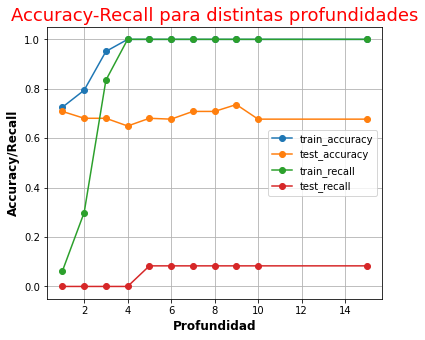

In [120]:
X = Total[['porcentajecasos', 'porcentajemuertes', 'porcentajeR']]
y = Total['Fase1']

lista_accuracy_train = []
lista_accuracy_test = []

lista_recall_train = []
lista_recall_test = []

depth = [1,2,3,4,5,6,7,8,9,10,15]

for m in depth:
    bosque = RandomForestClassifier(max_depth = m)
    bosque_scores = cross_validate(bosque, X, y, cv=4, scoring = ['accuracy','recall'], return_train_score=True, n_jobs = -1) 

    train_accuracy = np.mean(bosque_scores['train_accuracy'])
    test_accuracy = np.mean(bosque_scores['test_accuracy'])

    train_recall = np.mean(bosque_scores['train_recall'])
    test_recall = np.mean(bosque_scores['test_recall'])
    
    print(m, train_accuracy,  test_accuracy, train_recall, test_recall)

    lista_accuracy_train.append(train_accuracy)
    lista_accuracy_test.append(test_accuracy)
    
    lista_recall_train.append(train_recall)
    lista_recall_test.append(test_recall)
    
plt.figure(figsize = (6,5))
plt.plot(depth, lista_accuracy_train,'o-',label='train_accuracy' )
plt.plot(depth, lista_accuracy_test,'o-',label='test_accuracy')
plt.plot(depth, lista_recall_train,'o-',label='train_recall' )
plt.plot(depth, lista_recall_test,'o-',label='test_recall')
plt.grid(True)
plt.legend()
plt.xlabel("Profundidad", fontweight = "black", fontsize = 12)
plt.ylabel("Accuracy/Recall", fontweight = "black", fontsize = 12)
plt.title("Accuracy-Recall para distintas profundidades", fontsize = 18, color = "r")

plt.show()

Hacemos un gráfico para observar la el accuracy y el recall para distintas profunidades. Utilizamos cross validation sobre el test para poder tener mejores resultados. Observamos que la mejor profundidad para la relación de precisión-recall de 1 es la profundidad de 5. Ya cambiando la profundidad vemos una mejoría en nuestro modelo con un accuracy en Test cercana a 0.7 y un recall apenas mayor a 0, de un 0.0833. El recall sigue siendo muy pequeño comparado al indicador de R.

##### 1.2 CONCLUSOINES #####

In [121]:
conlu2 = {"Modelo":["Regresiòn Logística usando R", "RandomForestClassifier", "RandomForestClassifier"], 
          "Hiperparámetros": ["", "default", "max-depth = 5"], 
          "Precisión":["~0.61", "~0.7", "~0.67"],
           "Recall 1": ["~0.75", "~0.0", "~0.08"],
            "Recall 0": ["~0.57", "~1.0", ""]}

pd.DataFrame(conlu2)

,Modelo,Hiperparámetros,Precisión,Recall 1,Recall 0
0,Regresiòn Logística usando R,,~0.61,~0.75,~0.57
1,RandomForestClassifier,default,~0.7,~0.0,~1.0
2,RandomForestClassifier,max-depth = 5,~0.67,~0.08,


Podemos ver que nuestro mejor modelo es el que usamos con Regresión Logística con R. Tiene una precisión más baja, pero predice mejor los 1, que son los países con mayores restricciones. Podemos inferir que los otros modelos, al incluirse los otros indicadores se diluye el peso de R y por lo tanto no es mejor la predicción.

#### 2. INFORME FINAL ####

<u>**Primeras observaciones**</u>

Hemos hecho un primer acercamiento al dataset de la pandemia a nivel mundial. Lo primero que hemos observado es un dataset con muchos datos diversos sobre una gran cantidad de países. Esto ha sido tanto una gran ventaja, como también un gran desafío para elegir que datos tomar del dataset.

Emepezamos analizando el K del mundo y de 10 países de Europa para evaluar la evolución de la pandemia en sus primeros días. Por eso mismo elegimos 10 países del Norte, que fue donde empezó la pandemia. Al analizar este K con la ecuación exponencial dada: $C(t)=e^{k(t-t_0)}$ hemos observado una diferencia entre los 10 países de Europa con el K del mundo. El k del mundo se asemeja más al k mínimo de estos países que al promedio o al máximo. Al analizar esta situación llegamos a la conclusión que el k del mundo se asemejaba más al mínimo que al promedio de los países de Europa porque en los mismos días que estos países tenían un K grande, habían muchos otros países que recién estaban emepzando, es por eso que al final el K del mundo es menor que los países de Europa. Para poder desarrollar un mejor análisis sobre el K del mundo con países hubiera sido necesario tomar más datos de los k de países.

<u>**Aproximaciones a estrategias**</u>

Cuando empezamos a evaluar políticas públicas tomadas por los países y tratar de encacillarlas en etiquetas binarias nos encontramos con varios desafios. Quisimos seguir una política de si el país hizo cuarentena o no hizo cuarentena. Cuando nos acercamos al dataset encontramos una columna que nos podría beneficiar mucho, la de "stringency_index". Al analizar esta columna nos dimos cuenta que es una columna del grado de restricción de la cuarentena del país en cierta fecha específica que toma varios datos como pueden ser: escuelas cerradas, cierre de locales, limitación de circulación, etc. Este grado de restricción va de 0 a 100 y por lo que notamos no encontramos un solo país con ninguna restricción, sino con más o menos grado de restricción en ciertas fechas. Esto ya significó un gran desafío.

El segundo desafío con el que nos encontramos son las fechas para tomar ese grado de restricción. No es lo mismo tomar ciertas medidas cuando hay más o menos casos y en los países no podíamos comparar las mismas fechas porque no hubiera sido una buena comparación con los indicadores y los grados de restricción, hubiera sido menos preciso.

El tercer desafío con el que nos encontramos fueron los países a seleccionar. No es lo mismo seleccionar países de África y Europa para compararlos, pues estos países tienen una idionsicracia diferente y un estilo de vida distinto al momento de obedecer las medidas de restricción, al mismo tiempo que diferente calidad de medicina, nivel económico, etc. También África tiene diferente grado de densidad poblacional, por lo que podrían tener menos contagios. Esto se aplica a todos los continentes, e incluso a países del mismo continente. A pesar que en Europa existan difrerentes países que puedan ser afectados por estas características decidimos seleccionarlos para compararlos entre sí.

Con todos estos elementos hicimos una primera observación sobre los niveles de restricción de los países de Europa y los nuevos_casos_smoothed. Elegimos los nuevos_casos_smoothed, que son los casos acumulados en los últimos 7 días porque nos pareció menos suceptible a casos aislados donde un día podía tener casos altos en medio de otros días. 

Al visualizar estos primeros datos elegimos 5 países con un alto nivel de restricción y le pusimos 1. También elegimos 5 países con un menor nivel de restricción general y le pusimos 0. 

Ahora había que elegir las fechas y los indicadores. Elegimos tres indicadores que son muy típicos para medir el impacto de del coronavirus: "nuevos_casos_smoothed", "nuevas_muertes_smoothed" y R. Quisimo elegir casos en terapia intensiva, pero no pudimos por haber muchos faltantes de datos sobre esta columna. Al aproximarnos a la fecha para elegir nos pareció más adecuado elegir el pico de casos más alto por país, el cuál en Europa se dio cercano en fecha para muchos países. A partir de elegir el pico de nuevos_casos_smoothed lo partimos en dos fechas diferentes, una de 15 días antes y otra de 15 días después. Esto para medir el grado de restricción en promedio en estos 15 días antes y poder sacar su impacto en los indicadores. Para los indicadores tomamos los nueovs_casos_smoothed en promedio en esta primera fecha y el promedio en esta segunda fecha y tomamos la diferencia en porcentaje. También tomamos el R en estas mismas fechas con su promedio respectivo y la diferencia en porcentaje. Para el caso de las nuevas_muertes_smoothed tomamos el pico 21 días después que el pico de casos, ya que observamos que suele ser 21 días después del pico de muertes. Esto tiene sentido al ver como se desrrolla la enfermedad, la cuál dura aproximadamente 15 días, pero las personas internadas en terpaia intensiva que fallecen suelen tardar 21 hasta ese término. Por ello, para las muertes tomamos el pico 21 días después que el pico de casos y separamos en dos fechas de 15 días antes y después de la misma manera y tomamos el porcentaje de diferencia. El tomar el porcentaje de diferencia lo elegimos para ver si disminuyeron estos indicadores 15 días después de haber tomado las restricciones o no. En teoría, al ser mayores las restricciones los porcentajes de diferencia entre el periodo 1 y el periodo 2 debería ser mayor que en los países con menores restricciones. La cuenta que se hace para el porcentaje es el periodo1 - el periodo2, por lo que si da positivo el periodo1 fue mayor al periodo2, si da negativo el periodo2 en promedio fue mayor al periodo1.

Al terminar de elegir nuestras etiquetas binarias, indicadores y periodo de tiempo, al igual que los países, hicimos una tabla con todas las observaciones. Al ver esta tabla nos dimos cuenta que era mejor ajustar la categoría binaria de 1 para cuando el promedio de cuarentena los 15 días antes del pico es mayor a 70. También, al observar la tabla nos dimos cuenta, en principio, que no había mucha diferencia entre los indicadores que elegimos y al hacer los cuadros donde veíamos su distribución en comparación con sus etiquetas de 0 y 1 confirmamos un poco más esta teoría. Sin embargo, quisimos seguir con este estudio. Para poder observar mejor los indicadores en comparación con las etiquetas agrandamos el estudio para 20 países. Según este estudio pusimos límites para los cuales a partir de ese nùmero era 1 y antes de ese límite era 0. Esto lo aplicamos para los tres indicadores.

Aplicamos dos modelos para predecir, uno de regresión logística y otro de naive-bayes. Al hacer esto observamos nuestros 1s no eran predichos bien, pero nuestros 0s si. Esto sucedió para los primeros dos indicadores, de casos y de muertes. Para el R nos dio mejor la predicción de 1s y un poco peor la pedicción de 0s. Es por ello que elegimos este último modelo, por el recall y no tener una tan mala precisión.

Para la investigación posterior intentamos hacer un modelo de RandomForestClassifier con los tres indicadores. Sin emebargo, nos pasó lo mismo, predice bien los 0s, pero no los 1s. Por eso, nos quedamos con la regresión logística para el indicador de R.

<u>**Observaciones finales**</u>

El proyecto tuvo muchos desafíos, como los explicados en los párrafos anteriores. Uno de los desafíos anteriormente explicados es la diferencia entre los países, lo cuál creemos que influyó en nuestro estudio de los países Europeos también. Una de las variables que creemos pudo haber influenciado es la densidad poblacional. No es lo mismo un país con ciudades con mucha densidad poblacional a un país con menos densidad, donde los contagios se van a dar en menor medida.

También creemos que sería mejor juntar varios indicadores, no solo el nivel de restricción, sino sumar el nivel de testeos también por ejemplo.

Para concluir creemos que sería mejor comparar en un mismo país los efectos del nivel de restricción y su eficacia, ya que no solo implicaría el grado de restricción, sio también su duración. Es muy complicado hacer una comparación entre países ya que son muchas las variables que los diferencian.